In [38]:
import os
import pandas
import numpy as np
import torch
import matplotlib.pyplot as plt
import math
import isingmodellight
from isingmodellight import IsingModelLight
from scipy import stats
import time
import hcpdatautils as hcp

In [39]:
int_type = torch.int
float_type = torch.float
device = torch.device('cuda')

In [40]:
file_dir = 'E:\\Ising_model_results_daai'

In [41]:
def depytorch(t:torch.Tensor):
    return t.detach().cpu().numpy()

In [42]:
def make_histogram(name:str, values:torch.Tensor):
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
    axs.hist(  depytorch( values.flatten() )  )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(name)
    axs.set_ylabel('count in bin')
    axs.set_title(f'distribution of {name}')
    plt.show()

In [43]:
def print_stats(name:str, values:torch.Tensor):
    values = values.flatten()
    quantile_cutoffs = torch.tensor([0.025, 0.5, 0.975], dtype=float_type, device=device)
    quantiles = torch.quantile(values, quantile_cutoffs)
    min_val = torch.min(values)
    max_val = torch.max(values)
    print(f'The distribution of {name} values has median {quantiles[1].item():.3g} with 95% CI [{quantiles[0].item():.3g}, {quantiles[2].item():.3g}] and range [{min_val.item():.3g}, {max_val.item():.3g}].')

In [44]:
def print_stats_too_big(name:str, values:torch.Tensor):
    values, _ = torch.sort( values.flatten() )
    num_values = values.numel()
    min_val = values[0]
    low_end = (num_values * 25)//1000
    low_val = values[low_end]
    print(f'lower quantile {low_end}, -1 and +1', values[low_end-1], values[low_end], values[low_end+1] )
    half_index = num_values//2
    print(f'half way point {half_index}, -1 and +1', values[half_index-1], values[half_index], values[half_index+1] )
    if (num_values % 2) == 0:
        med_val = (values[half_index] + values[half_index+1])/2
    else:
        med_val = values[half_index+1]
    high_end = (num_values * 975)//1000
    high_val = values[high_end]
    print(f'upper quantile {high_end}, -1 and +1', values[high_end-1], values[high_end], values[high_end+1] )
    max_val = values[-1]
    print(f'The distribution of {name} values has median {med_val:.3g} with 95% CI [{low_val:.3g}, {high_val:.3g}] and range [{min_val:.3g}, {max_val:.3g}].')

In [45]:
def make_scatter(xname:str, xvalues:torch.Tensor, yname:str, yvalues:torch.Tensor, save:bool=False, file_name:str=None):
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
    axs.scatter(  depytorch( xvalues.flatten() ), depytorch( yvalues.flatten() )  )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(xname)
    axs.set_ylabel(yname)
    # axs.set_title(f'{xname} vs {yname}')
    plt.show()
    if save:
        plt.savefig(file_name)

In [46]:
def make_errorbar(xname:str, xvalues:torch.Tensor, yname:str, yvalues:torch.Tensor, yerrs:torch.Tensor, y_bounds=None, save:bool=False, file_name:str=None):
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
    x_flat = depytorch( xvalues.flatten() )
    y_flat = depytorch( yvalues.flatten() )
    axs.errorbar(  x=x_flat, y=y_flat, yerr=depytorch( yerrs.flatten() ), color='red', ecolor='blue'  )
    # axs.plot(x_flat, y_flat, color='red', label='mean', linewidth=10, fillstyle='full')
    if type(y_bounds) != type(None):
        axs.set_ylim(y_bounds)
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(xname)
    axs.set_ylabel(yname)
    # axs.legend()
    # axs.set_title(f'{xname} vs {yname}')
    plt.show()
    if save:
        plt.savefig(file_name)

In [47]:
def make_errorbar_two_sides(xname:str, xvalues:torch.Tensor, yname:str, yvalues:torch.Tensor, y_bounds=None, save:bool=False, file_name:str=None):
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
    y_middle = yvalues[:,1]
    y_low = y_middle - yvalues[:,0]
    y_high = yvalues[:,2] - y_middle
    y_err = torch.stack( (y_low,y_high), dim=0 )
    axs.errorbar(  x=depytorch(xvalues), y=depytorch(y_middle), yerr=depytorch(y_err), color='red', ecolor='blue'  )
    # axs.plot(x_flat, y_flat, color='red', label='mean', linewidth=10, fillstyle='full')
    if type(y_bounds) != type(None):
        axs.set_ylim(y_bounds)
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(xname)
    axs.set_ylabel(yname)
    # axs.legend()
    # axs.set_title(f'{xname} vs {yname}')
    plt.show()
    if save:
        plt.savefig(file_name)

In [48]:
def make_errorbar_two_sides_reuse_axs(axs, xname:str, xvalues:torch.Tensor, yname:str, yvalues:torch.Tensor, y_bounds=None, save:bool=False, file_name:str=None):
    y_middle = yvalues[:,1]
    y_low = y_middle - yvalues[:,0]
    y_high = yvalues[:,2] - y_middle
    y_err = torch.stack( (y_low,y_high), dim=0 )
    axs.errorbar(  x=depytorch(xvalues), y=depytorch(y_middle), yerr=depytorch(y_err), color='red', ecolor='blue'  )
    # axs.plot(x_flat, y_flat, color='red', label='mean', linewidth=10, fillstyle='full')
    if type(y_bounds) != type(None):
        axs.set_ylim(y_bounds)
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(xname)
    axs.set_ylabel(yname)
    axs.tick_params(axis='y', labelcolor='red')

In [49]:
def print_proportions_of_variance_explained(variable_name:str, explainer_name:str, values:torch.Tensor, dim):
    mean_of_variance = torch.mean( torch.var(values, dim=dim) )
    variance_of_mean = torch.var( torch.mean(values, dim=dim) )
    total_variance = torch.var(values)
    proportion_unexplained = mean_of_variance/total_variance
    proportion_explained = variance_of_mean/total_variance
    F_stat = variance_of_mean/mean_of_variance
    proportion_sum = proportion_explained + proportion_unexplained
    print(f'proportion of variance of {variable_name} explained by {explainer_name} = {variance_of_mean:.3g}/{total_variance:.3g} = {proportion_explained:.3g}. Proportion unexplained = {mean_of_variance:.3g}/{total_variance:.3g} = {proportion_unexplained:.3g}. F-stat = {F_stat:.3g}. Explained + unexplained = {proportion_sum:.3g}.')

In [50]:
def make_histogram_pair(values1:torch.Tensor, values2:torch.Tensor, label1:str, label2:str, xlabel:str, density:bool=True):
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
    values1_flat = values1.flatten().detach().cpu().numpy()
    values2_flat = values2.flatten().detach().cpu().numpy()
    axs.hist( values1_flat, label=label1, density=density )
    axs.hist( values2_flat, label=label2, density=density )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(xlabel)
    if density:
        axs.set_ylabel('density')
    else:
        axs.set_ylabel('count in bin')
    # axs.set_title(f'distribution of {xlabel}')
    axs.legend()
    plt.show()
    print( stats.mannwhitneyu(x=values1_flat, y=values2_flat) )

In [51]:
def show_square(values:torch.Tensor, width:int=10, height:int=10):
    fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(width, height) )
    cbax = axs.imshow( depytorch(values) )
    fig.colorbar(cbax, shrink=0.8)

In [52]:
training_index_start = 0
training_index_end = 670

In [16]:
num_thresholds = 121
min_threshold = -6.0
max_threshold = 6.0
as_is_vs_binarized_data_string = f'data_ts_training_vs_binarized_thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}'

In [17]:
cov_rmse = torch.load( os.path.join(file_dir, f'cov_rmse_{as_is_vs_binarized_data_string}.pt') )
print( 'cov_rmse size', cov_rmse.size() )
cov_corr = torch.load( os.path.join(file_dir, f'cov_corr_{as_is_vs_binarized_data_string}.pt') )
print( 'cov_corr size', cov_corr.size() )
fc_rmse = torch.load( os.path.join(file_dir, f'fc_rmse_{as_is_vs_binarized_data_string}.pt') )
print( 'fc_rmse size', fc_rmse.size() )
fc_corr = torch.load( os.path.join(file_dir, f'fc_corr_{as_is_vs_binarized_data_string}.pt') )
print( 'fc_corr size', fc_corr.size() )
group_cov_rmse = torch.load( os.path.join(file_dir, f'group_cov_rmse_{as_is_vs_binarized_data_string}.pt') )
print( 'group_cov_rmse size', group_cov_rmse.size() )
group_cov_corr = torch.load( os.path.join(file_dir, f'group_cov_corr_{as_is_vs_binarized_data_string}.pt') )
print( 'group_cov_corr size', group_cov_corr.size() )
group_fc_rmse = torch.load( os.path.join(file_dir, f'group_fc_rmse_{as_is_vs_binarized_data_string}.pt') )
print( 'group_fc_rmse size', group_fc_rmse.size() )
group_fc_corr = torch.load( os.path.join(file_dir, f'group_fc_corr_{as_is_vs_binarized_data_string}.pt') )
print( 'group_fc_corr size', group_fc_corr.size() )

FileNotFoundError: [Errno 2] No such file or directory: 'E:\\Ising_model_results_daai\\cov_rmse_data_ts_training_vs_binarized_thresholds_121_min_-6_max_6.pt'

In [32]:
print( cov_rmse[:,:9] )

tensor([[0.3617, 0.3911, 0.2850,  ..., 0.5174, 0.4894, 0.4153],
        [0.3617, 0.3910, 0.2850,  ..., 0.5174, 0.4894, 0.4153],
        [0.3617, 0.3910, 0.2850,  ..., 0.5174, 0.4894, 0.4153],
        ...,
        [0.3617, 0.3911, 0.2850,  ..., 0.5174, 0.4894, 0.4153],
        [0.3617, 0.3911, 0.2850,  ..., 0.5174, 0.4894, 0.4153],
        [0.3617, 0.3911, 0.2850,  ..., 0.5174, 0.4894, 0.4153]],
       device='cuda:0')


In [18]:
def get_med_and_ci(values:torch.Tensor, instances_dim:int=-1):
    quantiles = torch.tensor(data=[0.025, 0.975, 0.5], dtype=cov_rmse.dtype, device=cov_rmse.device)
    quant_vals = torch.quantile( input=torch.nan_to_num(values), q=quantiles, dim=instances_dim )
    med = quant_vals[-1,:]
    ci = torch.abs( quant_vals[:-1,:] - med.unsqueeze(dim=0) )
    return med, ci

In [19]:
def get_med_and_ci(values:torch.Tensor):
    thresholds_dim = 0
    instances_dim = 1
    quantiles = torch.tensor(data=[0.025, 0.975, 0.5], dtype=cov_rmse.dtype, device=cov_rmse.device)
    num_quantiles = quantiles.numel()
    num_thresholds = values.size(dim=thresholds_dim)
    quant_vals = torch.zeros( size=(num_quantiles, num_thresholds), dtype=values.dtype, device=values.device )
    for threshold_index in range(num_thresholds):
        vals_at_threshold = values[threshold_index,:]
        is_not_nan = torch.logical_not( torch.isnan(vals_at_threshold) )
        if torch.any(is_not_nan):
            not_nan_vals = vals_at_threshold[is_not_nan]
            quant_vals[:,threshold_index] = torch.quantile(input=not_nan_vals, q=quantiles)
    med = quant_vals[-1,:]
    ci = torch.abs( quant_vals[:-1,:] - med.unsqueeze(dim=0) )
    return med, ci

In [20]:
thresholds = torch.linspace(start=min_threshold, end=max_threshold, steps=num_thresholds, dtype=cov_rmse.dtype, device=cov_rmse.device)
cov_rmse_med, cov_rmse_ci = get_med_and_ci(values=cov_rmse)
print( 'cov_rmse_ci size', cov_rmse_ci.size() )
cov_corr_med, cov_corr_ci = get_med_and_ci(values=cov_corr)
print( 'cov_corr_ci size', cov_corr_ci.size() )
fc_rmse_med, fc_rmse_ci = get_med_and_ci(values=fc_rmse)
print( 'fc_rmse_ci size', fc_rmse_ci.size() )
fc_corr_med, fc_corr_ci = get_med_and_ci(values=fc_corr)
print( 'fc_corr_ci size', fc_corr_ci.size() )

NameError: name 'cov_rmse' is not defined

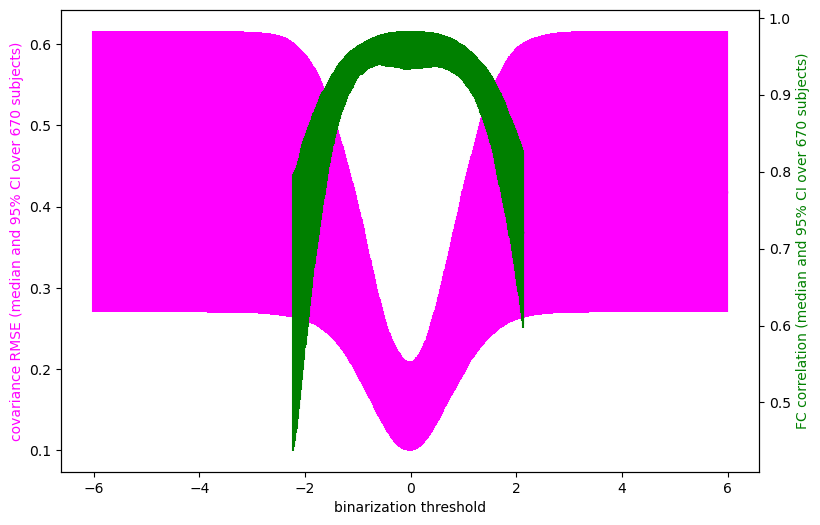

In [24]:
cov_color = 'magenta'
fc_color = 'green'
num_subjects = cov_rmse.size(dim=-1)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs2 = axs.twinx()
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(cov_rmse_med), yerr=depytorch(cov_rmse_ci), color=cov_color )
axs2.errorbar( x=depytorch(thresholds+0.01), y=depytorch(fc_corr_med), yerr=depytorch(fc_corr_ci), color=fc_color )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'covariance RMSE (median and 95% CI over {num_subjects} subjects)')
axs.yaxis.label.set_color(cov_color)
axs2.set_ylabel(f'FC correlation (median and 95% CI over {num_subjects} subjects)')
axs2.yaxis.label.set_color(fc_color)
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [27]:
vals_med = cov_rmse_med
vals_ci = cov_rmse_ci
group_vals = group_cov_rmse
stat_name = 'RMSE'
quantity_name = 'covariance'

In [36]:
vals_med = cov_corr_med
vals_ci = cov_corr_ci
group_vals = group_cov_corr
stat_name = 'correlation'
quantity_name = 'covariance'

In [21]:
vals_med = fc_corr_med
vals_ci = fc_corr_ci
group_vals = group_fc_corr
stat_name = 'correlation'
quantity_name = 'FC'

NameError: name 'fc_corr_med' is not defined

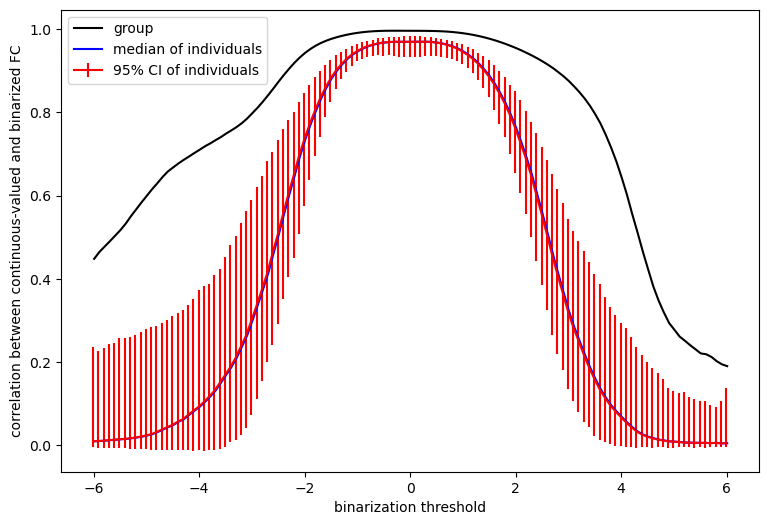

In [42]:
individual_color = 'red'
individual_med_color = 'blue'
group_color = 'black'
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(vals_med), yerr=depytorch(vals_ci), color=individual_color, label='95% CI of individuals' )
axs.plot( depytorch(thresholds+0.01), depytorch(group_vals), color=group_color, label='group' )
axs.plot( depytorch(thresholds+0.01), depytorch(vals_med), color=individual_med_color, label='median of individuals' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.legend()
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'{stat_name} between continuous-valued and binarized {quantity_name}')
# axs.set_title(f'{xname} vs {yname}')
plt.show()

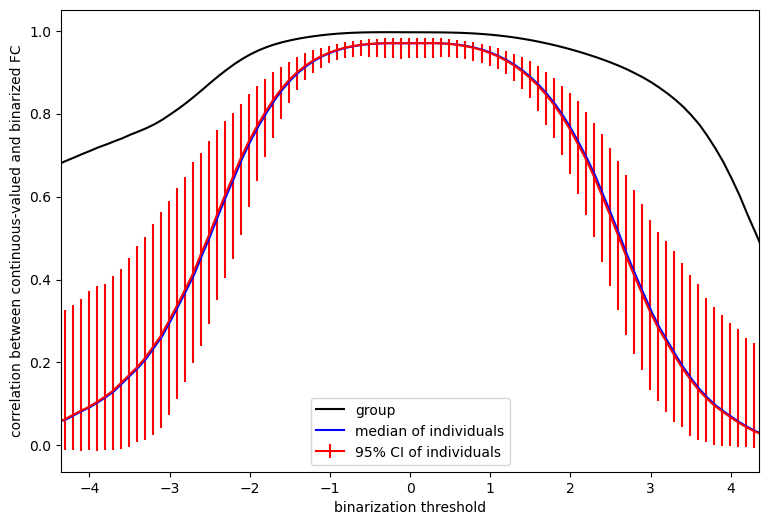

In [58]:
individual_color = 'red'
individual_med_color = 'blue'
group_color = 'black'
num_subjects = cov_rmse.size(dim=-1)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs.plot( depytorch(thresholds+0.01), depytorch(group_fc_corr), color=group_color, label='group' )
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(fc_corr_med), yerr=depytorch(fc_corr_ci), color=individual_color, label='95% CI of individuals' )
axs.plot( depytorch(thresholds+0.01), depytorch(fc_corr_med), color=individual_med_color, label='median of individuals' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlim([-4.35, 4.35])
axs.legend()
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'correlation between continuous-valued and binarized FC')
# axs.set_title(f'{xname} vs {yname}')
plt.show()

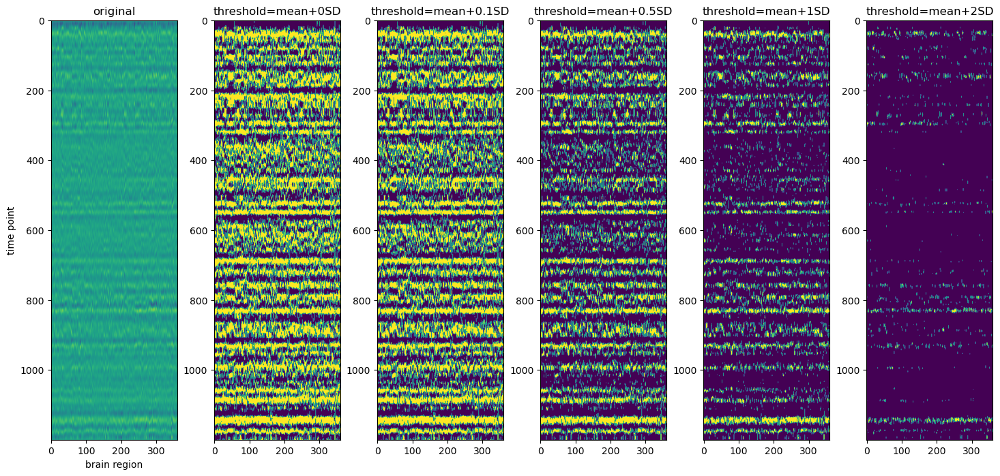

In [14]:
thresholds = [0, 0.1, 0.5, 1, 2]
num_thresholds = len(thresholds)
width = 18
height = 8
fig, axs = plt.subplots( nrows=1, ncols=num_thresholds+1, figsize=(width, height) )
data_ts = torch.load( os.path.join(file_dir, 'data_ts_all_as_is.pt') )[0,0,:,:].transpose(dim0=0, dim1=1)
data_ts_std, data_ts_mean = torch.std_mean(data_ts, dim=0, keepdim=True)
axs[0].imshow( depytorch(data_ts) )
axs[0].set_title(f'original')
axs[0].set_ylabel('time point')
axs[0].set_xlabel('brain region')
for threshold_index in range(num_thresholds):
    threshold = thresholds[threshold_index]
    plot_index = threshold_index+1
    data_ts_binary = data_ts >= (data_ts_mean + threshold*data_ts_std)
    axs[plot_index].imshow( depytorch(data_ts_binary) )
    axs[plot_index].set_title(f'threshold=mean+{threshold:.3g}SD')

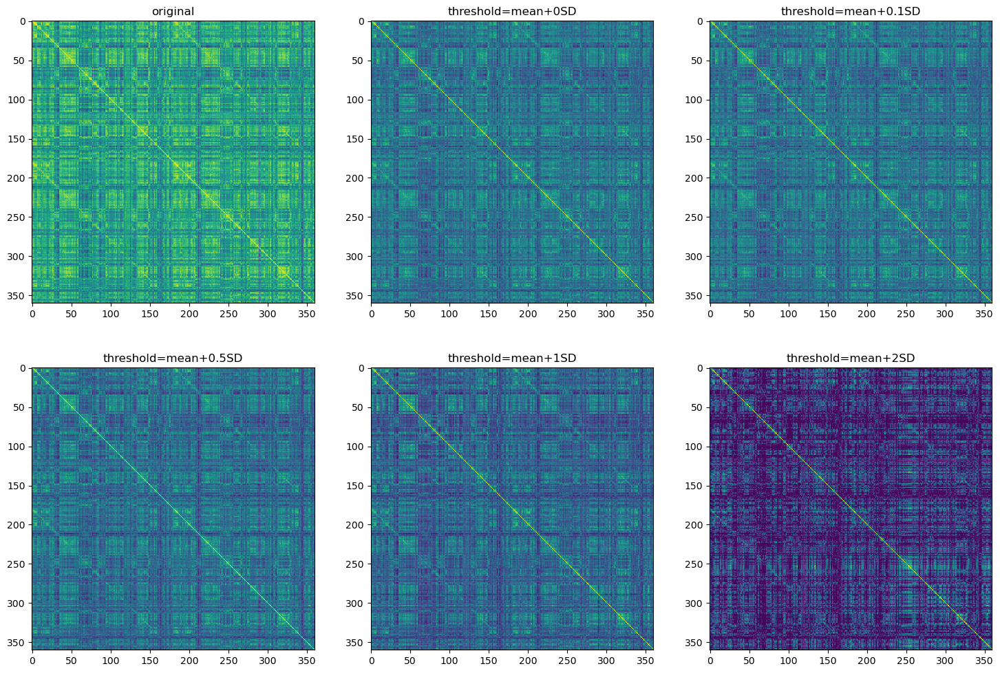

In [21]:
thresholds = [0, 0.1, 0.5, 1, 2]
num_thresholds = len(thresholds)
width = 18
height = 12
fig, axs = plt.subplots( nrows=2, ncols=3, figsize=(width, height) )
mean_state_file = os.path.join(file_dir, 'mean_state_all_as_is.pt')
mean_state_product_file = os.path.join(file_dir, 'mean_state_product_all_as_is.pt')
data_ts = isingmodellight.get_fc( state_mean=torch.load(mean_state_file)[0:1,0:1,:], state_product_mean=torch.load(mean_state_product_file)[0:1,0:1,:,:] )
axs[0,0].imshow( depytorch(data_ts[0,0,:,:]) )
axs[0,0].set_title(f'original')
# axs[0,0].set_ylabel('time point')
# axs[0,0].set_xlabel('brain region')
row = [0,0,1,1,1]
col = [1,2,0,1,2]
for threshold_index in range(num_thresholds):
    threshold = thresholds[threshold_index]
    plot_index = threshold_index+1
    mean_state_file = os.path.join(file_dir, f'mean_state_all_mean_std_{threshold:.3g}.pt')
    mean_state_product_file = os.path.join(file_dir, f'mean_state_product_all_mean_std_{threshold:.3g}.pt')
    data_fc = isingmodellight.get_fc( state_mean=torch.load(mean_state_file)[0:1,0:1,:], state_product_mean=torch.load(mean_state_product_file)[0:1,0:1,:,:] )
    r = row[threshold_index]
    c = col[threshold_index]
    axs[r,c].imshow( depytorch(data_fc[0,0,:,:]) )
    axs[r,c].set_title(f'threshold=mean+{threshold:.3g}SD')

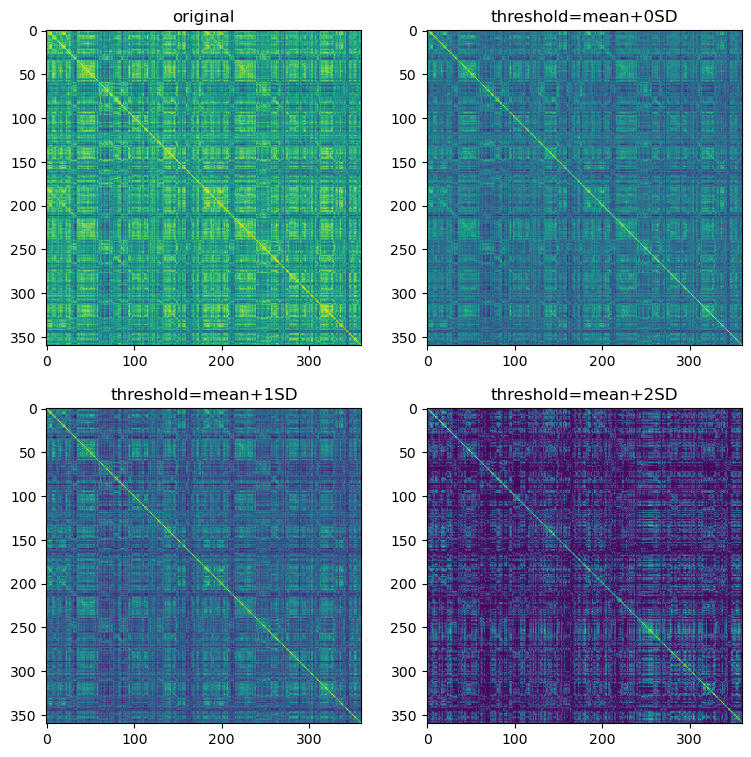

In [22]:
thresholds = [0, 1, 2]
num_thresholds = len(thresholds)
width = 9
height = 9
fig, axs = plt.subplots( nrows=2, ncols=2, figsize=(width, height) )
mean_state_file = os.path.join(file_dir, 'mean_state_all_as_is.pt')
mean_state_product_file = os.path.join(file_dir, 'mean_state_product_all_as_is.pt')
data_ts = isingmodellight.get_fc( state_mean=torch.load(mean_state_file)[0:1,0:1,:], state_product_mean=torch.load(mean_state_product_file)[0:1,0:1,:,:] )
axs[0,0].imshow( depytorch(data_ts[0,0,:,:]) )
axs[0,0].set_title(f'original')
# axs[0,0].set_ylabel('time point')
# axs[0,0].set_xlabel('brain region')
row = [0,1,1]
col = [1,0,1]
for threshold_index in range(num_thresholds):
    threshold = thresholds[threshold_index]
    plot_index = threshold_index+1
    mean_state_file = os.path.join(file_dir, f'mean_state_all_mean_std_{threshold:.3g}.pt')
    mean_state_product_file = os.path.join(file_dir, f'mean_state_product_all_mean_std_{threshold:.3g}.pt')
    data_fc = isingmodellight.get_fc( state_mean=torch.load(mean_state_file)[0:1,0:1,:], state_product_mean=torch.load(mean_state_product_file)[0:1,0:1,:,:] )
    r = row[threshold_index]
    c = col[threshold_index]
    axs[r,c].imshow( depytorch(data_fc[0,0,:,:]) )
    axs[r,c].set_title(f'threshold=mean+{threshold:.3g}SD')

In [29]:
threshold_choices, flip_rate_quantiles, cov_rmse_quantiles, fc_corr_quantiles = torch.load( os.path.join(file_dir, 'flip_rate_and_fc_rmse_ci_all_as_is_choices_1000_from_-4_to_4.pt') )
x_label = 'binarization threshold in standard deviations relative to mean'
print( threshold_choices.size() )
print( flip_rate_quantiles.size() )
print( cov_rmse_quantiles.size() )
print( fc_corr_quantiles.size() )

torch.Size([1000])
torch.Size([1000, 3])
torch.Size([1000, 3])
torch.Size([1000, 3])


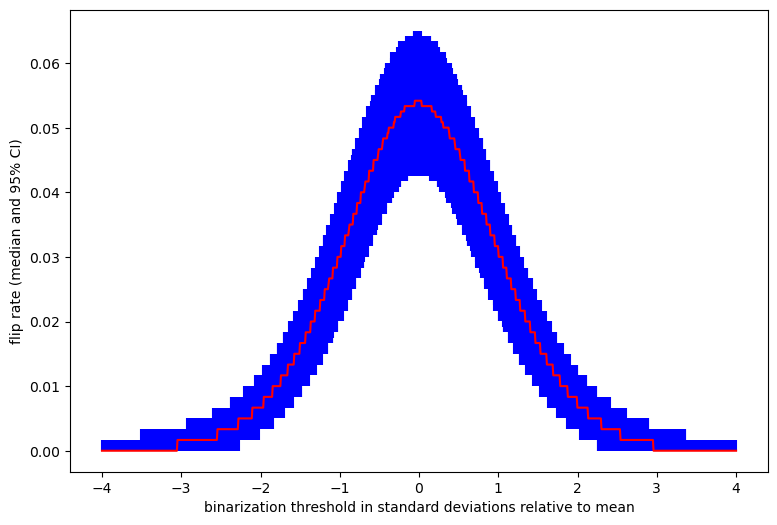

In [32]:
make_errorbar_two_sides(xname=x_label, xvalues=threshold_choices, yname='flip rate (median and 95% CI)', yvalues=flip_rate_quantiles)

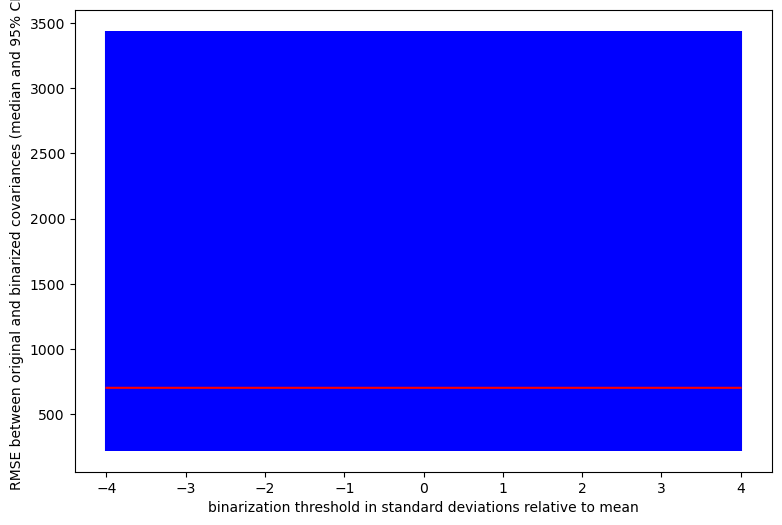

In [33]:
make_errorbar_two_sides(xname=x_label, xvalues=threshold_choices, yname='RMSE between original and binarized covariances (median and 95% CI)', yvalues=cov_rmse_quantiles)

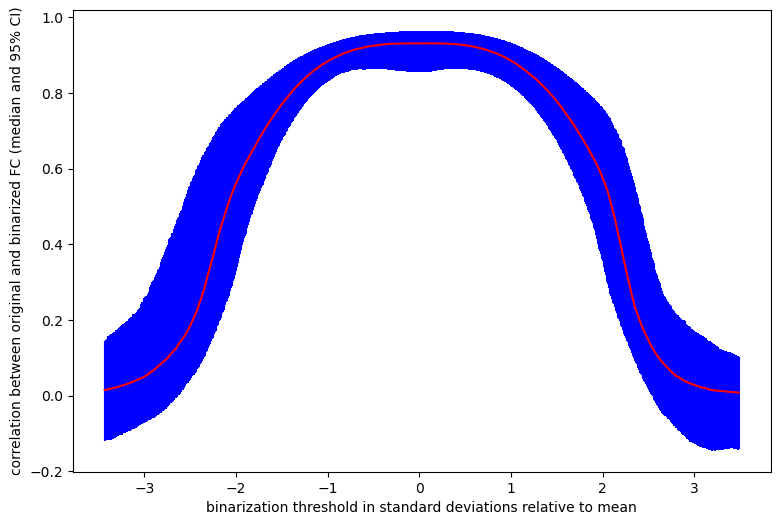

In [34]:
make_errorbar_two_sides(xname=x_label, xvalues=threshold_choices, yname='correlation between original and binarized FC (median and 95% CI)', yvalues=fc_corr_quantiles)

In [48]:
avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_selected_choices_5.pt') )
avalanche_probs = avalanche_counts/avalanche_counts.sum(dim=-1,keepdim=True)
avalanche_sizes = torch.arange( avalanche_counts.size(dim=-1), device=device )
max_prob, max_index = avalanche_probs.max(dim=-1)
print(max_index, max_prob)
most_probable_size = avalanche_sizes[max_index]
thresholds = [0, 0.1, 0.5, 1, 2]
for threshold_index in range( len(thresholds) ):
    print(f'at threshold {thresholds[threshold_index]:.3g}, size {most_probable_size[threshold_index]} is most probable with probability {max_prob[threshold_index]:.3g}')

tensor([16, 17, 14,  0,  0], device='cuda:0') tensor([0.0444, 0.0444, 0.0418, 0.0756, 0.4871], device='cuda:0')
at threshold 0, size 16 is most probable with probability 0.0444
at threshold 0.1, size 17 is most probable with probability 0.0444
at threshold 0.5, size 14 is most probable with probability 0.0418
at threshold 1, size 0 is most probable with probability 0.0756
at threshold 2, size 0 is most probable with probability 0.487


torch.Size([5, 361])


Text(0, 0.5, 'probability')

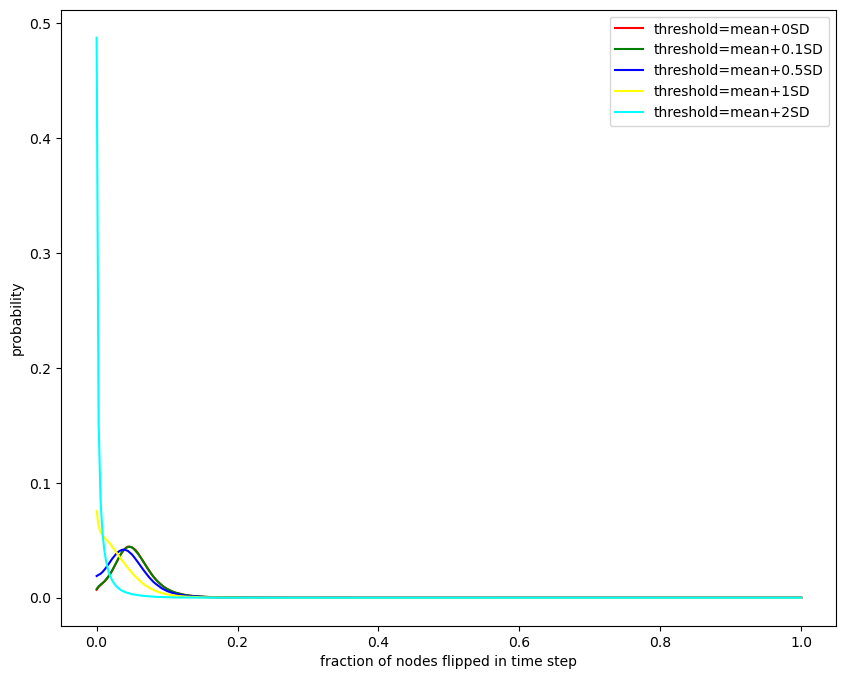

In [41]:
avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_selected_choices_5.pt') )
avalanche_probs = depytorch(  ( avalanche_counts/avalanche_counts.sum(dim=-1,keepdim=True) )  )
num_nodes = avalanche_counts.size(dim=-1) - 1
avalanche_sizes = depytorch(   (  torch.arange( avalanche_counts.size(dim=-1) )/num_nodes  )   )
thresholds = [0, 0.1, 0.5, 1, 2]
colors = ['red', 'green', 'blue', 'yellow', 'cyan']
print( avalanche_counts.size() )
num_choices = len(thresholds)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
for threshold_index in range(num_choices):
    threshold = thresholds[threshold_index]
    axs.plot(avalanche_sizes, avalanche_probs[threshold_index,:], color=colors[threshold_index], label=f'threshold=mean+{threshold:.3g}SD')
axs.legend()
axs.set_xlabel('fraction of nodes flipped in time step')
axs.set_ylabel('probability')

torch.Size([5, 361])


Text(0, 0.5, 'log10(probability)')

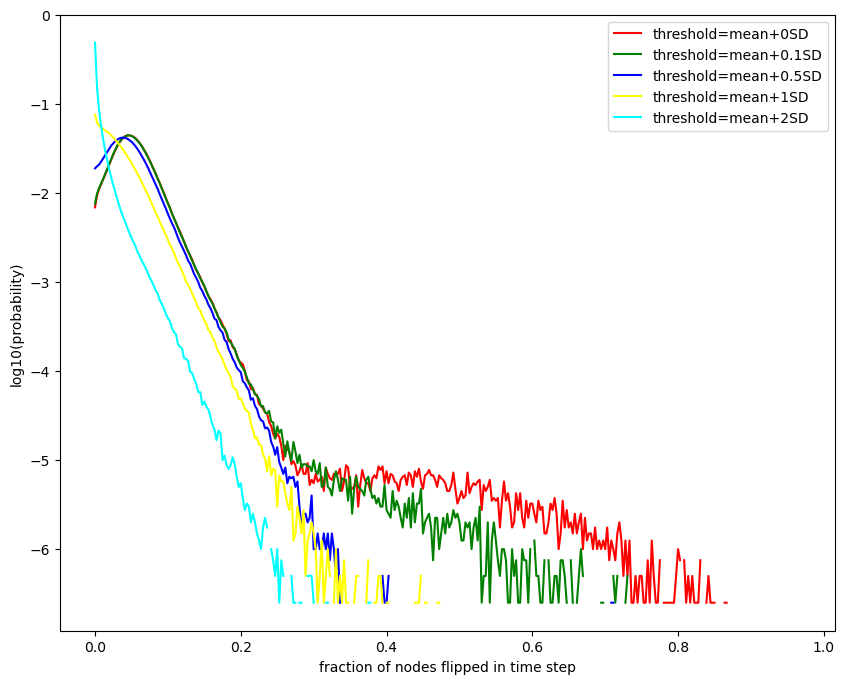

In [42]:
avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_selected_choices_5.pt') )
avalanche_probs = depytorch(  ( avalanche_counts/avalanche_counts.sum(dim=-1,keepdim=True) ).log10()  )
num_nodes = avalanche_counts.size(dim=-1) - 1
avalanche_sizes = depytorch(   (  torch.arange( avalanche_counts.size(dim=-1) )/num_nodes  )   )
thresholds = [0, 0.1, 0.5, 1, 2]
colors = ['red', 'green', 'blue', 'yellow', 'cyan']
print( avalanche_counts.size() )
num_choices = len(thresholds)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
for threshold_index in range(num_choices):
    threshold = thresholds[threshold_index]
    axs.plot(avalanche_sizes, avalanche_probs[threshold_index,:], color=colors[threshold_index], label=f'threshold=mean+{threshold:.3g}SD')
axs.legend()
axs.set_xlabel('fraction of nodes flipped in time step')
axs.set_ylabel('log10(probability)')

torch.Size([5, 361])


Text(0, 0.5, 'probability')

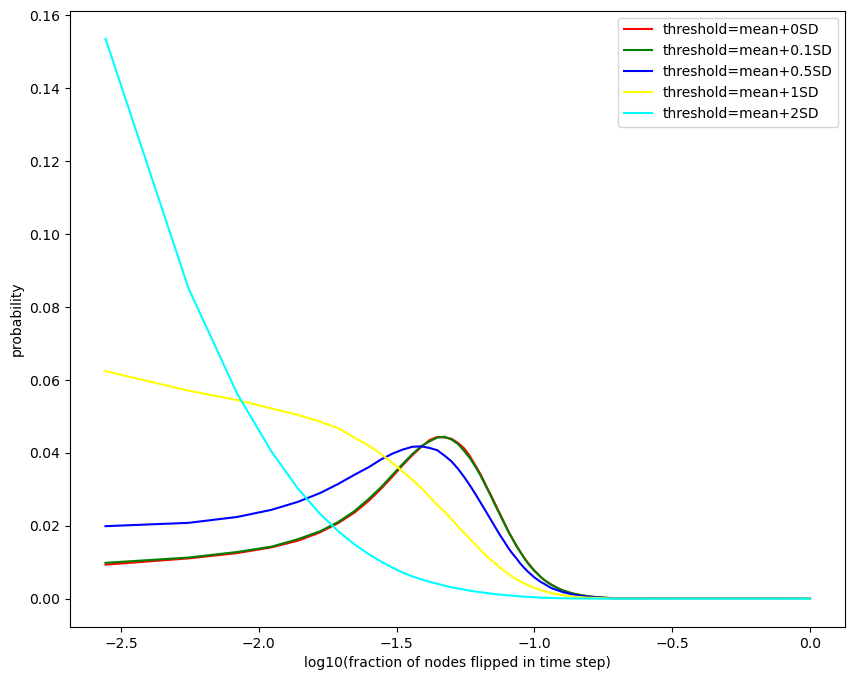

In [43]:
avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_selected_choices_5.pt') )
avalanche_probs = depytorch(  ( avalanche_counts/avalanche_counts.sum(dim=-1,keepdim=True) )  )
num_nodes = avalanche_counts.size(dim=-1) - 1
avalanche_sizes = depytorch(   (  torch.arange( avalanche_counts.size(dim=-1) )/num_nodes  ).log10()   )
thresholds = [0, 0.1, 0.5, 1, 2]
colors = ['red', 'green', 'blue', 'yellow', 'cyan']
print( avalanche_counts.size() )
num_choices = len(thresholds)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
for threshold_index in range(num_choices):
    threshold = thresholds[threshold_index]
    axs.plot(avalanche_sizes, avalanche_probs[threshold_index,:], color=colors[threshold_index], label=f'threshold=mean+{threshold:.3g}SD')
axs.legend()
axs.set_xlabel('log10(fraction of nodes flipped in time step)')
axs.set_ylabel('probability')

torch.Size([5, 361])


Text(0, 0.5, 'log10(probability)')

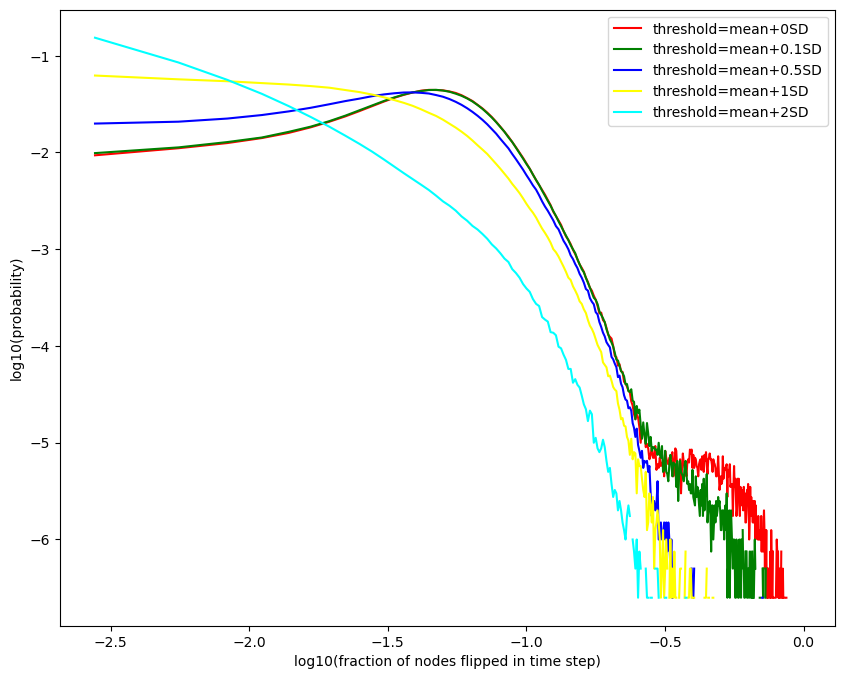

In [40]:
avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_selected_choices_5.pt') )
avalanche_probs = depytorch(  ( avalanche_counts/avalanche_counts.sum(dim=-1,keepdim=True) ).log10()  )
num_nodes = avalanche_counts.size(dim=-1) - 1
avalanche_sizes = depytorch(   (  torch.arange( avalanche_counts.size(dim=-1) )/num_nodes  ).log10()   )
thresholds = [0, 0.1, 0.5, 1, 2]
colors = ['red', 'green', 'blue', 'yellow', 'cyan']
print( avalanche_counts.size() )
num_choices = len(thresholds)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
for threshold_index in range(num_choices):
    threshold = thresholds[threshold_index]
    axs.plot(avalanche_sizes, avalanche_probs[threshold_index,:], color=colors[threshold_index], label=f'threshold=mean+{threshold:.3g}SD')
axs.legend()
axs.set_xlabel('log10(fraction of nodes flipped in time step)')
axs.set_ylabel('log10(probability)')

In [16]:
def get_cov(mean_state_file:str, mean_state_product_file:str):
    mean_state = torch.load( os.path.join(file_dir, mean_state_file) )
    mean_state_product = torch.load( os.path.join(file_dir, mean_state_product_file) )
    return mean_state_product - mean_state.unsqueeze(dim=-2) * mean_state.unsqueeze(dim=-1)

In [17]:
def get_sim_cov(sim_file_fragment:str):
    return get_cov(mean_state_file=f'sim_state_mean_{sim_file_fragment}.pt', mean_state_product_file=f'sim_state_product_mean_{sim_file_fragment}.pt').squeeze(dim=1)

In [18]:
def get_data_cov(data_file_fragment:str):
    return get_cov(mean_state_file=f'mean_state_{data_file_fragment}.pt', mean_state_product_file=f'mean_state_product_{data_file_fragment}.pt')[:,0,:,:].mean(dim=0)

In [19]:
def get_cov_rmse():
    sim_cov = get_sim_cov(sim_file_fragment='all_mean_std_0_beta_demo_subject_0_init_uncentered_beta_num_10000_min_1e-09_max_1_steps_120000')
    print( sim_cov.size() )
    data_cov = get_data_cov(data_file_fragment='all_mean_std_0')
    print( data_cov.size() )
    return isingmodellight.get_pairwise_rmse_ut( mat1=sim_cov.unsqueeze(dim=0), mat2=data_cov.unsqueeze(dim=0).unsqueeze(dim=0) ).squeeze(dim=0)

In [20]:
cov_rmse = get_cov_rmse()
print( cov_rmse.size() )

torch.Size([10000, 360, 360])
torch.Size([360, 360])
torch.Size([1, 10000])


In [95]:
quantiles = torch.tensor([0.025, 0.5, 0.975], dtype=float_type, device=device)
threshold = 0
# sim_file_fragment = 'all_mean_std_0_beta_demo_subject_0_init_uncentered_beta_num_10000_min_1e-09_max_1_steps_120000'
sim_file_fragment = f'all_mean_std_{threshold:.3g}_beta_demo_subject_0_init_uncentered_beta_num_10000_min_1e-09_max_1_steps_1200'
flip_rate_file = os.path.join(file_dir, f'flip_rate_{sim_file_fragment}.pt')
flip_rate_quantiles = torch.quantile( torch.load(flip_rate_file).squeeze(dim=1), q=quantiles, dim=-1 ).transpose(dim0=0, dim1=1)
print( flip_rate_quantiles.size() )
cov_rmse_file = os.path.join(file_dir, f'cov_rmse_{sim_file_fragment}.pt')
cov_rmse = torch.load(cov_rmse_file).squeeze(dim=-1)
print( cov_rmse.size() )

torch.Size([10000, 3])
torch.Size([10000])


In [96]:
beta = torch.linspace( start=1e-09, end=1, steps=cov_rmse.numel(), dtype=cov_rmse.dtype, device=cov_rmse.device )

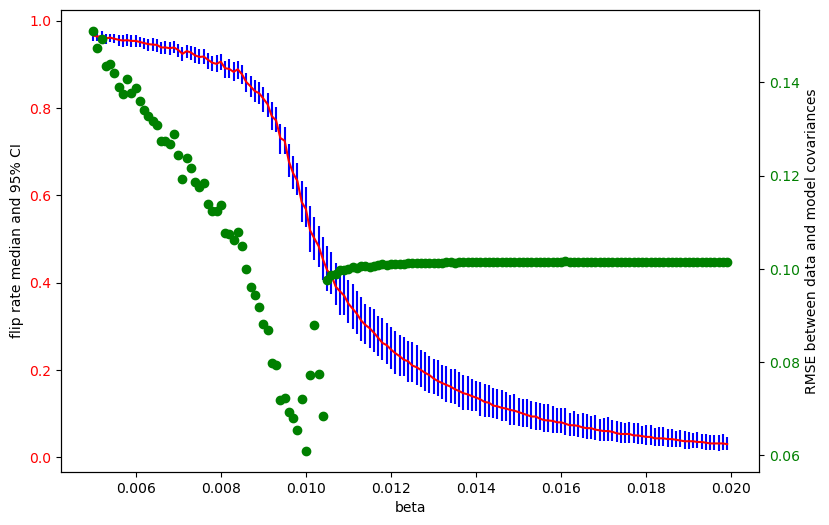

In [86]:
# Sequences
start_index = 50
stop_index = 200

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))

beta_np = depytorch(beta[start_index:stop_index])

# Plot linear sequence, and set tick labels to the same color
make_errorbar_two_sides_reuse_axs(ax, xname='beta', xvalues=beta[start_index:stop_index], yname='flip rate median and 95% CI', yvalues=flip_rate_quantiles[start_index:stop_index,:])

# Generate a new Axes instance, on the twin-X axes (same position)
ax2 = ax.twinx()

# Plot exponential sequence, set scale to logarithmic and change tick color
ax2.scatter( beta_np, depytorch(cov_rmse[start_index:stop_index]), color='green' )
# ax2.set_yscale('log')
ax2.tick_params(axis='y', labelcolor='green')
ax2.set_ylabel('RMSE between data and model covariances')
ax2.set_xlabel('beta')
plt.show()

In [97]:
best_index = torch.argmin(cov_rmse)
print( beta[best_index].item() )
print( flip_rate_quantiles[best_index,:].tolist() )

0.02980298176407814
[0.34166666865348816, 0.48000001907348633, 0.7204374074935913]


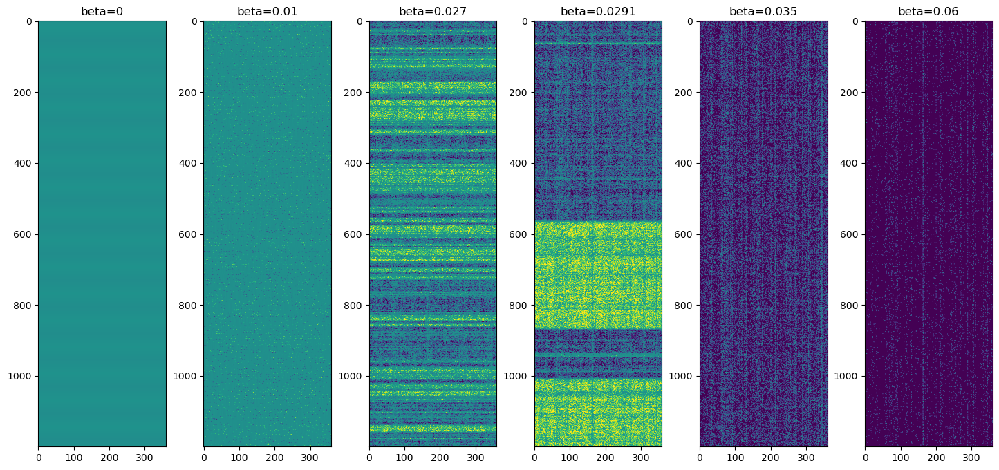

In [16]:
betas = [0.0, 0.01, 0.027, 0.029102912172675133, 0.035, 0.06]
num_betas = len(betas)
width = 18
height = 8
fig, axs = plt.subplots( nrows=1, ncols=num_betas, figsize=(width, height) )
sim_ts = torch.load( os.path.join(file_dir, 'time_series_all_mean_std_0_short_subject_0_init_uncentered_beta_num_6_selected_beta_steps_1200.pt') ).transpose(dim0=-2, dim1=-1)
for beta_index in range(num_betas):
    beta = betas[beta_index]
    plot_index = beta_index
    axs[plot_index].imshow(  depytorch( sim_ts[beta_index,0,:,:] )  )
    axs[plot_index].set_title(f'beta={beta:.3g}')

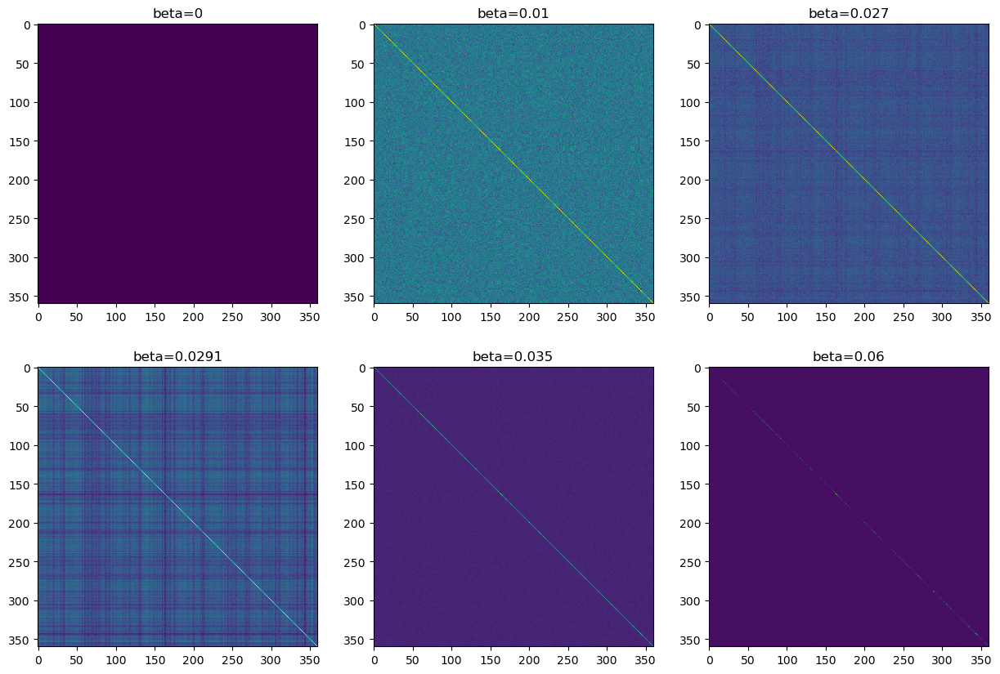

In [20]:
betas = [0.0, 0.01, 0.027, 0.029102912172675133, 0.035, 0.06]
num_betas = len(betas)
width = 15
height = 10
fig, axs = plt.subplots( nrows=2, ncols=num_betas//2, figsize=(width, height) )
sim_cov = torch.load( os.path.join(file_dir, 'sim_cov_all_mean_std_0_short_subject_0_init_uncentered_beta_num_6_selected_beta_steps_1200.pt') ).transpose(dim0=-2, dim1=-1)
rows = [0, 0, 0, 1, 1, 1]
cols = [0, 1, 2, 0, 1, 2]
for beta_index in range(num_betas):
    beta = betas[beta_index]
    plot_index = beta_index
    row = rows[beta_index]
    col = cols[beta_index]
    axs[row,col].imshow(  depytorch( sim_cov[beta_index,0,:,:] )  )
    axs[row,col].set_title(f'beta={beta:.3g}')

The distribution of FC correlation for 1000 parameter updates values has median 0.941 with 95% CI [0.842, 0.977] and range [0.15, 0.986].
The distribution of FC correlation for 2000 parameter updates values has median 0.972 with 95% CI [0.927, 0.988] and range [0.842, 0.992].
The distribution of FC correlation for 3000 parameter updates values has median 0.98 with 95% CI [0.949, 0.991] and range [0.863, 0.994].
The distribution of FC correlation for 4000 parameter updates values has median 0.985 with 95% CI [0.961, 0.993] and range [0.883, 0.996].
The distribution of FC correlation for 5000 parameter updates values has median 0.987 with 95% CI [0.964, 0.994] and range [0.909, 0.996].
The distribution of FC correlation for 6000 parameter updates values has median 0.989 with 95% CI [0.969, 0.995] and range [0.865, 0.997].
The distribution of FC correlation for 7000 parameter updates values has median 0.99 with 95% CI [0.967, 0.996] and range [0.908, 0.998].
The distribution of FC correla

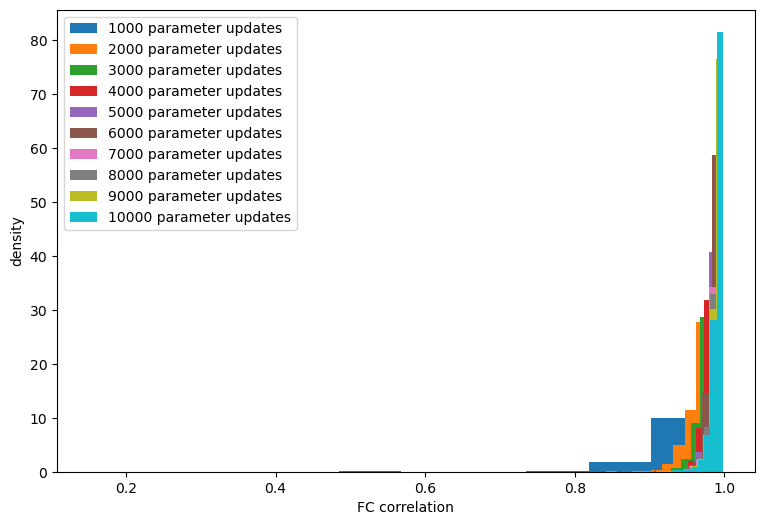

In [54]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'FC correlation'
for num_updates in [1000*x for x in range(1,11)]:
    model_file_name_part_mean_std = f'all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_{num_updates}_test_length_120000'
    fc_corr = torch.load( os.path.join(file_dir, f'fc_corr_{model_file_name_part_mean_std}.pt') )
    training_values = fc_corr[:,training_index_start:training_index_end]
    axs.hist( depytorch(training_values).flatten(), label=f'{num_updates} parameter updates', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for {num_updates} parameter updates', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of FC correlation for threshold mean + 0std.dev. values has median 0.98 with 95% CI [0.949, 0.991] and range [0.863, 0.994].
The distribution of FC correlation for threshold mean + 0.1std.dev. values has median 0.98 with 95% CI [0.949, 0.991] and range [0.85, 0.994].
The distribution of FC correlation for threshold mean + 0.5std.dev. values has median 0.954 with 95% CI [0.903, 0.975] and range [0.0932, 0.983].
The distribution of FC correlation for threshold mean + 1std.dev. values has median 0.52 with 95% CI [-0.123, 0.838] and range [-0.245, 0.907].
The distribution of FC correlation for threshold mean + 2std.dev. values has median 0.0386 with 95% CI [0.0172, 0.0669] and range [0.00307, 0.12].


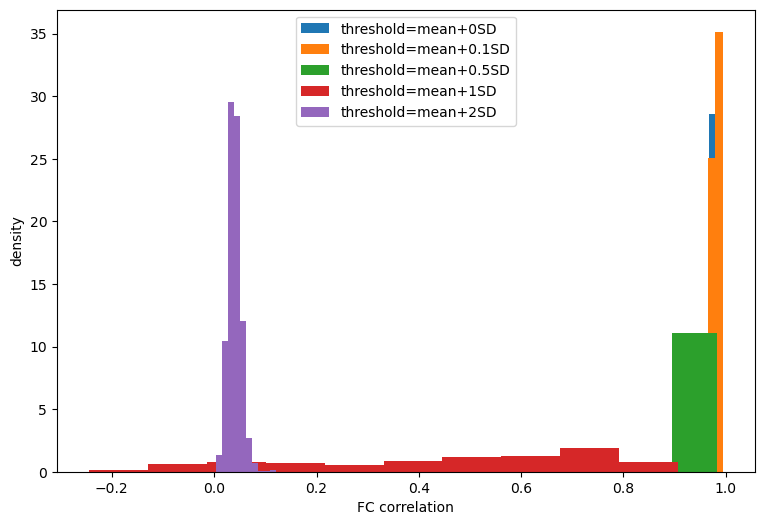

In [18]:
thresholds = [0, 0.1, 0.5, 1, 2]
beta_opt_lengths = [71, 73, 93, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'FC correlation'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    fc_corr = torch.load( os.path.join(file_dir, f'fc_corr_{model_file_name_part_mean_std}.pt') )
    training_values = fc_corr[:,training_index_start:training_index_end]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}SD', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

In [22]:
corr_file_fragment = 'all_as_is_all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_10000_signed_params_times_beta_permutations_1000000'
# corr_file_fragment = 'all_as_is_all_mean_std_0.5_medium_init_uncentered_reps_10_target_cov_rmse_lr_0.01_steps_1200_pupd_per_bopt_1000_num_opt_0_bopt_steps_175_popt_steps_10000_signed_params_no_beta_permutations_100000'
true_correlations = torch.load( os.path.join(file_dir, f'true_correlations_{corr_file_fragment}.pt') )
print( true_correlations.size() )
subject_perm_correlations = torch.load( os.path.join(file_dir, f'perm_correlations_subjects_{corr_file_fragment}.pt') )
print( subject_perm_correlations.size() )
node_perm_correlations = torch.load( os.path.join(file_dir, f'perm_correlations_nodes_{corr_file_fragment}.pt') )
print( node_perm_correlations.size() )

torch.Size([24])
torch.Size([1000000, 24])
torch.Size([1000000, 24])


In [23]:
feature_names = ['thickness', 'myelination', 'curvature', 'sulcus depth', 'mean SC', 'x', 'y', 'z', 'radius', 'inclination', 'azimuth', 'SC', '|thickness difference|', '|myelination difference|', '|curvature difference|', '|sulcus depth difference|', '|mean SC difference|', '|x difference|', '|y difference|', '|z difference|', '|radius difference|', '|inclination difference|', '|azimuth difference|', 'distance']
num_features = len(feature_names)
num_subject_permutations = subject_perm_correlations.size(dim=0)
print(num_features)
p_subject = torch.count_nonzero( subject_perm_correlations.abs() >= true_correlations.abs().unsqueeze(dim=0), dim=0 )/subject_perm_correlations.size(dim=0)
p_node = torch.count_nonzero( node_perm_correlations.abs() >= true_correlations.abs().unsqueeze(dim=0), dim=0 )/node_perm_correlations.size(dim=0)
q = torch.tensor([0.025, 0.975], dtype=float_type, device=device)
subject_ci = torch.quantile(subject_perm_correlations, q=q, dim=0)
node_ci = torch.quantile(node_perm_correlations, q=q, dim=0)
for feature_index in range(num_features):
    print(f'{feature_names[feature_index]} & {true_correlations[feature_index]:.3g} & {p_subject[feature_index]:.3g} & [{subject_ci[0,feature_index]:.3g}, {subject_ci[1,feature_index]:.3g}] & {p_node[feature_index]:.3g} & [{node_ci[0,feature_index]:.3g}, {node_ci[1,feature_index]:.3g}] \\')

24
thickness & -0.0129 & 0.0417 & [-0.0131, -0.00947] & 0.113 & [-0.0158, 0.0161] \
myelination & 0.00458 & 0.0775 & [0.00249, 0.00491] & 0.613 & [-0.0176, 0.0177] \
curvature & 0.0478 & 0 & [0.0199, 0.0252] & 0 & [-0.0141, 0.0141] \
sulcus depth & 0.0404 & 0 & [0.0235, 0.0275] & 0 & [-0.0164, 0.0165] \
mean SC & 0.0261 & 0 & [0.0141, 0.0178] & 0.0019 & [-0.0167, 0.0163] \
x & 0.00254 & 1 & [0.00254, 0.00254] & 0.79 & [-0.0186, 0.0186] \
y & 0.0486 & 1 & [0.0486, 0.0486] & 0 & [-0.0187, 0.0187] \
z & 0.00022 & 1 & [0.00022, 0.00022] & 0.982 & [-0.0187, 0.0187] \
radius & -0.0297 & 1 & [-0.0297, -0.0297] & 0.00166 & [-0.0187, 0.0186] \
inclination & 0.00128 & 1 & [0.00128, 0.00128] & 0.893 & [-0.0187, 0.0187] \
azimuth & 0.0341 & 1 & [0.0341, 0.0341] & 0.000293 & [-0.0186, 0.0186] \
SC & 0.318 & 0 & [0.314, 0.314] & 0 & [-0.00443, 0.00474] \
|thickness difference| & -0.0609 & 8e-06 & [-0.0607, -0.0603] & 0 & [-0.00355, 0.00354] \
|myelination difference| & -0.0831 & 0 & [-0.08, -0.0798]

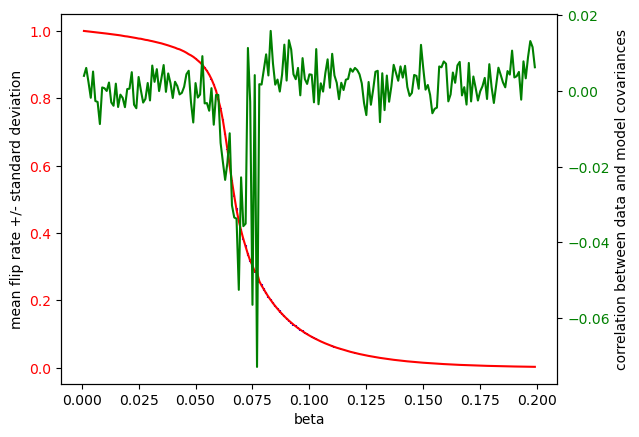

In [83]:
# Sequences
start_index = 1
stop_index = 200

fig, ax = plt.subplots()

beta_np = depytorch(beta[start_index:stop_index])

# Plot linear sequence, and set tick labels to the same color
ax.errorbar(  x=beta_np, y=depytorch(flip_rate_mean[start_index:stop_index]), yerr=depytorch(flip_rate_std[start_index:stop_index]), color='red', ecolor='blue'  )
ax.set_ylabel('mean flip rate +/- standard deviation')
ax.tick_params(axis='y', labelcolor='red')
ax.set_xlabel('beta')

# Generate a new Axes instance, on the twin-X axes (same position)
ax2 = ax.twinx()

# Plot exponential sequence, set scale to logarithmic and change tick color
ax2.plot( beta_np, depytorch(cov_corr[start_index:stop_index]), color='green' )
# ax2.set_yscale('log')
ax2.tick_params(axis='y', labelcolor='green')
ax2.set_ylabel('correlation between data and model covariances')
ax2.set_xlabel('beta')
plt.show()

In [14]:
model_file_name_part = 'all_quantile_0.5_medium_init_uncentered_reps_10_steps_1200_beta_updates_31_lr_0.01_param_updates_3000'
model_file = os.path.join(file_dir, f'ising_model_light_{model_file_name_part}.pt')
model = torch.load(model_file)
print(f'loaded {model_file}')
print( 'beta size', model.beta.size() )
print( 'h size', model.h.size() )
print( 'J size', model.J.size() )

loaded E:\Ising_model_results_daai\ising_model_light_all_quantile_0.5_medium_init_uncentered_reps_10_steps_1200_beta_updates_31_lr_0.01_param_updates_3000.pt
beta size torch.Size([10, 837])
h size torch.Size([10, 837, 360])
J size torch.Size([10, 837, 360, 360])


In [15]:
beta_training = model.beta[:,training_index_start:training_index_end]
h_training = model.h[:,training_index_start:training_index_end,:]
J_training = model.J[:,training_index_start:training_index_end,:,:]

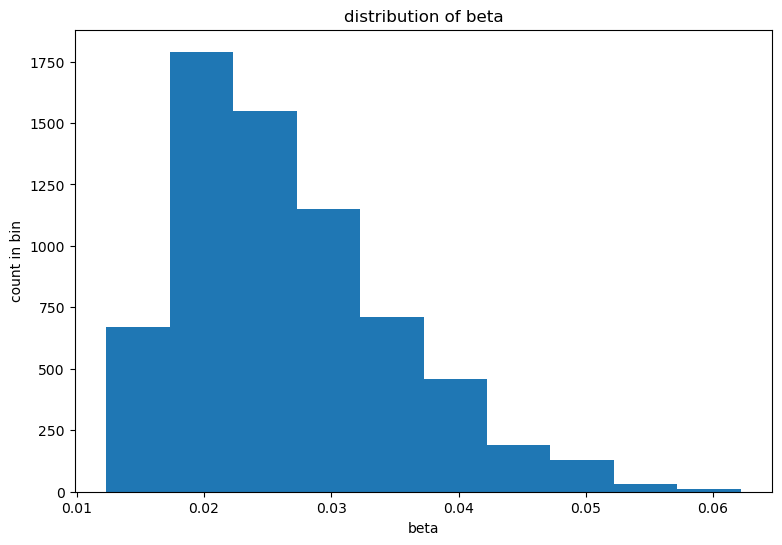

The distribution of beta values has median 0.0249 with 95% CI [0.0149, 0.0477] and range [0.0123, 0.0622].


In [16]:
name = 'beta'
values = beta_training
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

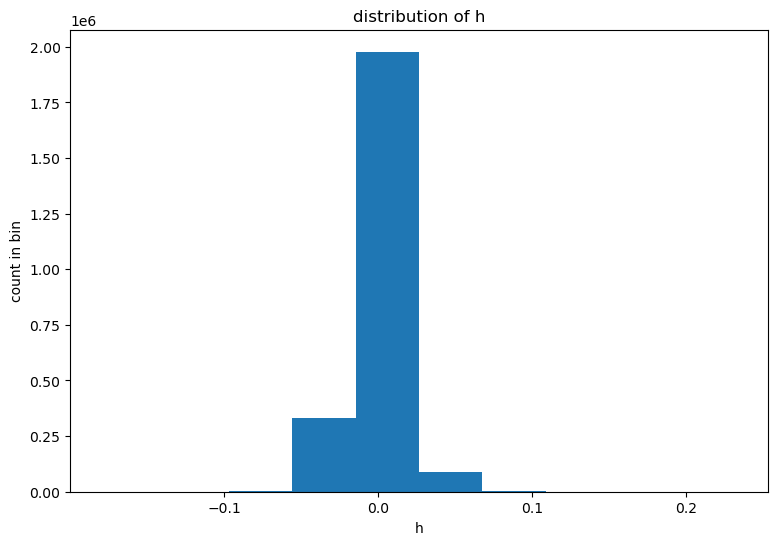

The distribution of h values has median -3.33e-05 with 95% CI [-0.0304, 0.0305] and range [-0.179, 0.232].


In [17]:
name = 'h'
values = h_training
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

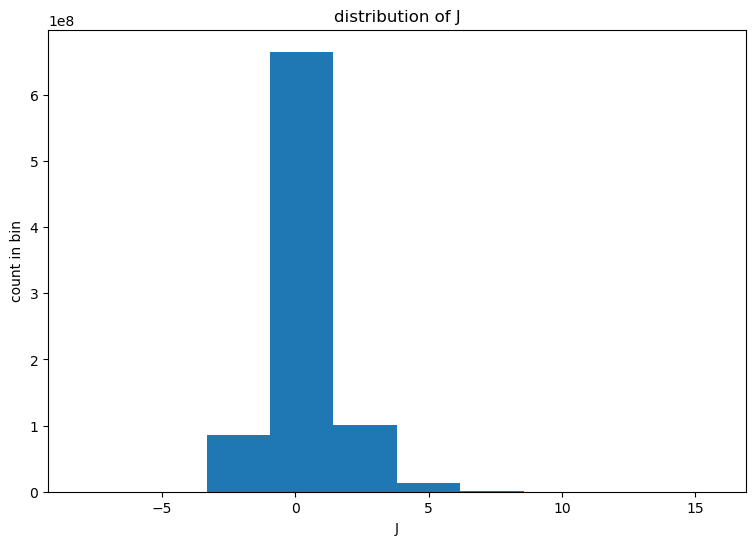

min J -8.090821266174316
mean J 0.3136473000049591
max J 15.702154159545898


In [16]:
name = 'J'
values = J_training
make_histogram(name=name, values=values)
print( 'min J', J_training.min().item() )
print( 'mean J', J_training.mean().item() )
print( 'max J', J_training.max().item() )
# print_stats_too_big(name=name, values=values)

In [22]:
betah = beta_training.unsqueeze(dim=-1) * h_training
betaJ = beta_training.unsqueeze(dim=-1).unsqueeze(dim=-1) * J_training

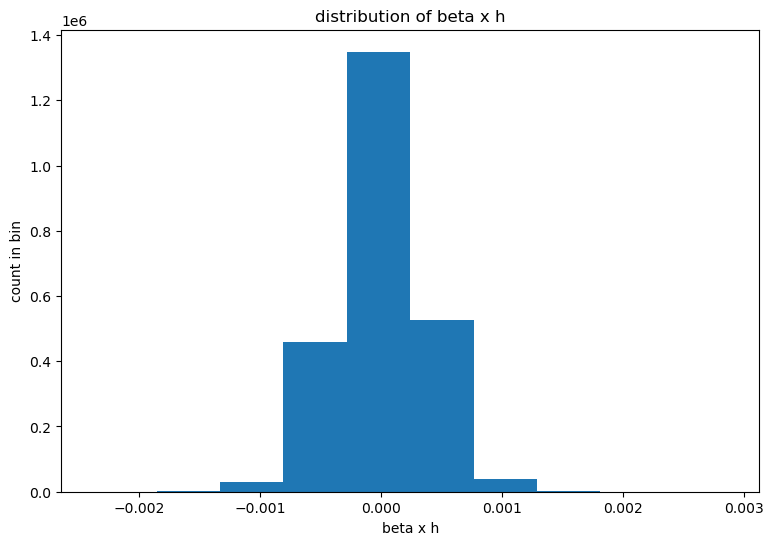

The distribution of beta x h values has median -8.95e-07 with 95% CI [-0.0007, 0.000702] and range [-0.00238, 0.00286].


In [22]:
name = 'beta x h'
values = betah
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

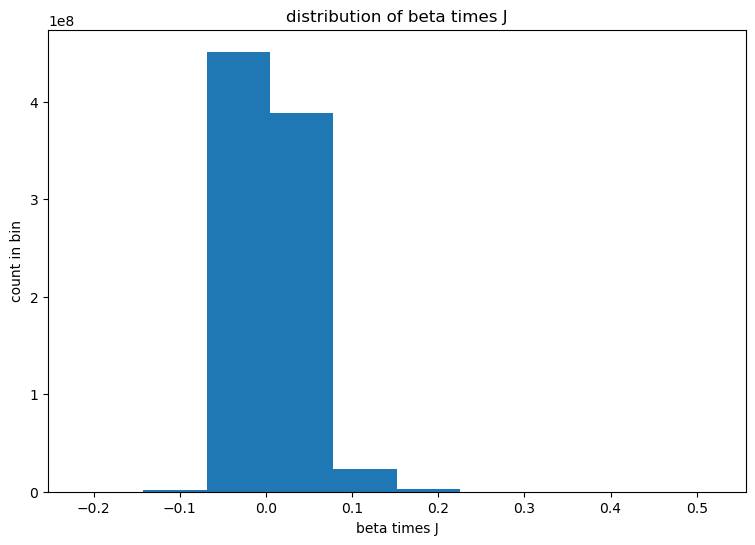

min beta x J -0.21591219305992126
mean beta x J 0.0076115932315588
max beta x J 0.5199465155601501


In [24]:
name = 'beta times J'
values = betaJ
make_histogram(name=name, values=values)
print( 'min beta x J', betaJ.min().item() )
print( 'mean beta x J', betaJ.mean().item() )
print( 'max beta x J', betaJ.max().item() )
# print_stats_too_big(name=name, values=values)

In [26]:
fc_rmse_file = os.path.join(file_dir, f'fc_rmse_{model_file_name_part}.pt')
fc_rmse = torch.load(fc_rmse_file)
print(f'loaded {fc_rmse_file}')
print( 'fc_rmse size', fc_rmse.size() )

loaded E:\Ising_model_results_daai\fc_rmse_all_quantile_0.5_medium_init_uncentered_reps_10_steps_1200_beta_updates_31_lr_0.01_param_updates_3000.pt
fc_rmse size torch.Size([10, 837])


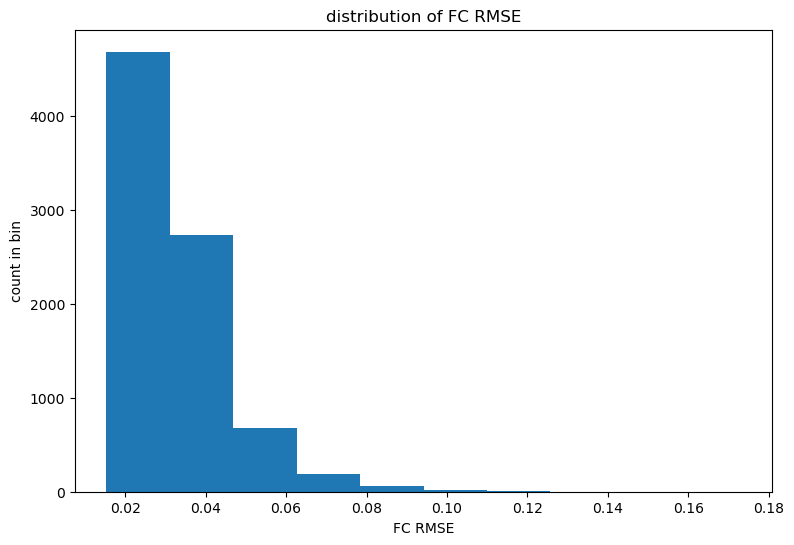

The distribution of FC RMSE values has median 0.0298 with 95% CI [0.0191, 0.067] and range [0.0154, 0.173].


In [28]:
name = 'FC RMSE'
values = fc_rmse
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [28]:
fc_corr_file = os.path.join(file_dir, f'fc_corr_{model_file_name_part}.pt')
fc_corr = torch.load(fc_corr_file)
print(f'loaded {fc_corr_file}')
print( 'fc_corr size', fc_corr.size() )

loaded E:\Ising_model_results_daai\fc_corr_all_quantile_0.5_medium_init_uncentered_reps_10_steps_1200_beta_updates_31_lr_0.01_param_updates_3000.pt
fc_corr size torch.Size([10, 837])


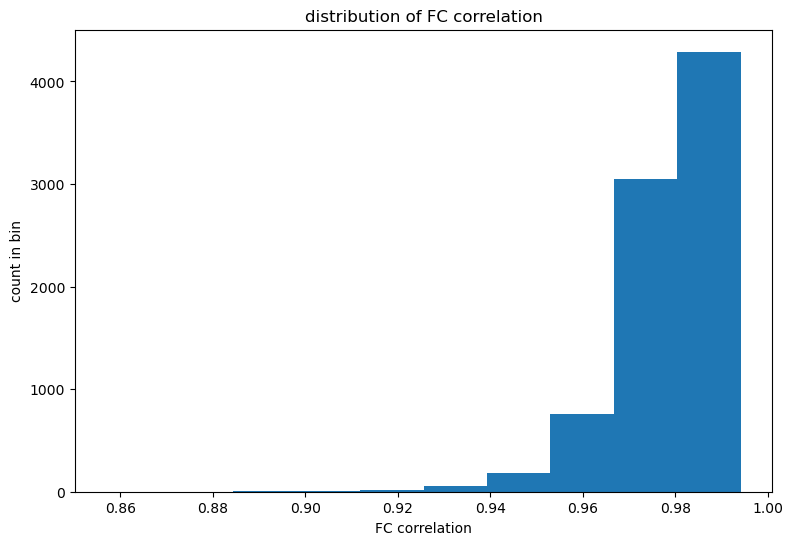

The distribution of FC correlation values has median 0.981 with 95% CI [0.95, 0.991] and range [0.857, 0.994].


In [30]:
name = 'FC correlation'
values = fc_corr
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [17]:
intra_subject_pair_J_var = J_training.var(dim=0)
intra_pair_J_var = J_training.var( dim=(0,1) )

The distribution of variance of J values of the same region pair values has median 0.603 with 95% CI [0.345, 1.8] and range [0, 5.93].


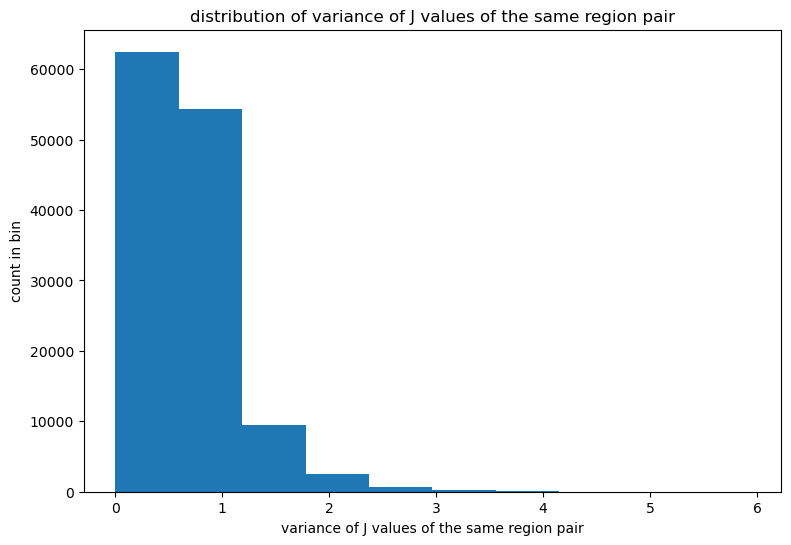

In [18]:
name = 'variance of J values of the same region pair'
values = intra_pair_J_var
print_stats(name=name, values=values)
make_histogram(name=name, values=values)

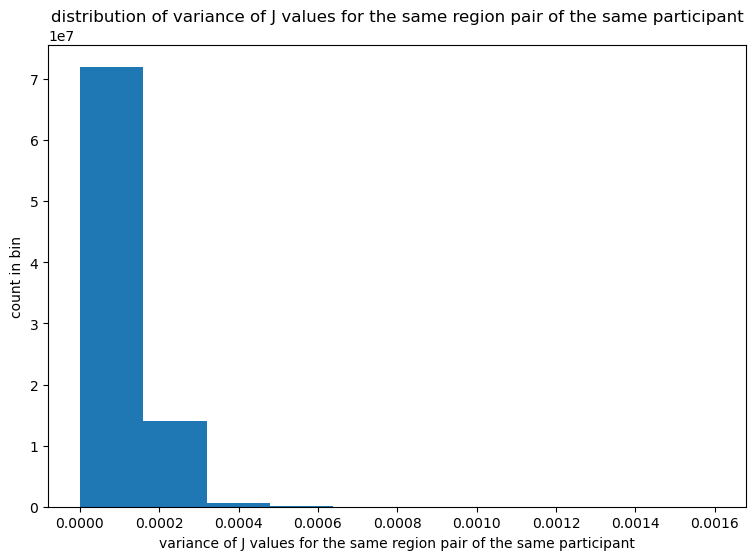

lower quantile 2167560, -1 and +1 tensor(2.7616e-05, device='cuda:0') tensor(2.7616e-05, device='cuda:0') tensor(2.7616e-05, device='cuda:0')
half way point 43351200, -1 and +1 tensor(9.6681e-05, device='cuda:0') tensor(9.6681e-05, device='cuda:0') tensor(9.6681e-05, device='cuda:0')
upper quantile 84534840, -1 and +1 tensor(0.0003, device='cuda:0') tensor(0.0003, device='cuda:0') tensor(0.0003, device='cuda:0')
The distribution of variance of J values for the same region pair of the same participant values has median 9.67e-05 with 95% CI [2.76e-05, 0.00026] and range [0, 0.0016].


In [19]:
name = 'variance of J values for the same region pair of the same participant'
values = intra_subject_pair_J_var
make_histogram(name=name, values=values)
print_stats_too_big(name=name, values=values)

In [20]:
print_proportions_of_variance_explained( variable_name='J', explainer_name='edge identity', values=J_training, dim=(0,1) )

proportion of variance of J explained by edge identity = 0.732/1.45 = 0.505. Proportion unexplained = 0.719/1.45 = 0.495. F-stat = 1.02. Explained + unexplained = 1.


In [21]:
print_proportions_of_variance_explained( variable_name='J', explainer_name='subject and edge identity', values=J_training, dim=0 )

proportion of variance of J explained by subject and edge identity = 1.45/1.45 = 1. Proportion unexplained = 0.000109/1.45 = 7.5e-05. F-stat = 1.33e+04. Explained + unexplained = 1.


In [23]:
intra_subject_pair_betaJ_var = betaJ.var(dim=0)
intra_pair_betaJ_var = betaJ.var( dim=(0,1) )

The distribution of variance of beta x J values of the same region pair values has median 0.000413 with 95% CI [0.000236, 0.00119] and range [0, 0.00604].


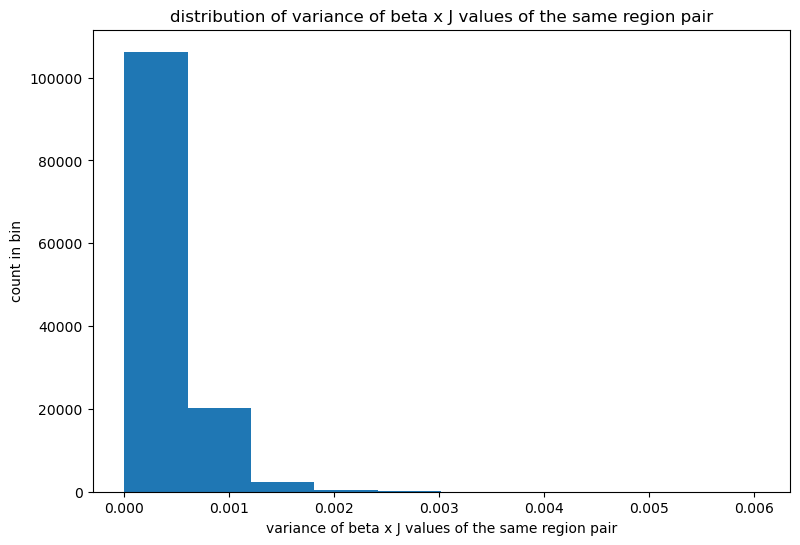

In [24]:
name = 'variance of beta x J values of the same region pair'
values = intra_pair_betaJ_var
print_stats(name=name, values=values)
make_histogram(name=name, values=values)

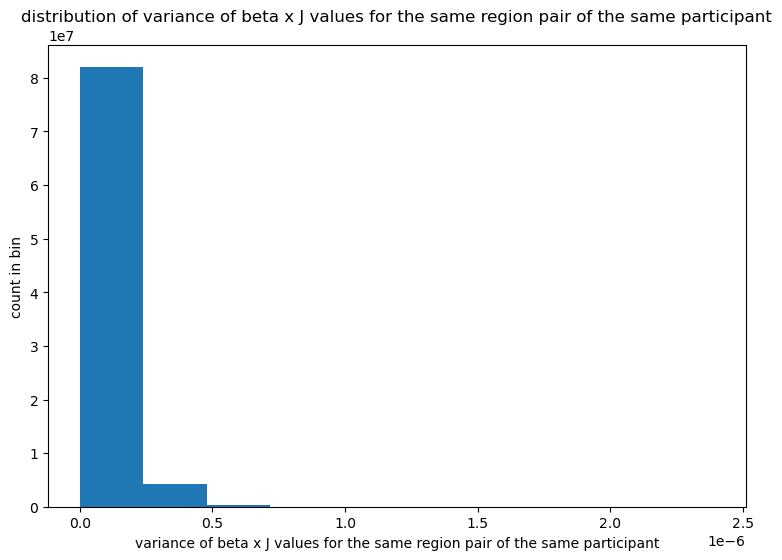

lower quantile 2167560, -1 and +1 tensor(9.9014e-09, device='cuda:0') tensor(9.9014e-09, device='cuda:0') tensor(9.9014e-09, device='cuda:0')
half way point 43351200, -1 and +1 tensor(6.1598e-08, device='cuda:0') tensor(6.1598e-08, device='cuda:0') tensor(6.1598e-08, device='cuda:0')
upper quantile 84534840, -1 and +1 tensor(3.0799e-07, device='cuda:0') tensor(3.0799e-07, device='cuda:0') tensor(3.0799e-07, device='cuda:0')
The distribution of variance of beta x J values for the same region pair of the same participant values has median 6.16e-08 with 95% CI [9.9e-09, 3.08e-07] and range [0, 2.39e-06].


In [25]:
name = 'variance of beta x J values for the same region pair of the same participant'
values = intra_subject_pair_betaJ_var
make_histogram(name=name, values=values)
print_stats_too_big(name=name, values=values)

In [26]:
print_proportions_of_variance_explained( variable_name='beta x J', explainer_name='edge identity', values=betaJ, dim=(0,1) )

proportion of variance of beta x J explained by edge identity = 0.000466/0.000947 = 0.492. Proportion unexplained = 0.000481/0.000947 = 0.508. F-stat = 0.969. Explained + unexplained = 1.


In [27]:
print_proportions_of_variance_explained( variable_name='beta x J', explainer_name='subject and edge identity', values=betaJ, dim=0 )

proportion of variance of beta x J explained by subject and edge identity = 0.000947/0.000947 = 1. Proportion unexplained = 8.68e-08/0.000947 = 9.16e-05. F-stat = 1.09e+04. Explained + unexplained = 1.


In [17]:
model_file_name_part_mean = 'all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_3000'
model_file_mean = os.path.join(file_dir, f'ising_model_light_{model_file_name_part_mean}.pt')
model_mean = torch.load(model_file_mean)
print(f'loaded {model_file_mean}')
print( 'beta size', model_mean.beta.size() )
print( 'h size', model_mean.h.size() )
print( 'J size', model_mean.J.size() )

loaded E:\Ising_model_results_daai\ising_model_light_all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_3000.pt
beta size torch.Size([5, 837])
h size torch.Size([5, 837, 360])
J size torch.Size([5, 837, 360, 360])


In [18]:
beta_training_mean = model_mean.beta[:,training_index_start:training_index_end]
h_training_mean = model_mean.h[:,training_index_start:training_index_end,:]
J_training_mean = model_mean.J[:,training_index_start:training_index_end,:,:]

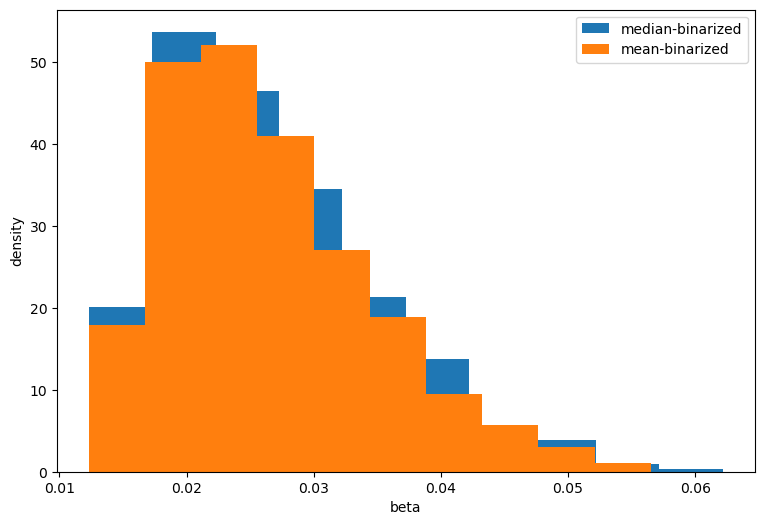

MannwhitneyuResult(statistic=11314750.0, pvalue=0.3580914303880486)
The distribution of beta with median binarization values has median 0.0249 with 95% CI [0.0149, 0.0477] and range [0.0123, 0.0622].
The distribution of beta with mean binarization values has median 0.0248 with 95% CI [0.0149, 0.046] and range [0.0123, 0.0565].


In [44]:
make_histogram_pair(values1=beta_training, values2=beta_training_mean, label1='median-binarized', label2='mean-binarized', xlabel='beta')
print_stats(name='beta with median binarization', values=beta_training)
print_stats(name='beta with mean binarization', values=beta_training_mean)

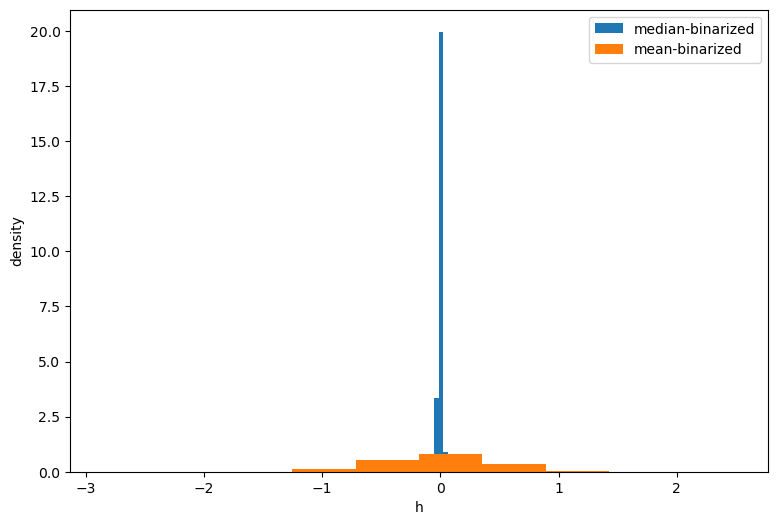

MannwhitneyuResult(statistic=1457332965542.5, pvalue=9.688278254858845e-15)
The distribution of h with median binarization values has median -3.33e-05 with 95% CI [-0.0304, 0.0305] and range [-0.179, 0.232].
The distribution of h with mean binarization values has median -0.00298 with 95% CI [-0.9, 0.901] and range [-2.86, 2.5].


In [45]:
make_histogram_pair(values1=h_training, values2=h_training_mean, label1='median-binarized', label2='mean-binarized', xlabel='h')
print_stats(name='h with median binarization', values=h_training)
print_stats(name='h with mean binarization', values=h_training_mean)

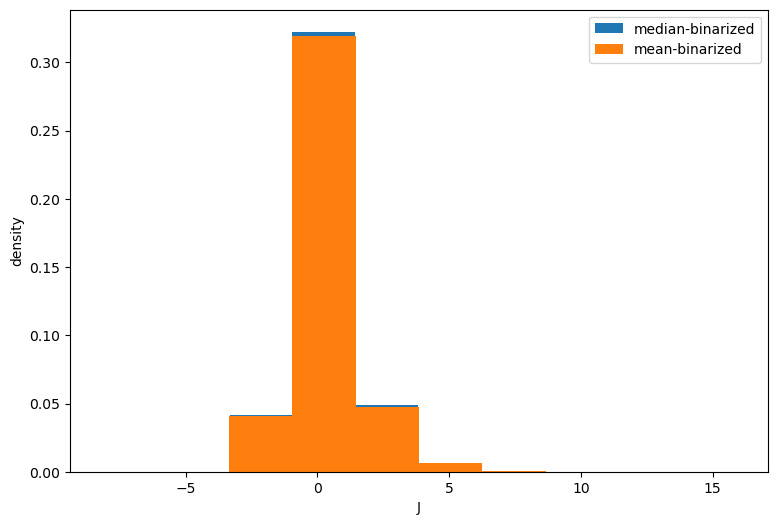

In [ ]:
make_histogram_pair(values1=J_training, values2=J_training_mean, label1='median-binarized', label2='mean-binarized', xlabel='J')

In [19]:
print( 'min J for median', J_training.min().item(), 'for mean', J_training_mean.min().item() )
print( 'mean J for median', J_training.mean().item(), 'for mean', J_training_mean.mean().item() )
print( 'max J for median', J_training.max().item(), 'for mean', J_training_mean.max().item() )

min J for median -8.090821266174316 for mean -8.170278549194336
mean J for median 0.3136473000049591 for mean 0.31586867570877075
max J for median 15.702154159545898 for mean 15.884613037109375


In [20]:
J_diff = J_training_mean - J_training[:J_training_mean.size(dim=0),:,:,:]

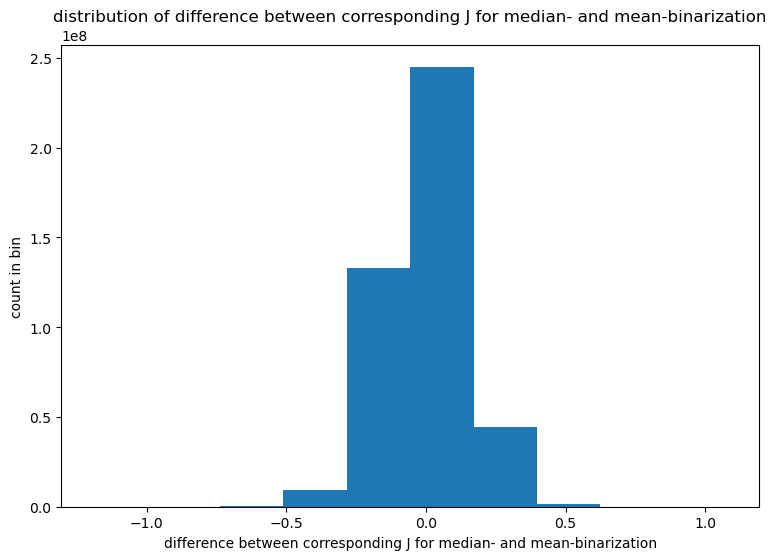

min J -1.1918668746948242
mean J 0.0022134636528789997
max J 1.0789527893066406


In [21]:
name = 'difference between corresponding J for median- and mean-binarization'
values = J_diff
make_histogram(name=name, values=values)
print( 'min J', J_diff.min().item() )
print( 'mean J', J_diff.mean().item() )
print( 'max J', J_diff.max().item() )
# print_stats_too_big(name=name, values=values)

In [22]:
J_diff_both_median = J_training[5:,:,:,:] - J_training[:5,:,:,:]

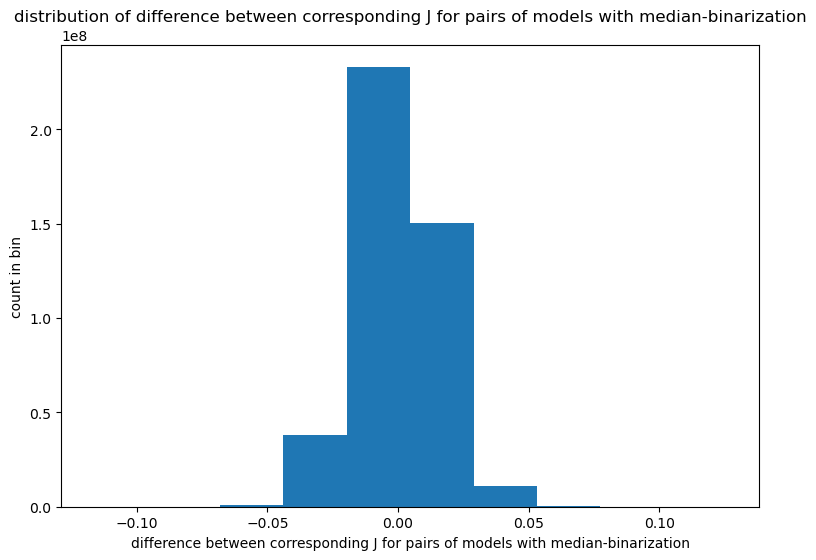

min J -0.11678600311279297
mean J -1.572460496390704e-05
max J 0.12605001032352448


In [23]:
name = 'difference between corresponding J for pairs of models with median-binarization'
values = J_diff_both_median
make_histogram(name=name, values=values)
print( 'min J', J_diff_both_median.min().item() )
print( 'mean J', J_diff_both_median.mean().item() )
print( 'max J', J_diff_both_median.max().item() )
# print_stats_too_big(name=name, values=values)

In [25]:
fc_rmse_file_mean = os.path.join(file_dir, f'fc_rmse_{model_file_name_part_mean}.pt')
fc_rmse_mean = torch.load(fc_rmse_file_mean)
print(f'loaded {fc_rmse_file_mean}')
print( 'fc_rmse size', fc_rmse_mean.size() )

loaded E:\Ising_model_results_daai\fc_rmse_all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_3000.pt
fc_rmse size torch.Size([5, 837])


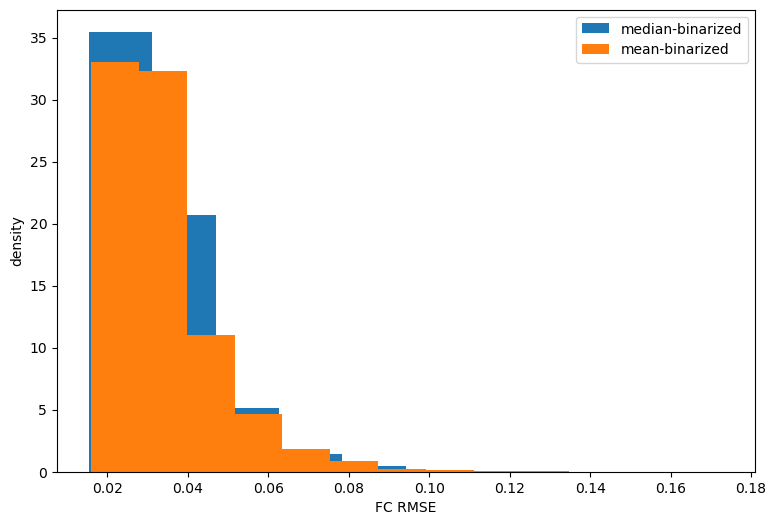

MannwhitneyuResult(statistic=17242459.0, pvalue=0.15574050312352344)
The distribution of FC RMSE with median binarization values has median 0.0298 with 95% CI [0.0191, 0.067] and range [0.0154, 0.173].
The distribution of FC RMSE with mean binarization values has median 0.0301 with 95% CI [0.0193, 0.0692] and range [0.0159, 0.135].


In [27]:
make_histogram_pair(values1=fc_rmse, values2=fc_rmse_mean, label1='median-binarized', label2='mean-binarized', xlabel='FC RMSE')
print_stats(name='FC RMSE with median binarization', values=fc_rmse)
print_stats(name='FC RMSE with mean binarization', values=fc_rmse_mean)

In [29]:
fc_corr_file_mean = os.path.join(file_dir, f'fc_corr_{model_file_name_part_mean}.pt')
fc_corr_mean = torch.load(fc_corr_file_mean)
print(f'loaded {fc_corr_file_mean}')
print( 'fc_corr_mean size', fc_corr_mean.size() )

loaded E:\Ising_model_results_daai\fc_corr_all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_3000.pt
fc_corr_mean size torch.Size([5, 837])


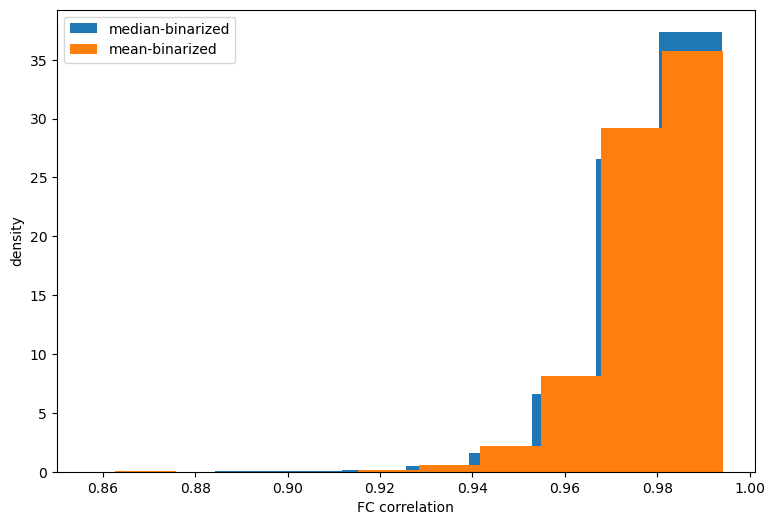

MannwhitneyuResult(statistic=17706417.0, pvalue=0.3154287871366256)
The distribution of FC correlation with median binarization values has median 0.981 with 95% CI [0.95, 0.991] and range [0.857, 0.994].
The distribution of FC correlation with mean binarization values has median 0.98 with 95% CI [0.95, 0.991] and range [0.863, 0.994].


In [31]:
make_histogram_pair(values1=fc_corr, values2=fc_corr_mean, label1='median-binarized', label2='mean-binarized', xlabel='FC correlation')
print_stats(name='FC correlation with median binarization', values=fc_corr)
print_stats(name='FC correlation with mean binarization', values=fc_corr_mean)

The distribution of beta for threshold mean + 0std.dev. values has median 0.0248 with 95% CI [0.0149, 0.046] and range [0.0123, 0.0565].
The distribution of beta for threshold mean + 0.1std.dev. values has median 0.0241 with 95% CI [0.0149, 0.0463] and range [0.0121, 0.055].
The distribution of beta for threshold mean + 1std.dev. values has median 0.0101 with 95% CI [0.00895, 0.0115] and range [0.0086, 0.0125].
The distribution of beta for threshold mean + 2std.dev. values has median 0.0124 with 95% CI [0.0117, 0.0128] and range [0.0108, 0.0132].


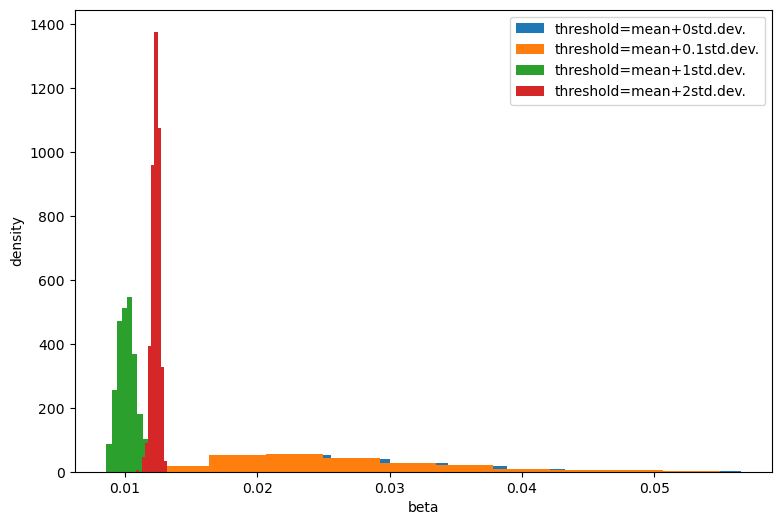

In [37]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'beta'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    model = torch.load( os.path.join(file_dir, f'ising_model_light_{model_file_name_part_mean_std}.pt') )
    training_values = model.beta[:,training_index_start:training_index_end]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of h for threshold mean + 0std.dev. values has median -0.00298 with 95% CI [-0.9, 0.901] and range [-2.86, 2.5].
The distribution of h for threshold mean + 0.1std.dev. values has median -0.0786 with 95% CI [-1.17, 0.938] and range [-3.26, 2.39].
The distribution of h for threshold mean + 1std.dev. values has median -0.424 with 95% CI [-8.8, 3.74] and range [-36.8, 6].
The distribution of h for threshold mean + 2std.dev. values has median -0.773 with 95% CI [-58.4, -0.277] and range [-59.9, 0.804].


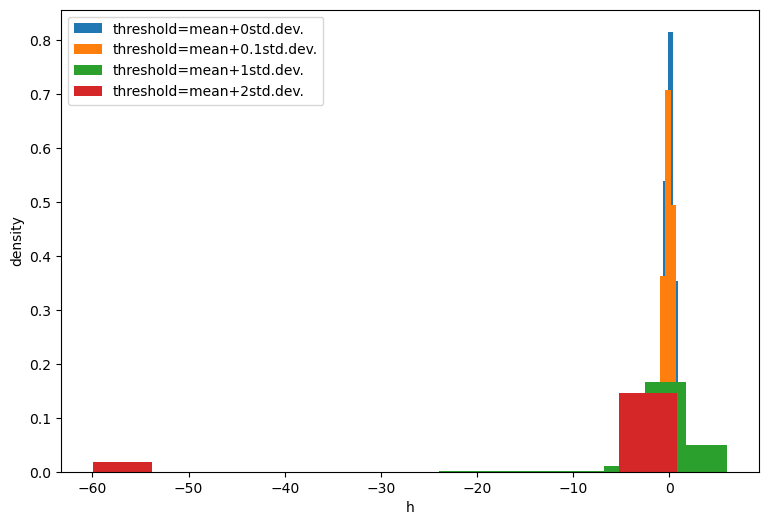

In [38]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'h'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    model = torch.load( os.path.join(file_dir, f'ising_model_light_{model_file_name_part_mean_std}.pt') )
    training_values = model.h[:,training_index_start:training_index_end,:]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

for threshold mean + 0std.dev., J has min -8.17,	mean 0.316,	max 15.9
for threshold mean + 0.1std.dev., J has min -8.03,	mean 0.321,	max 15.9
for threshold mean + 1std.dev., J has min -3.94,	mean 0.766,	max 14.3
for threshold mean + 2std.dev., J has min -0.745,	mean 0.945,	max 4.84


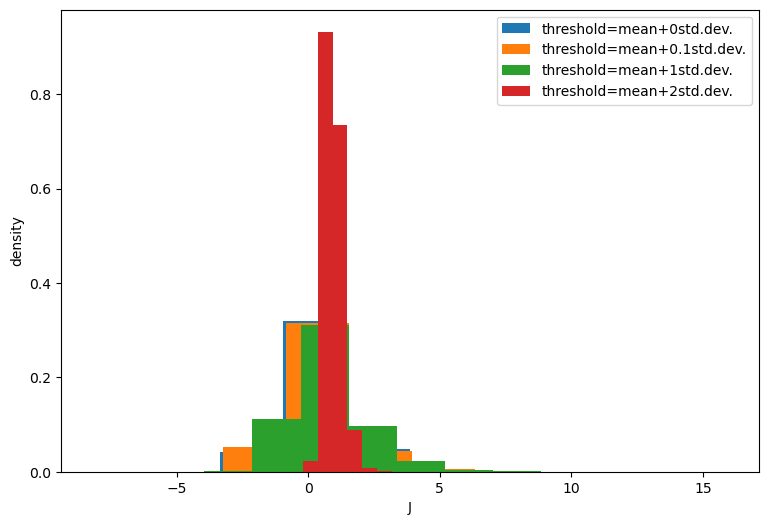

In [39]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'J'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    model = torch.load( os.path.join(file_dir, f'ising_model_light_{model_file_name_part_mean_std}.pt') )
    training_values = model.J[:,training_index_start:training_index_end,:,:]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print(f'for threshold mean + {threshold:.3g}std.dev., J has min {training_values.min():.3g},\tmean {training_values.mean():.3g},\tmax {training_values.max():.3g}')
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of beta x h for threshold mean + 0std.dev. values has median -7.34e-05 with 95% CI [-0.0244, 0.0242] and range [-0.111, 0.0995].
The distribution of beta x h for threshold mean + 0.1std.dev. values has median -0.00188 with 95% CI [-0.0325, 0.0249] and range [-0.112, 0.0831].
The distribution of beta x h for threshold mean + 1std.dev. values has median -0.00442 with 95% CI [-0.0899, 0.035] and range [-0.328, 0.0573].
The distribution of beta x h for threshold mean + 2std.dev. values has median -0.00957 with 95% CI [-0.729, -0.00334] and range [-0.77, 0.00871].


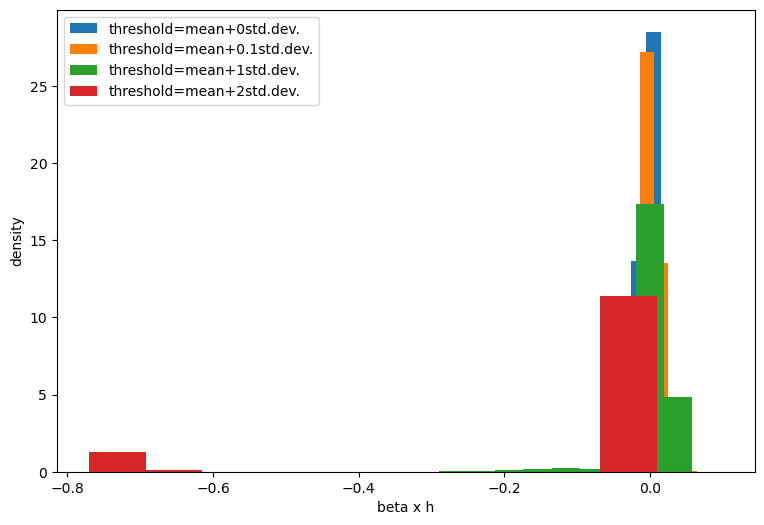

In [40]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'beta x h'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    model = torch.load( os.path.join(file_dir, f'ising_model_light_{model_file_name_part_mean_std}.pt') )
    training_values = model.beta[:,training_index_start:training_index_end].unsqueeze(dim=-1) * model.h[:,training_index_start:training_index_end,:]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

for threshold mean + 0std.dev., beta x J has min -0.216,	mean 0.00762,	max 0.513
for threshold mean + 0.1std.dev., beta x J has min -0.209,	mean 0.00762,	max 0.504
for threshold mean + 1std.dev., beta x J has min -0.0381,	mean 0.00772,	max 0.146
for threshold mean + 2std.dev., beta x J has min -0.00858,	mean 0.0116,	max 0.0617


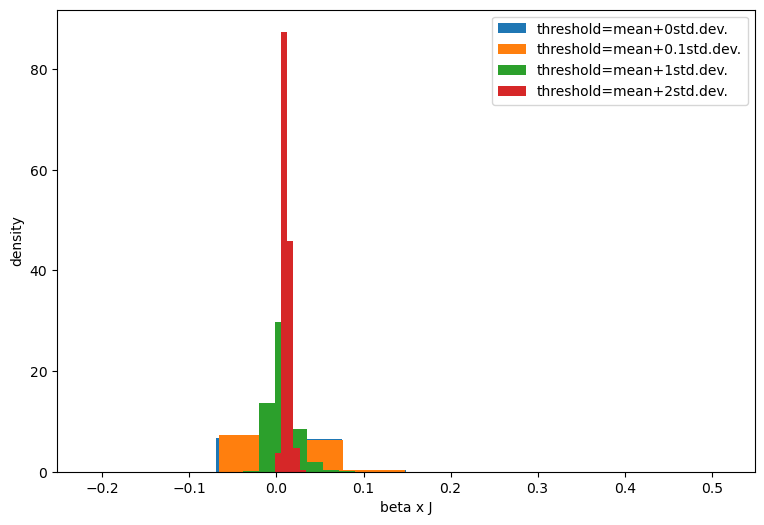

In [14]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'beta x J'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    model = torch.load( os.path.join(file_dir, f'ising_model_light_{model_file_name_part_mean_std}.pt') )
    training_values = model.beta[:,training_index_start:training_index_end].unsqueeze(dim=-1).unsqueeze(dim=-1) * model.J[:,training_index_start:training_index_end,:,:]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print(f'for threshold mean + {threshold:.3g}std.dev., {param_name} has min {training_values.min():.3g},\tmean {training_values.mean():.3g},\tmax {training_values.max():.3g}')
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of FC RMSE for threshold mean + 0std.dev. values has median 0.0303 with 95% CI [0.0191, 0.0699] and range [0.0159, 0.135].
The distribution of FC RMSE for threshold mean + 0.1std.dev. values has median 0.0305 with 95% CI [0.0198, 0.0669] and range [0.0161, 0.135].
The distribution of FC RMSE for threshold mean + 1std.dev. values has median 0.223 with 95% CI [0.0775, 0.406] and range [0.0685, 0.505].
The distribution of FC RMSE for threshold mean + 2std.dev. values has median 0.184 with 95% CI [0.105, 0.32] and range [0.0877, 0.394].


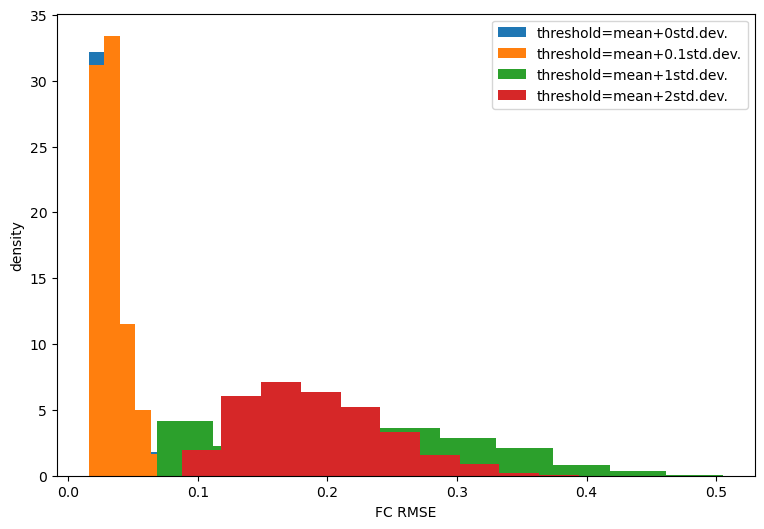

In [16]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'FC RMSE'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    fc_rmse = torch.load( os.path.join(file_dir, f'fc_rmse_{model_file_name_part_mean_std}.pt') )
    training_values = fc_rmse[:,training_index_start:training_index_end]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of flip rate for threshold mean + 0std.dev. values has median 0.34 with 95% CI [0.212, 0.594] and range [0.103, 0.899].
The distribution of flip rate for threshold mean + 0.1std.dev. values has median 0.339 with 95% CI [0.211, 0.59] and range [0.0761, 0.895].
The distribution of flip rate for threshold mean + 1std.dev. values has median 0.209 with 95% CI [0.124, 0.346] and range [0.0176, 0.914].
The distribution of flip rate for threshold mean + 2std.dev. values has median 0.0415 with 95% CI [0.0259, 0.0593] and range [0.0104, 0.109].


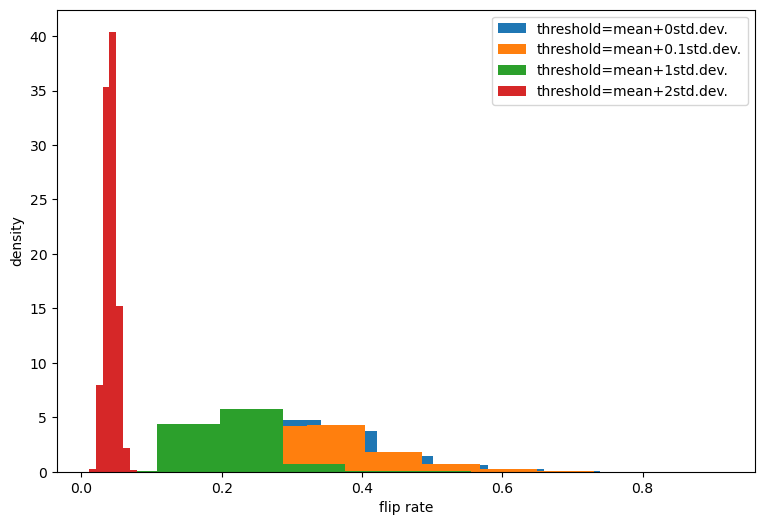

In [18]:
thresholds = [0, 0.1, 1, 2]
beta_opt_lengths = [71, 73, 80, 80]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'flip rate'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    flip_rate = torch.load( os.path.join(file_dir, f'flip_rate_{model_file_name_part_mean_std}.pt') )
    training_values = flip_rate[:,training_index_start:training_index_end,:]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of FC correlation for threshold mean + 0std.dev. values has median 0.98 with 95% CI [0.948, 0.991] and range [0.873, 0.994].
The distribution of FC correlation for threshold mean + 1std.dev. values has median 0.525 with 95% CI [-0.116, 0.835] and range [-0.257, 0.914].
The distribution of FC correlation for threshold mean + 2std.dev. values has median 0.0386 with 95% CI [0.0171, 0.0659] and range [0.00248, 0.125].


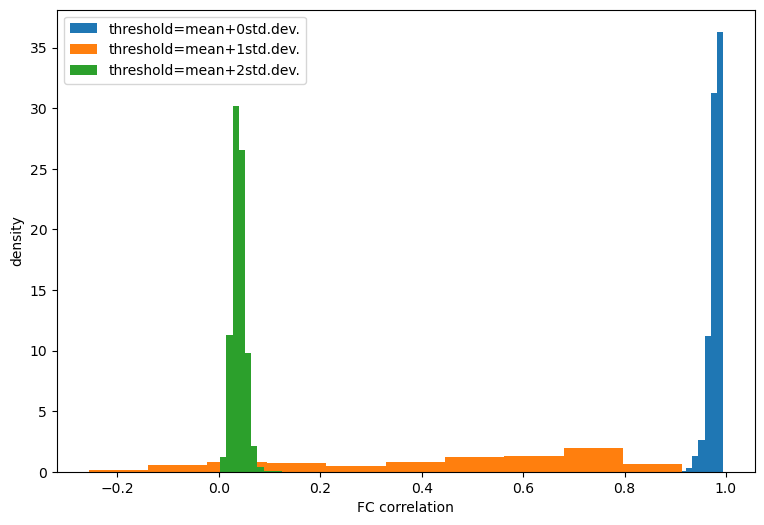

In [16]:
thresholds = [0, 1, 2]
beta_opt_lengths = [64, 71, 82]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'FC correlation'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_target_fr_0.34_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    fc_corr = torch.load( os.path.join(file_dir, f'fc_corr_{model_file_name_part_mean_std}.pt') )
    training_values = fc_corr[:,training_index_start:training_index_end]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

The distribution of flip rate for threshold mean + 0std.dev. values has median 0.34 with 95% CI [0.213, 0.593] and range [0.0942, 0.899].
The distribution of flip rate for threshold mean + 1std.dev. values has median 0.209 with 95% CI [0.124, 0.349] and range [0.0168, 0.882].
The distribution of flip rate for threshold mean + 2std.dev. values has median 0.0414 with 95% CI [0.0259, 0.0592] and range [0.0108, 0.108].


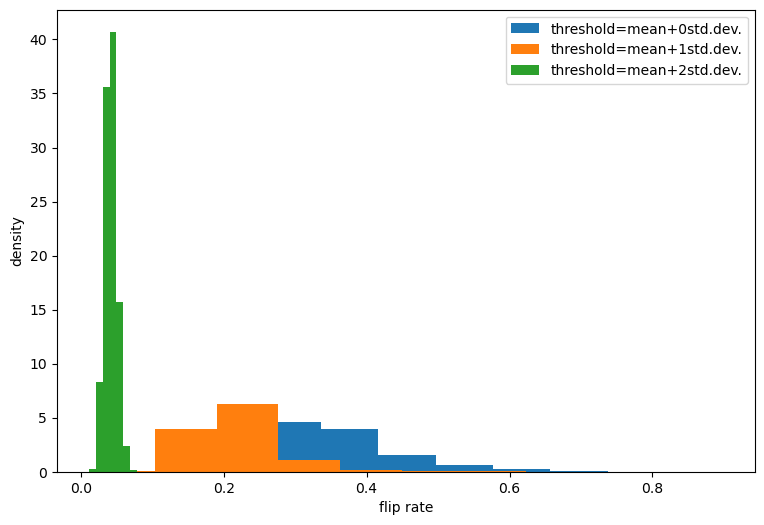

In [17]:
thresholds = [0, 1, 2]
beta_opt_lengths = [64, 71, 82]
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'flip rate'
for threshold, beta_opt_length in zip(thresholds, beta_opt_lengths):
    model_file_name_part_mean_std = f'all_mean_std_{threshold:.3g}_medium_init_uncentered_reps_5_steps_1200_target_fr_0.34_beta_updates_{beta_opt_length}_lr_0.01_param_updates_3000'
    flip_rate = torch.load( os.path.join(file_dir, f'flip_rate_{model_file_name_part_mean_std}.pt') )
    training_values = flip_rate[:,training_index_start:training_index_end,:]
    axs.hist( depytorch(training_values).flatten(), label=f'threshold=mean+{threshold:.3g}std.dev.', density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} for threshold mean + {threshold:.3g}std.dev.', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
axs.legend()
plt.show()

In [39]:
region_names, xyz = hcp.load_roi_info(directory_path='E:\\HCP_data', dtype=float_type, device=device)

In [44]:
radius_inclination_azimuth = torch.zeros_like(xyz)
square_sum_sqrt = torch.square(xyz).cumsum(dim=-1).sqrt()
radius = square_sum_sqrt[:,2]# radius = sqrt(x^2 + y^2 + z^2)
radius_inclination_azimuth[:,0] = radius
radius_inclination_azimuth[:,1] = torch.arccos(xyz[:,2]/radius)# inclination = arccos(z/radius)
radius_inclination_azimuth[:,2] = torch.sign(xyz[:,1]) * torch.arccos(xyz[:,0]/square_sum_sqrt[:,1])# azimuth = sgn(y)*arccos( x/sqrt(x^2+y^2) )

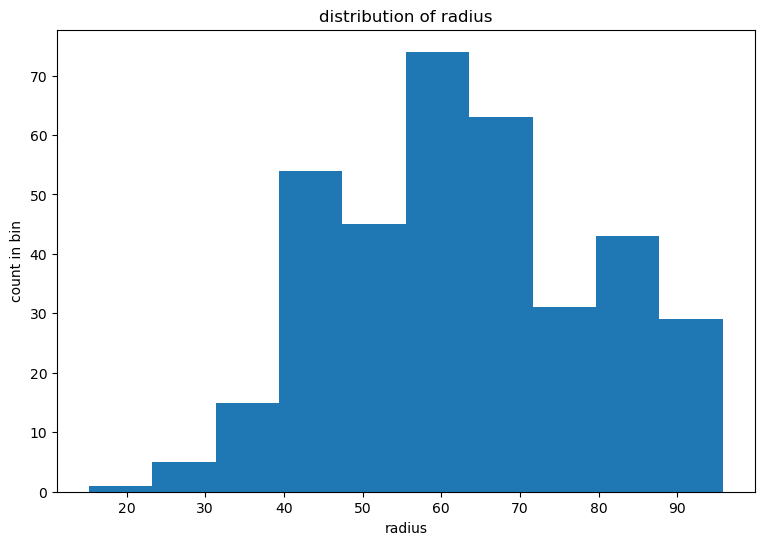

The distribution of radius values has median 62.4 with 95% CI [36.1, 93] and range [15.2, 95.8].


In [45]:
name = 'radius'
values = radius
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [46]:
print(  torch.count_nonzero( torch.isnan(radius_inclination_azimuth[:,1]) )  )

tensor(0, device='cuda:0')


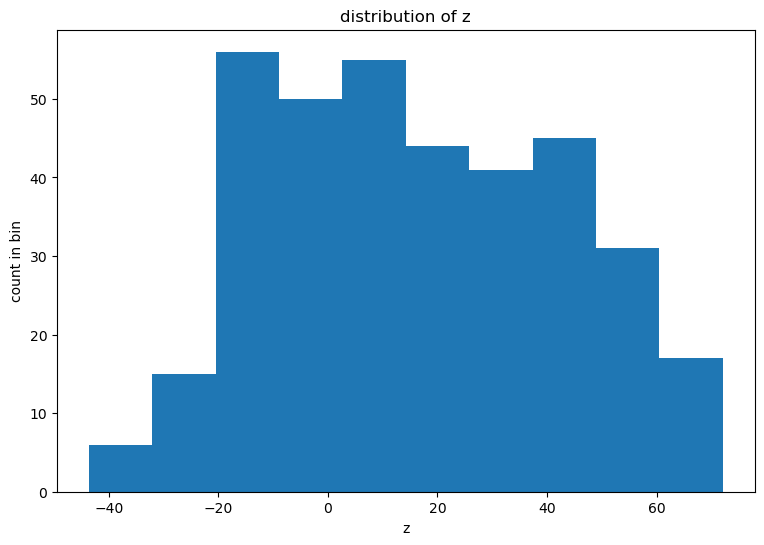

The distribution of z values has median 13.7 with 95% CI [-29.3, 64.1] and range [-43.7, 72.1].


In [47]:
name = 'z'
values = xyz[:,2]
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

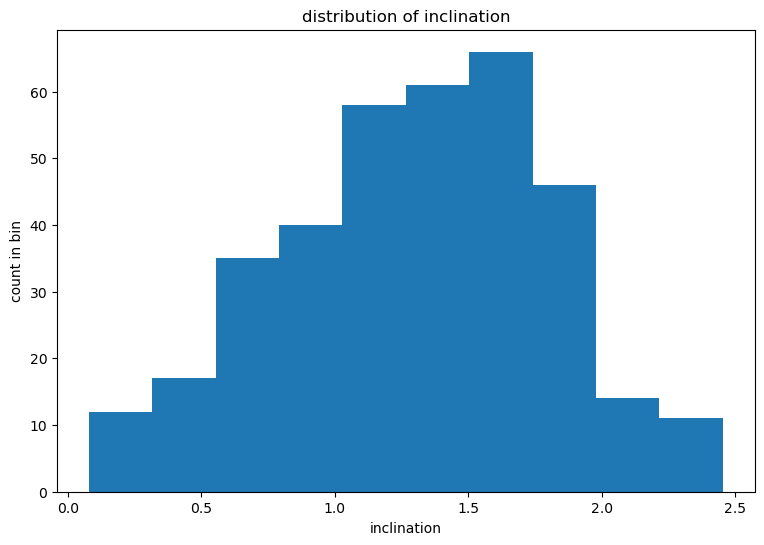

The distribution of inclination values has median 1.35 with 95% CI [0.28, 2.25] and range [0.0778, 2.45].


In [48]:
name = 'inclination'
values = radius_inclination_azimuth[:,1]
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

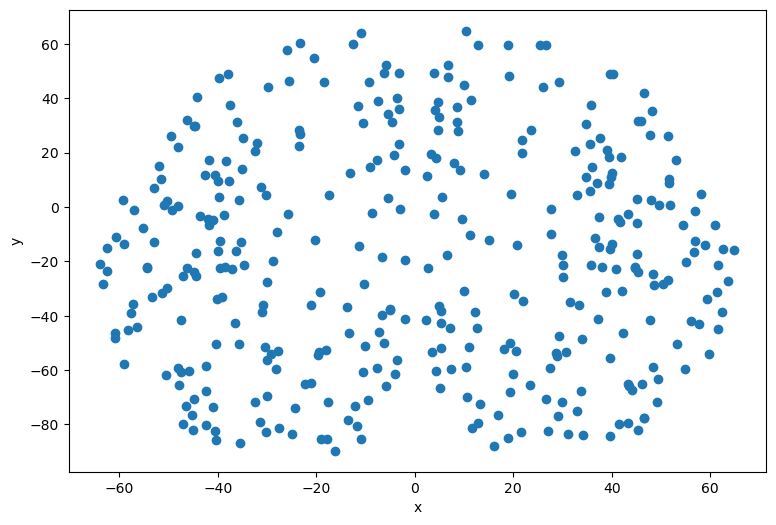

In [49]:
make_scatter(xname='x', xvalues=xyz[:,0], yname='y', yvalues=xyz[:,1])

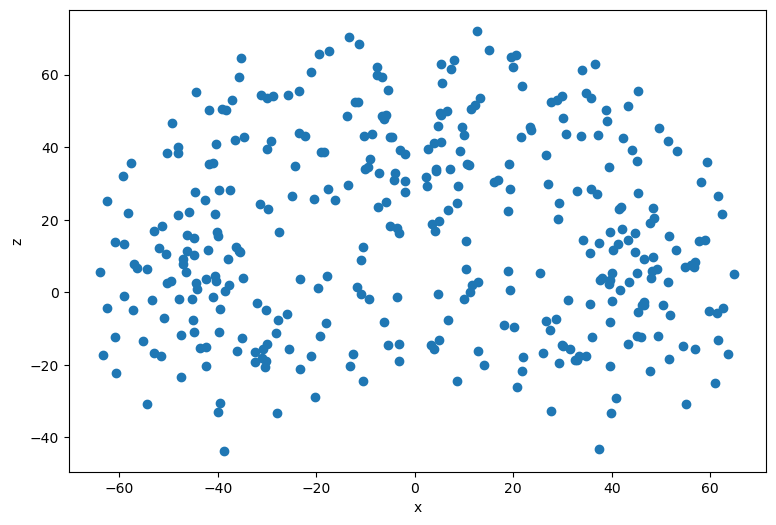

In [50]:
make_scatter(xname='x', xvalues=xyz[:,0], yname='z', yvalues=xyz[:,2])

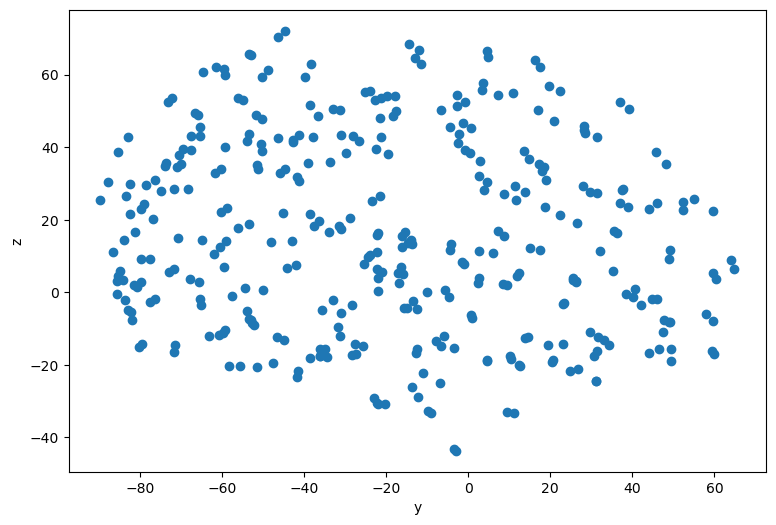

In [51]:
make_scatter(xname='y', xvalues=xyz[:,1], yname='z', yvalues=xyz[:,2])

In [52]:
node_features = torch.load( os.path.join(file_dir, 'node_features_all_as_is.pt') )
print( node_features.size() )

torch.Size([837, 360, 11])


In [53]:
print(   torch.count_nonzero(  torch.isnan(node_features)  )   )

tensor(0, device='cuda:0')


The distribution of FC correlation with fitted h values has median 0.98 with 95% CI [0.949, 0.991] and range [0.863, 0.994].
The distribution of FC correlation with zeroed h values has median 0.98 with 95% CI [0.948, 0.991] and range [0.875, 0.994].


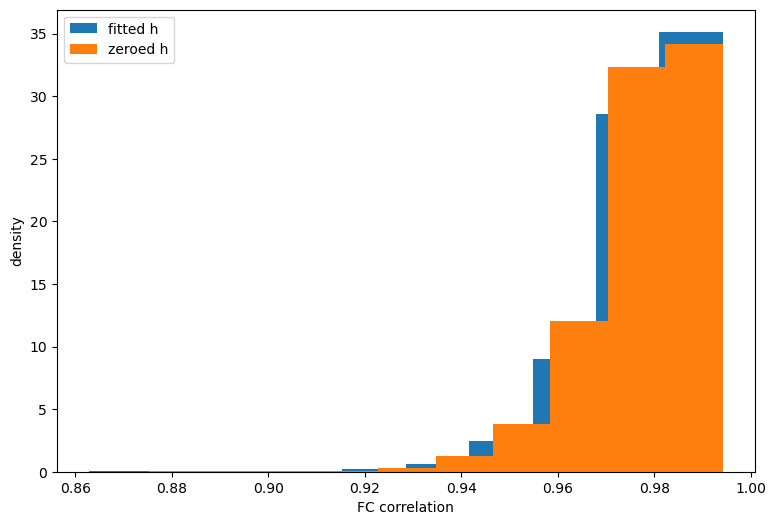

MannwhitneyuResult(statistic=5608603.5, pvalue=0.8584151264697455)


In [59]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'FC correlation'
values_pair = [None, None]
for index, h_str, h_str_print in zip([0,1],['', 'no_h_'],['fitted h', 'zeroed h']):
    model_file_name_part_mean_std = f'all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_3000_{h_str}test_length_120000'
    fc_corr = torch.load( os.path.join(file_dir, f'fc_corr_{model_file_name_part_mean_std}.pt') )
    training_values = fc_corr[:,training_index_start:training_index_end]
    values_flat = depytorch( training_values.flatten() )
    axs.hist( values_flat, label=h_str_print, density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} with {h_str_print}', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
    values_pair[index] = values_flat
axs.legend()
plt.show()
print( stats.mannwhitneyu(x=values_pair[0], y=values_pair[1]) )

The distribution of FC correlation with fitted h values has median 0.954 with 95% CI [0.903, 0.975] and range [0.0932, 0.983].
The distribution of FC correlation with zeroed h values has median 0.946 with 95% CI [0.901, 0.966] and range [0.0905, 0.976].


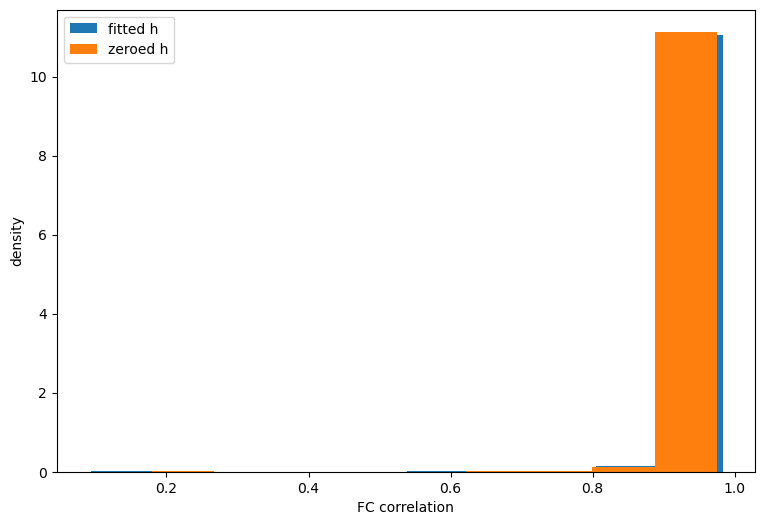

MannwhitneyuResult(statistic=7015895.0, pvalue=2.1195862512926377e-72)


In [25]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
param_name = 'FC correlation'
values_pair = [None, None]
for index, h_str, h_str_print in zip([0,1],['', 'no_h_'],['fitted h', 'zeroed h']):
    model_file_name_part_mean_std = f'all_mean_std_0.5_medium_init_uncentered_reps_5_target_cov_rmse_lr_0.01_steps_1200_pupd_per_bopt_3000_num_opt_0_bopt_steps_93_popt_steps_3000_{h_str}test_length_120000'
    fc_corr = torch.load( os.path.join(file_dir, f'fc_corr_{model_file_name_part_mean_std}.pt') )
    training_values = fc_corr[:,training_index_start:training_index_end]
    values_flat = depytorch( training_values.flatten() )
    axs.hist( values_flat, label=h_str_print, density=True )
    # axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
    axs.set_xlabel(param_name)
    axs.set_ylabel('density')
    print_stats(name=f'{param_name} with {h_str_print}', values=training_values)
    # axs.set_title(f'distribution of {xlabel}')
    values_pair[index] = values_flat
axs.legend()
plt.show()
print( stats.mannwhitneyu(x=values_pair[0], y=values_pair[1]) )

In [30]:
h_vs_no_h_diff = values_pair[0] - values_pair[1]
print( np.count_nonzero(h_vs_no_h_diff > 0), h_vs_no_h_diff.size )

2694 3345


In [31]:
print( np.count_nonzero(values_pair[0] < 0.9)/values_pair[0].size )

0.020029895366218235


In [14]:
test_mean_state = torch.load( os.path.join(file_dir, 'mean_state_all_mean_std_0.pt') )
print( test_mean_state.size() )
test_mean_state_product = torch.load( os.path.join(file_dir, 'mean_state_product_all_mean_std_0.pt') )
print( test_mean_state_product.size() )

torch.Size([4, 837, 360])
torch.Size([4, 837, 360, 360])


In [15]:
test_cov = test_mean_state_product - test_mean_state[:,:,:,None] * test_mean_state[:,:,None,:]

In [17]:
test_inv_cov = torch.linalg.inv(test_cov)

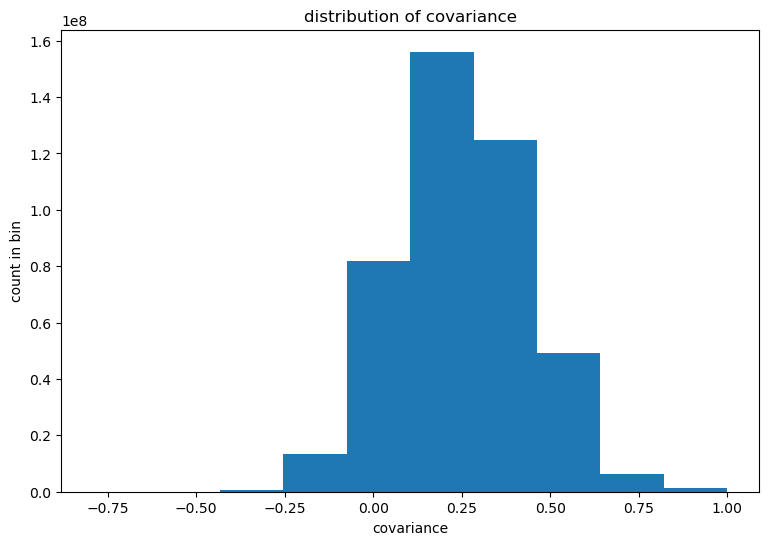

min covariance -0.7915444374084473
mean covariance 0.2501639723777771
max covariance 1.0


In [18]:
name = 'covariance'
values = test_cov
make_histogram(name=name, values=values)
print( f'min {name}', values.min().item() )
print( f'mean {name}', values.mean().item() )
print( f'max {name}', values.max().item() )
# print_stats_too_big(name=name, values=values)

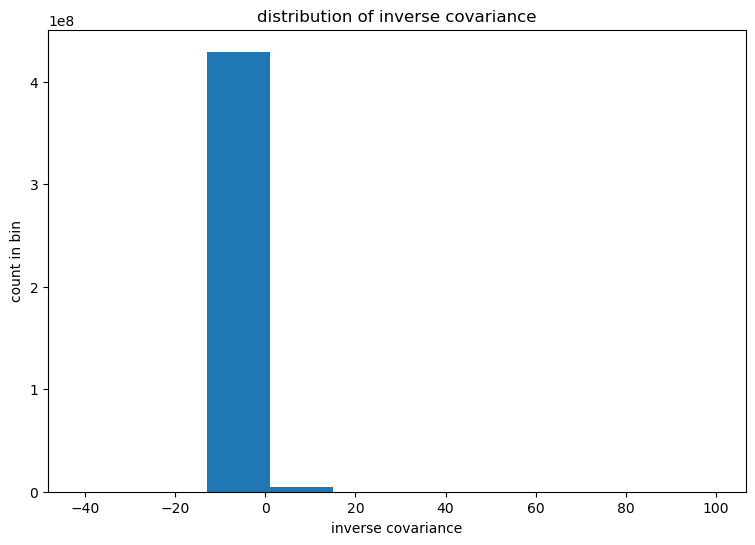

min inverse covariance -41.16490936279297
mean inverse covariance 0.000471920968266204
max inverse covariance 99.55361938476562


In [19]:
name = 'inverse covariance'
values = test_inv_cov
make_histogram(name=name, values=values)
print( f'min {name}', values.min().item() )
print( f'mean {name}', values.mean().item() )
print( f'max {name}', values.max().item() )
# print_stats_too_big(name=name, values=values)

In [18]:
flip_rate_file = os.path.join(file_dir, 'flip_rate_all_mean_std_2_medium_init_uncentered_reps_5_target_fr_0.34_lr_0.01_steps_1200_pupd_per_bopt_3000_num_opt_0_bopt_steps_113_popt_steps_3000_test_length_120000.pt')
flip_rate = torch.load(flip_rate_file)
print( flip_rate.size() )

torch.Size([5, 837, 360])


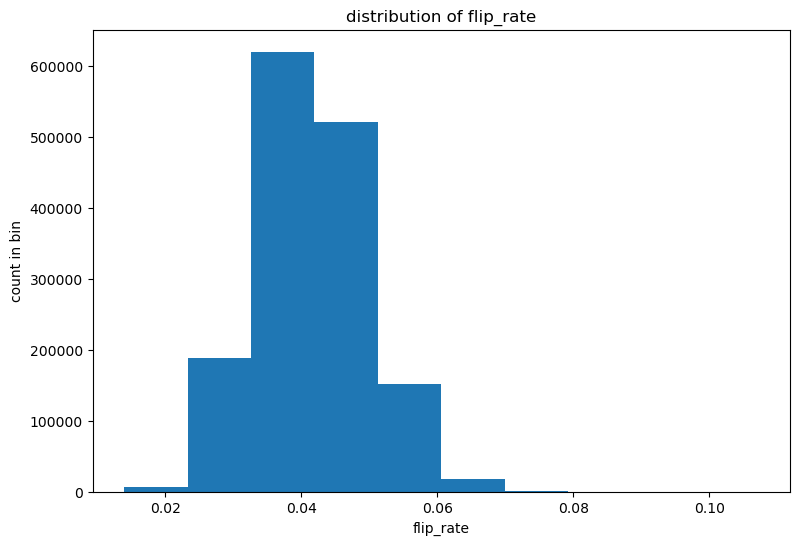

The distribution of flip_rate values has median 0.0411 with 95% CI [0.027, 0.058] and range [0.0139, 0.107].


In [19]:
name = 'flip_rate'
values = flip_rate
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [20]:
sim_cov = torch.load( os.path.join(file_dir, 'sim_cov_all_mean_std_2_medium_init_uncentered_reps_5_target_fr_0.34_lr_0.01_steps_1200_pupd_per_bopt_3000_num_opt_0_bopt_steps_113_popt_steps_3000_test_length_120000.pt') )
print( sim_cov.size() )

torch.Size([5, 837, 360, 360])


In [21]:
data_file_name_part = 'all_mean_std_2'

target_state_mean_file = os.path.join(file_dir, f'mean_state_{data_file_name_part}.pt')
target_state_mean = torch.load(target_state_mean_file)
# On load, the dimensions of target_state_mean should be scan x subject x node.
print( f'loaded target_state_mean with size', target_state_mean.size() )
target_state_mean = target_state_mean[:,0,:]
target_state_mean = torch.mean(target_state_mean, dim=0, keepdim=True)
print( f'selected one subject, so now', target_state_mean.size() )

target_state_product_mean_file = os.path.join(file_dir, f'mean_state_product_{data_file_name_part}.pt')
target_state_product_mean = torch.load(target_state_product_mean_file)
print( f'loaded target_state_product_mean with size', target_state_product_mean.size() )
target_state_product_mean = target_state_product_mean[:,0,:,:]
target_state_product_mean = torch.mean(target_state_product_mean, dim=0, keepdim=True)
print( f'selected one subject, so now', target_state_product_mean.size() )

target_cov = target_state_product_mean - target_state_mean[:,:,None] * target_state_mean[:,None,:]
print( target_cov.size() )

loaded target_state_mean with size torch.Size([4, 837, 360])
selected one subject, so now torch.Size([1, 360])
loaded target_state_product_mean with size torch.Size([4, 837, 360, 360])
selected one subject, so now torch.Size([1, 360, 360])
torch.Size([1, 360, 360])


Text(0.5, 1.0, 'sim')

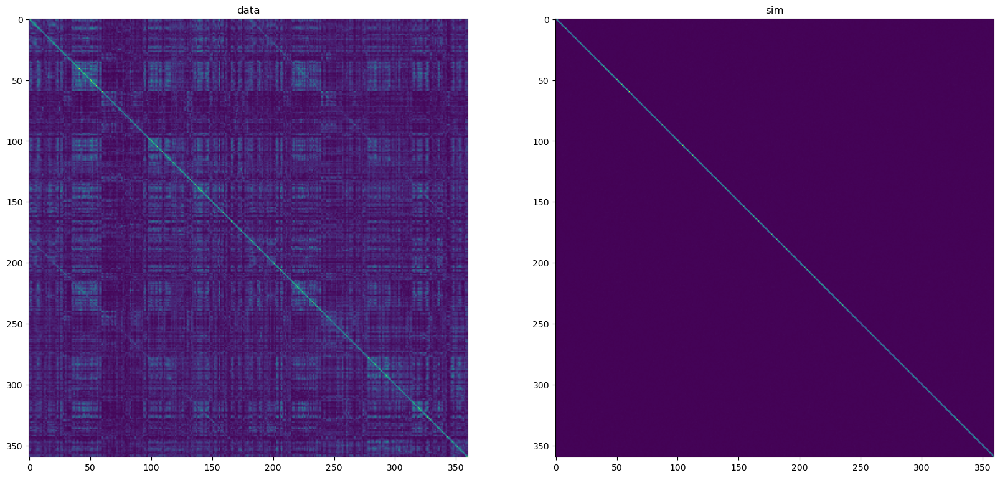

In [22]:
fig, axs = plt.subplots( nrows=1, ncols=2, figsize=(20, 10) )
axs[0].imshow( depytorch(target_cov[0,:,:]) )
axs[0].set_title(f'data')
axs[1].imshow( depytorch(sim_cov[0,0,:,:]) )
axs[1].set_title(f'sim')

In [14]:
# fc_corr_file = os.path.join(file_dir, 'fc_corr_all_mean_std_2_medium_init_uncentered_reps_5_target_fr_0.34_lr_0.01_steps_1200_pupd_per_bopt_3000_num_opt_0_bopt_steps_113_popt_steps_3000_test_length_120000.pt')
fc_corr_file = os.path.join(file_dir, 'fc_corr_all_mean_std_0.5_medium_init_uncentered_reps_5_target_cov_rmse_lr_0.01_steps_1200_pupd_per_bopt_3000_num_opt_0_bopt_steps_93_popt_steps_3000_test_length_120000.pt')
fc_corr = torch.load(fc_corr_file)
print( fc_corr.size() )

torch.Size([5, 837])


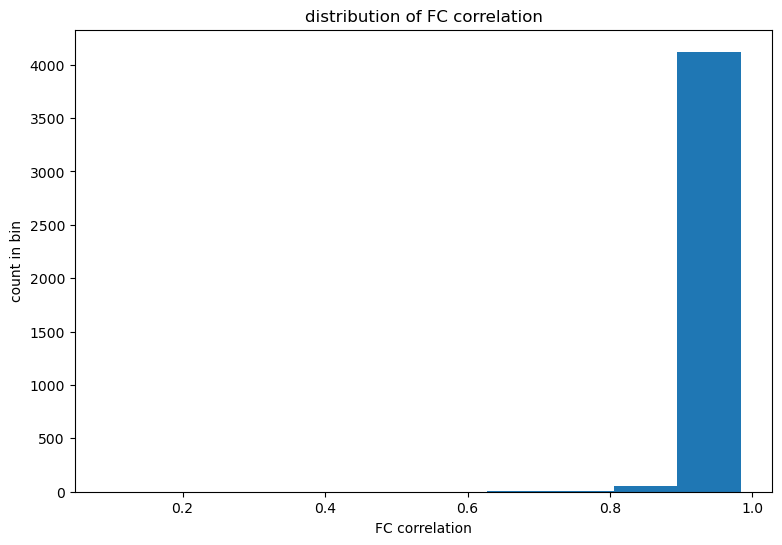

The distribution of FC correlation values has median 0.954 with 95% CI [0.903, 0.974] and range [0.0932, 0.983].


In [15]:
name = 'FC correlation'
values = fc_corr
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [16]:
best_fc_corr = torch.max(fc_corr, dim=0).values
print( best_fc_corr.size() )

torch.Size([837])


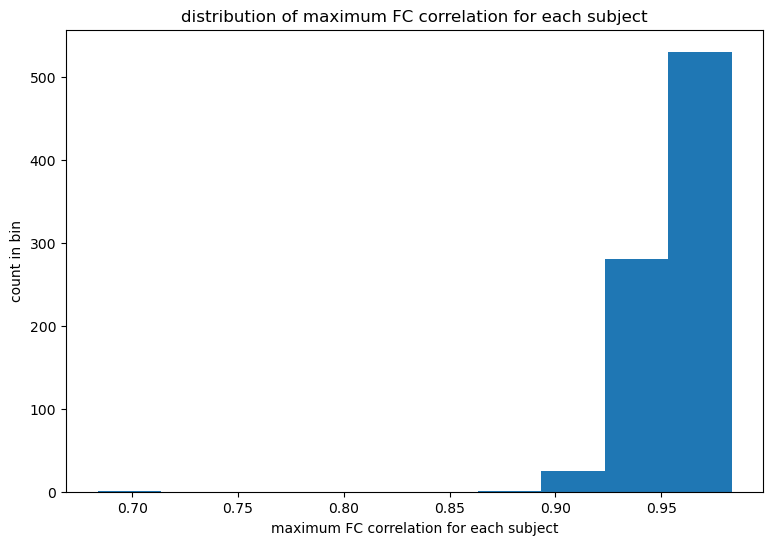

The distribution of maximum FC correlation for each subject values has median 0.958 with 95% CI [0.92, 0.977] and range [0.684, 0.983].


In [17]:
name = 'maximum FC correlation for each subject'
values = best_fc_corr
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [14]:
sim_file_fragment = 'all_mean_std_0_beta_demo_subject_0_init_uncentered_beta_num_10000_min_1e-09_max_1_steps_120000'
# sim_file_fragment = 'all_mean_std_2_beta_demo_subject_0_init_uncentered_beta_num_10000_min_1e-09_max_10_steps_120000'

In [15]:
flip_rate_file = os.path.join(file_dir, f'flip_rate_{sim_file_fragment}.pt')
flip_rate = torch.load(flip_rate_file)
print( flip_rate.size() )

torch.Size([10000, 1, 360])


In [16]:
beta = torch.linspace(start=1e-09, end=1, steps=10000, dtype=flip_rate.dtype, device=flip_rate.device)
# beta = torch.linspace(start=1e-09, end=10, steps=10000, dtype=flip_rate.dtype, device=flip_rate.device)
print( beta.size() )

torch.Size([10000])


In [17]:
flip_rate_std, flip_rate_mean = torch.std_mean( torch.squeeze(flip_rate, dim=1), dim=-1 )
print( flip_rate_std.size() )

torch.Size([10000])


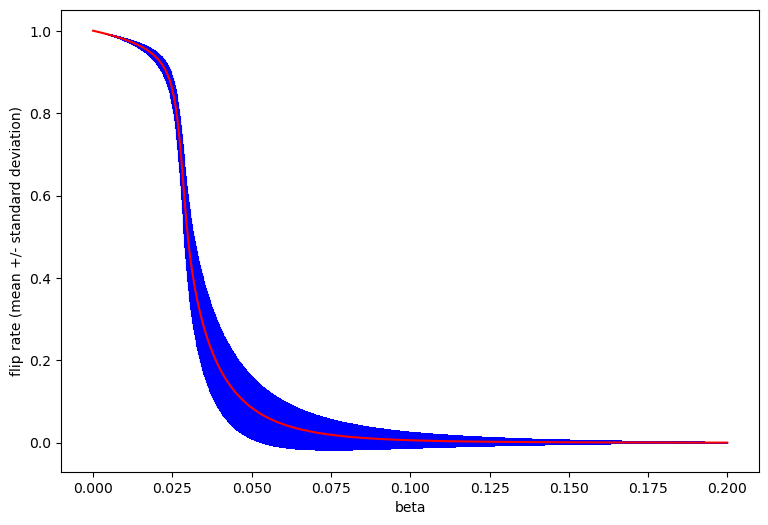

In [21]:
cutoff_index = 2000
make_errorbar(xname='beta', xvalues=beta[:cutoff_index], yname='flip rate (mean +/- standard deviation)', yvalues=flip_rate_mean[:cutoff_index], yerrs=flip_rate_std[:cutoff_index])

In [23]:
print( flip_rate_std.max(), flip_rate_mean.max() )

tensor(0.1115, device='cuda:0') tensor(1.0000, device='cuda:0')


In [24]:
log_beta = beta.log10()
log_flip_rate_std, log_flip_rate_mean = torch.std_mean(  torch.squeeze( flip_rate.log10(), dim=1 ), dim=-1  )
print( log_flip_rate_std.size() )

torch.Size([10000])


1000


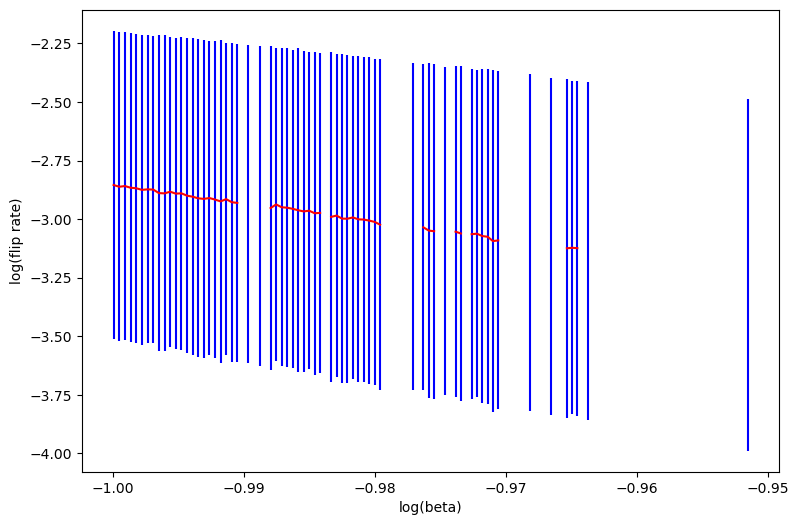

In [31]:
cutoff_index = beta.numel()//10
print(cutoff_index)
make_errorbar( xname='log(beta)', xvalues=log_beta[cutoff_index:], yname='log(flip rate)', yvalues=log_flip_rate_mean[cutoff_index:], yerrs=log_flip_rate_std[cutoff_index:])

In [15]:
sim_state_mean_file = os.path.join(file_dir, f'sim_state_mean_{sim_file_fragment}.pt')
sim_state_mean = torch.load(sim_state_mean_file)
print( sim_state_mean.size() )

torch.Size([10000, 1, 360])


In [16]:
sim_state_product_mean_file = os.path.join(file_dir, f'sim_state_product_mean_{sim_file_fragment}.pt')
sim_state_product_mean = torch.load(sim_state_product_mean_file)
print( sim_state_product_mean.size() )

torch.Size([10000, 1, 360, 360])


In [17]:
sim_state_product_mean = sim_state_product_mean.squeeze(dim=1)
sim_state_mean = sim_state_mean.squeeze(dim=1)

In [18]:
data_file_name_part = 'all_mean_std_0'

In [19]:
target_state_mean_file = os.path.join(file_dir, f'mean_state_{data_file_name_part}.pt')
target_state_mean = torch.load(target_state_mean_file)
# On load, the dimensions of target_state_mean should be scan x subject x node.
print( f'loaded target_state_mean with size', target_state_mean.size() )
target_state_mean = target_state_mean[:,0,:]
target_state_mean = torch.mean(target_state_mean, dim=0, keepdim=True)
print( f'selected one subject, so now', target_state_mean.size() )

loaded target_state_mean with size torch.Size([4, 837, 360])
selected one subject, so now torch.Size([1, 360])


In [20]:
target_state_product_mean_file = os.path.join(file_dir, f'mean_state_product_{data_file_name_part}.pt')
target_state_product_mean = torch.load(target_state_product_mean_file)
print( f'loaded target_state_product_mean with size', target_state_product_mean.size() )
target_state_product_mean = target_state_product_mean[:,0,:,:]
target_state_product_mean = torch.mean(target_state_product_mean, dim=0, keepdim=True)
print( f'selected one subject, so now', target_state_product_mean.size() )

loaded target_state_product_mean with size torch.Size([4, 837, 360, 360])
selected one subject, so now torch.Size([1, 360, 360])


In [21]:
sim_cov = sim_state_product_mean - sim_state_mean[:,:,None] * sim_state_mean[:,None,:]
#isingmodellight.get_cov(state_mean=sim_state_mean, state_product_mean=sim_state_product_mean)

In [22]:
target_cov = target_state_product_mean - target_state_mean[:,:,None] * target_state_mean[:,None,:]

In [23]:
cov_rmse = isingmodellight.get_pairwise_rmse_ut( mat1=sim_cov.unsqueeze(dim=0), mat2=target_cov.unsqueeze(dim=0) )
print( cov_rmse.size() )
cov_rmse = cov_rmse.squeeze()
print( cov_rmse.size() )

OutOfMemoryError: CUDA out of memory. Tried to allocate 2.41 GiB (GPU 0; 8.00 GiB total capacity; 14.49 GiB already allocated; 0 bytes free; 14.50 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [24]:
beta = torch.linspace( start=1e-09, end=1, steps=cov_rmse.numel(), dtype=cov_rmse.dtype, device=cov_rmse.device )
# beta = torch.linspace( start=1e-09, end=10, steps=cov_rmse.numel(), dtype=cov_rmse.dtype, device=cov_rmse.device )
print( beta.size() )

NameError: name 'cov_rmse' is not defined

In [ ]:
start_index = 1
stop_index = 500
make_scatter(xname='beta', xvalues=beta[start_index:stop_index], yname='RMSE between data and model covariances', yvalues=cov_rmse[start_index:stop_index])

In [25]:
state_mean_product_rmse = isingmodellight.get_pairwise_rmse_ut( mat1=sim_state_product_mean.unsqueeze(dim=0), mat2=target_state_product_mean.unsqueeze(dim=0) )
print( state_mean_product_rmse.size() )
state_mean_product_rmse = state_mean_product_rmse.squeeze()
print( state_mean_product_rmse.size() )

OutOfMemoryError: CUDA out of memory. Tried to allocate 2.41 GiB (GPU 0; 8.00 GiB total capacity; 14.49 GiB already allocated; 0 bytes free; 14.50 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:
start_index = 1
stop_index = 500
make_scatter(xname='beta', xvalues=beta[start_index:stop_index], yname='RMSE between data and model mean state products', yvalues=state_mean_product_rmse[start_index:stop_index])

In [ ]:
print( cov_rmse[start_index:stop_index].diff().max().item() )

In [ ]:
state_mean_rmse = isingmodellight.get_pairwise_rmse( mat1=sim_state_mean.unsqueeze(dim=0), mat2=target_state_mean.unsqueeze(dim=0) )
print( state_mean_rmse.size() )
state_mean_rmse = state_mean_rmse.squeeze()
print( state_mean_rmse.size() )

In [ ]:
start_index = 0
stop_index = 500
make_scatter(xname='beta', xvalues=beta[start_index:stop_index], yname='RMSE between data and model mean states', yvalues=state_mean_rmse[start_index:stop_index])

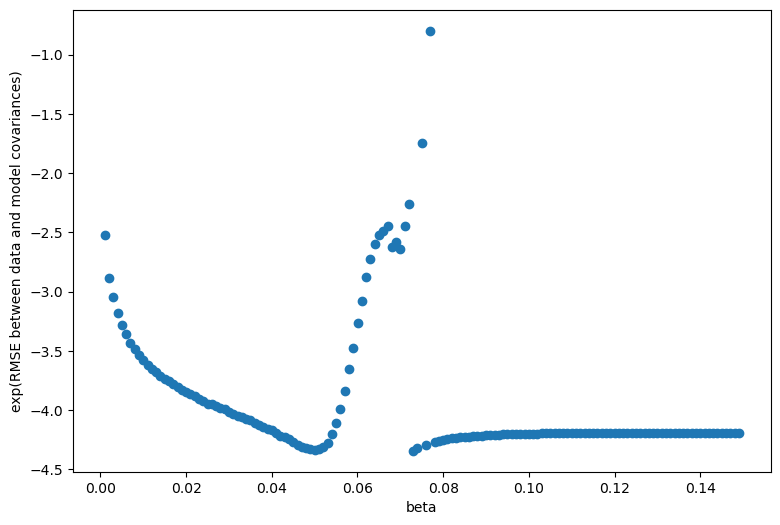

In [87]:
start_index = 1
stop_index = 150
make_scatter( xname='beta', xvalues=beta[start_index:stop_index], yname='exp(RMSE between data and model covariances)', yvalues=(cov_rmse[start_index:stop_index]).log() )

In [57]:
cov_corr = isingmodellight.get_pairwise_correlation_ut( mat1=sim_state_product_mean.unsqueeze(dim=0), mat2=target_state_product_mean.unsqueeze(dim=0) ).squeeze()
print( cov_corr.size() )

torch.Size([10000])


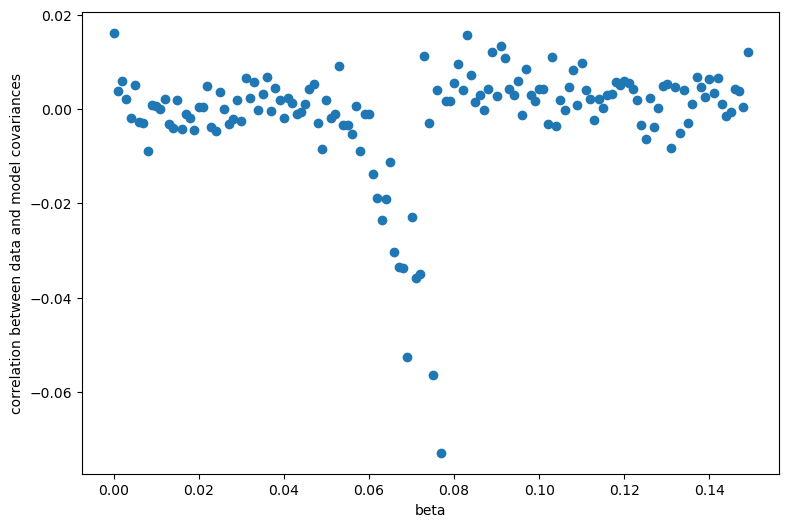

In [85]:
start_index = 0
stop_index = 150
make_scatter(xname='beta', xvalues=beta[start_index:stop_index], yname='correlation between data and model covariances', yvalues=cov_corr[start_index:stop_index])

In [14]:
data_ts = torch.load( os.path.join(file_dir, 'data_ts_all_as_is.pt') )[0,0,:,:]
print( data_ts.size() )

torch.Size([360, 1200])


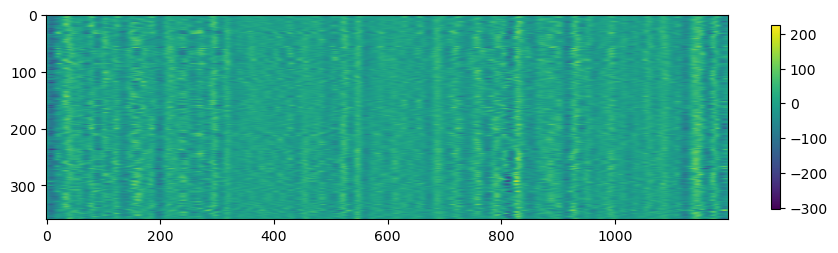

In [25]:
width = 11
height = 3
show_square(data_ts, width=width, height=height)

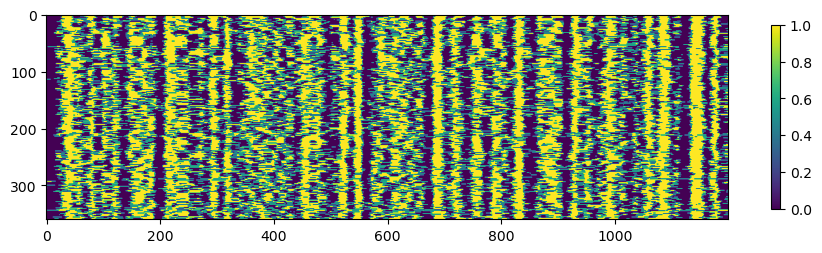

In [27]:
show_square( data_ts > torch.quantile(data_ts, q=0.5, dim=-1).unsqueeze(dim=-1), width=width, height=height )

In [28]:
data_ts_std, data_ts_mean = torch.std_mean(data_ts, dim=-1, keepdim=True)

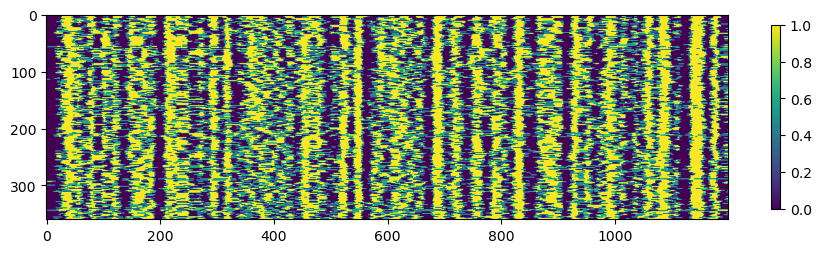

In [31]:
show_square( data_ts > (data_ts_mean + 0*data_ts_std), width=width, height=height )

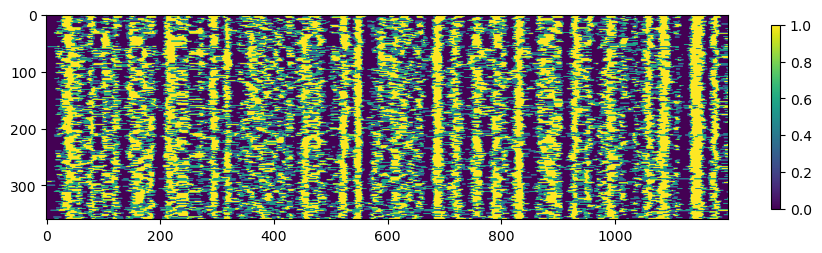

In [32]:
show_square( data_ts > (data_ts_mean + 0.1*data_ts_std), width=width, height=height )

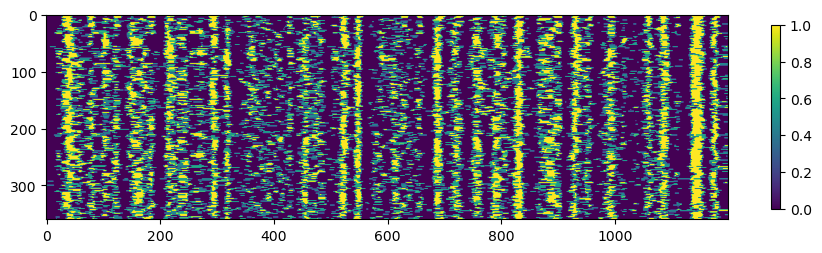

In [33]:
show_square( data_ts > (data_ts_mean + 0.5*data_ts_std), width=width, height=height )

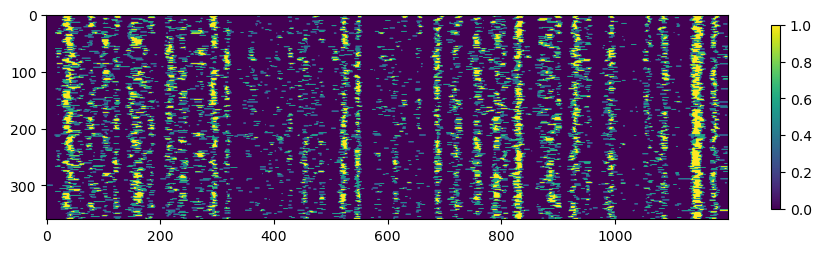

In [34]:
show_square( data_ts > (data_ts_mean + 1*data_ts_std), width=width, height=height )

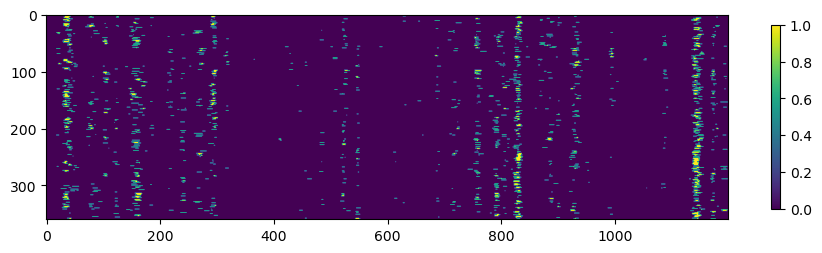

In [35]:
show_square( data_ts > (data_ts_mean + 2*data_ts_std), width=width, height=height )

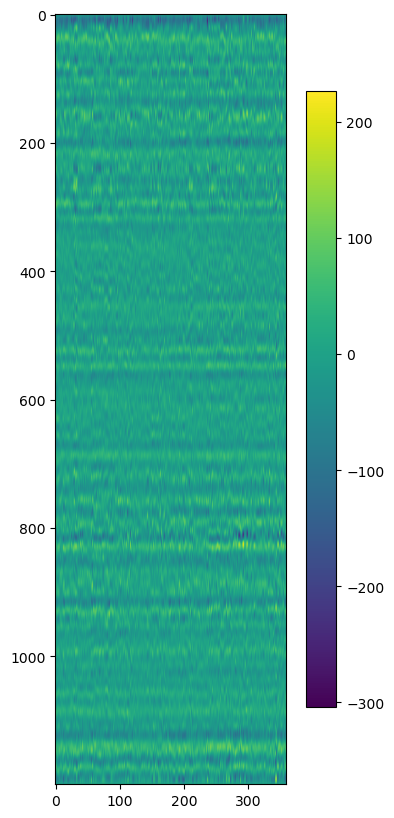

In [52]:
width = 5
height = 10
show_square( data_ts.transpose(dim0=0, dim1=1), width=width, height=height )

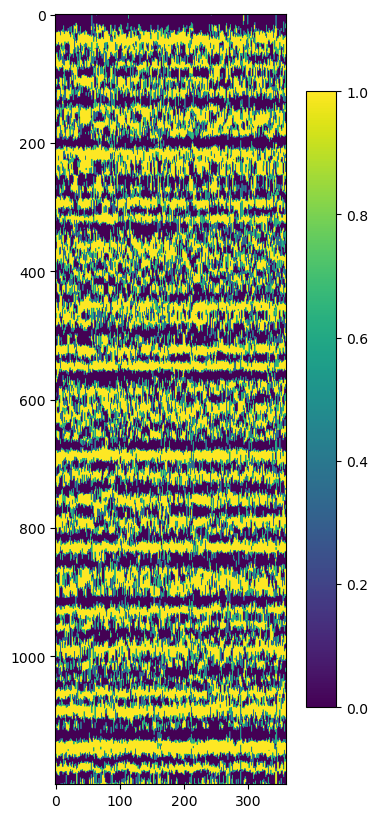

In [53]:
width = 5
height = 10
data_ts_binary = data_ts > (data_ts_mean + 0*data_ts_std)
show_square( data_ts_binary.transpose(dim0=0, dim1=1), width=width, height=height )

In [45]:
model_file_name_part = 'all_mean_std_2_long_init_uncentered_reps_5_steps_12000_beta_updates_141_lr_0.01_param_updates_1000_reset_test_length_120000'
fc_corr_file = os.path.join(file_dir, f'fc_corr_{model_file_name_part}.pt')
fc_corr = torch.load(fc_corr_file)
print(f'loaded {fc_corr_file}')
print( 'fc_corr size', fc_corr.size() )

loaded E:\Ising_model_results_daai\fc_corr_all_mean_std_2_long_init_uncentered_reps_5_steps_12000_beta_updates_141_lr_0.01_param_updates_1000_reset_test_length_120000.pt
fc_corr size torch.Size([5, 837])


In [47]:
fc_corr = fc_corr.flatten()
total_num_corr = fc_corr.numel()
fc_corr = fc_corr[ fc_corr.abs() <= 1 ]
print( f'{fc_corr.numel()} correlations out of {total_num_corr} are in [-1, 1].' )

3579 correlations out of 4185 are in [-1, 1].


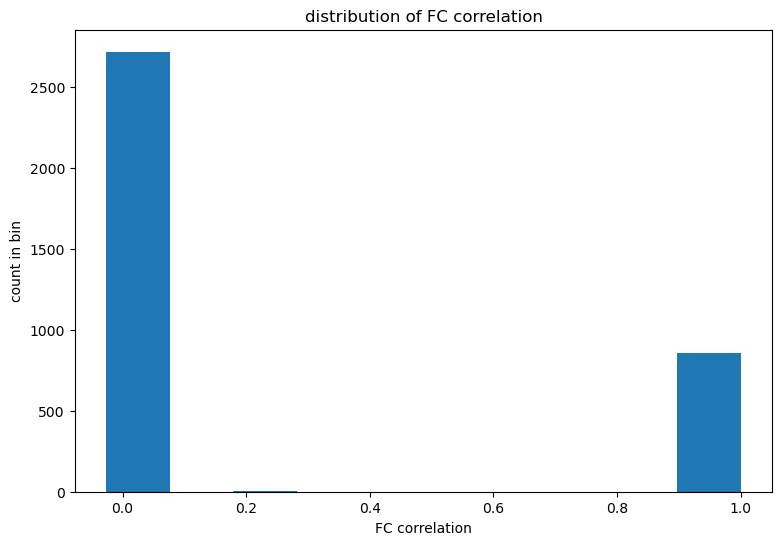

The distribution of FC correlation values has median 0.00254 with 95% CI [-0.00742, 1] and range [-0.026, 1].


In [48]:
name = 'FC correlation'
values = fc_corr
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [49]:
fc_rmse_file = os.path.join(file_dir, f'fc_rmse_{model_file_name_part}.pt')
fc_rmse = torch.load(fc_rmse_file)
print(f'loaded {fc_rmse_file}')
print( 'fc_rmse size', fc_rmse.size() )

loaded E:\Ising_model_results_daai\fc_rmse_all_mean_std_2_long_init_uncentered_reps_5_steps_12000_beta_updates_141_lr_0.01_param_updates_1000_reset_test_length_120000.pt
fc_rmse size torch.Size([5, 837])


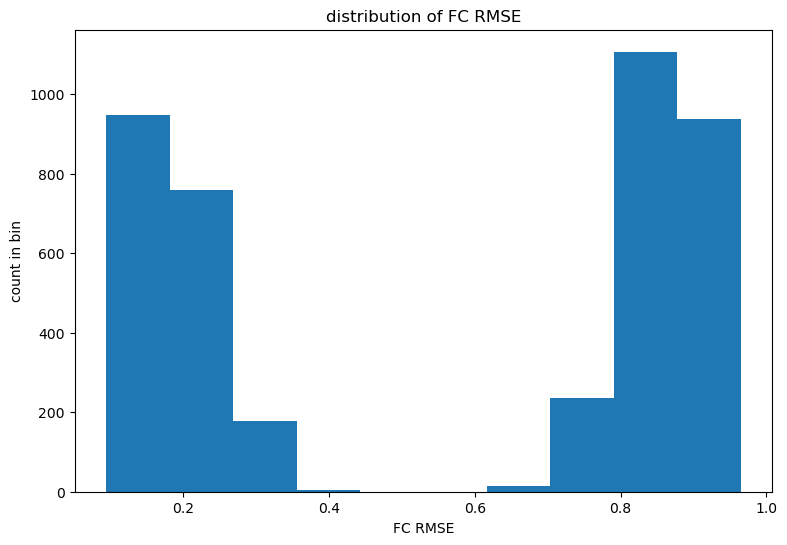

The distribution of FC RMSE values has median 0.785 with 95% CI [0.117, 0.935] and range [0.0946, 0.965].


In [50]:
name = 'FC RMSE'
values = fc_rmse
make_histogram(name=name, values=values)
print_stats(name=name, values=values)

In [64]:
test_mat = torch.zeros( (100,1), dtype=float_type, device=device )
# test_mat.random_(0, 10, )
torch.rand( size=test_mat.size(), out=test_mat )
test_mat.log_()
print( test_mat.min() )

tensor(-14.1616, device='cuda:0')


In [25]:
M = torch.rand( (2,3,40,500), dtype=float_type, device=device )
start_time = time.time()
MMT = torch.matmul( M, M.transpose(dim0=-2, dim1=-1) )
end_time = time.time()
print( f'method 1 time {end_time-start_time:.3f}, size', MMT.size() )
start_time = time.time()
MMT = torch.sum(M[:,:,:,None,:] * M[:,:,None,:,:], dim=-1)
end_time = time.time()
print( f'method 2 time {end_time-start_time:.3f}, size', MMT.size() )
start_time = time.time()
MMT = torch.bmm( M, M.transpose(dim0=-2, dim1=-1) )
end_time = time.time()
print( f'method 3 time {end_time-start_time:.3f}, size', MMT.size() )
start_time = time.time()
MMT = torch.tensordot( M, M, dims=([0,1,3],[0,1,3]) )
end_time = time.time()
print( f'method 4 time {end_time-start_time:.3f}, size', MMT.size() )

method 1 time 0.000, size torch.Size([2, 3, 40, 40])
method 2 time 0.001, size torch.Size([2, 3, 40, 40])


RuntimeError: batch1 must be a 3D tensor

In [45]:
M = torch.rand( (3,4,4), dtype=float_type, device=device )
MVSum = torch.zeros_like(M)
print( 'MVSum', MVSum.size() )
V = torch.rand( (1,4,500), dtype=float_type, device=device )
print( 'V size' )
MV = torch.matmul(M,V)
print( 'MV', MV.size() )
V_exp = V.expand(3,-1,-1)
print( 'V_exp', V_exp.size() )
MV_trans = MV.transpose(dim0=-2, dim1=-1)
print( 'MV_trans', MV_trans.size() )
VVM = torch.bmm(V_exp, MV_trans)
print( 'VVM', VVM.size() )
MVSum += VVM
print( 'MVSum', MVSum.size() )
print( 'addbmm', torch.addbmm(MVSum, V_exp, MV_trans) )
MVSum.addbmm_(batch1=V_exp, batch2=MV_trans)
print( MVSum )

MVSum torch.Size([3, 4, 4])
V size
MV torch.Size([3, 4, 500])
V_exp torch.Size([3, 4, 500])
MV_trans torch.Size([3, 500, 4])
VVM torch.Size([3, 4, 4])
MVSum torch.Size([3, 4, 4])


RuntimeError: expand(torch.cuda.FloatTensor{[3, 4, 4]}, size=[4, 4]): the number of sizes provided (2) must be greater or equal to the number of dimensions in the tensor (3)

In [37]:
x = torch.rand( (2,3,1) )
print( x.size() )
print( x.expand(2, 3, 4) )
print( x.expand(-1, -1, 4) )
V = torch.rand( (1,4,500), dtype=float_type, device=device )
print( V.expand(3,-1,-1) )

torch.Size([2, 3, 1])
tensor([[[0.8603, 0.8603, 0.8603, 0.8603],
         [0.9862, 0.9862, 0.9862, 0.9862],
         [0.7396, 0.7396, 0.7396, 0.7396]],

        [[0.5800, 0.5800, 0.5800, 0.5800],
         [0.3816, 0.3816, 0.3816, 0.3816],
         [0.3500, 0.3500, 0.3500, 0.3500]]])
tensor([[[0.8603, 0.8603, 0.8603, 0.8603],
         [0.9862, 0.9862, 0.9862, 0.9862],
         [0.7396, 0.7396, 0.7396, 0.7396]],

        [[0.5800, 0.5800, 0.5800, 0.5800],
         [0.3816, 0.3816, 0.3816, 0.3816],
         [0.3500, 0.3500, 0.3500, 0.3500]]])
tensor([[[0.4907, 0.2901, 0.4240,  ..., 0.1689, 0.9861, 0.9569],
         [0.9034, 0.9974, 0.3405,  ..., 0.5461, 0.7036, 0.7629],
         [0.6364, 0.6825, 0.3735,  ..., 0.0505, 0.1419, 0.4800],
         [0.4545, 0.0477, 0.1621,  ..., 0.5805, 0.1833, 0.2911]],

        [[0.4907, 0.2901, 0.4240,  ..., 0.1689, 0.9861, 0.9569],
         [0.9034, 0.9974, 0.3405,  ..., 0.5461, 0.7036, 0.7629],
         [0.6364, 0.6825, 0.3735,  ..., 0.0505, 0.1419, 0.4800

In [46]:
M = torch.randn(3, 5)
batch1 = torch.randn(10, 3, 4)
batch2 = torch.randn(10, 4, 5)
torch.addbmm(M, batch1, batch2)

tensor([[  6.2080,   1.7022,   4.5361,   2.7384,  17.3343],
        [  4.8006,   6.2813, -10.4346,   9.4569, -10.2548],
        [  6.3557,   7.2768,  -4.5673,   4.4572,   0.1281]])

In [14]:
# avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_mean_std_0_medium_init_uncentered_reps_5_steps_1200_beta_updates_71_lr_0.01_param_updates_10000_test_length_120000.pt') )
avalanche_counts = torch.load( os.path.join(file_dir, 'avalanche_counts_all_mean_std_0.5_medium_init_uncentered_reps_10_target_cov_rmse_lr_0.01_steps_1200_pupd_per_bopt_1000_num_opt_0_bopt_steps_175_popt_steps_7000_test_length_120000.pt') )
print( avalanche_counts.size() )

torch.Size([10, 837, 361])


In [15]:
avalanche_counts = avalanche_counts[training_index_start:training_index_end,:]
avalanche_probs = avalanche_counts/avalanche_counts.sum(dim=-1,keepdim=True)
std_avalanche_probs, mean_avalanche_probs = torch.std_mean( avalanche_probs, dim=(0,1) )
print( std_avalanche_probs.size() )

torch.Size([361])


In [16]:
avalanche_size = torch.arange( std_avalanche_probs.numel(), dtype=std_avalanche_probs.dtype, device=std_avalanche_probs.device )
print( avalanche_size.size() )

torch.Size([361])


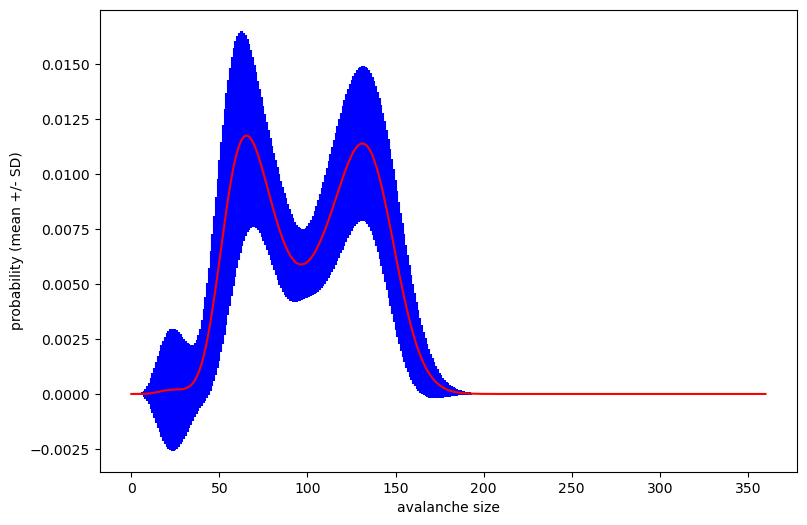

In [17]:
make_errorbar(xname='avalanche size', xvalues=avalanche_size, yname='probability (mean +/- SD)', yvalues=mean_avalanche_probs, yerrs=std_avalanche_probs)

In [18]:
log_avalanche_probs = avalanche_probs.log()
std_log_avalanche_probs, mean_log_avalanche_probs = torch.std_mean( log_avalanche_probs, dim=(0,1) )
print( std_log_avalanche_probs.size() )
log_avalanche_size = avalanche_size.log()
print( log_avalanche_size.size() )

torch.Size([361])
torch.Size([361])


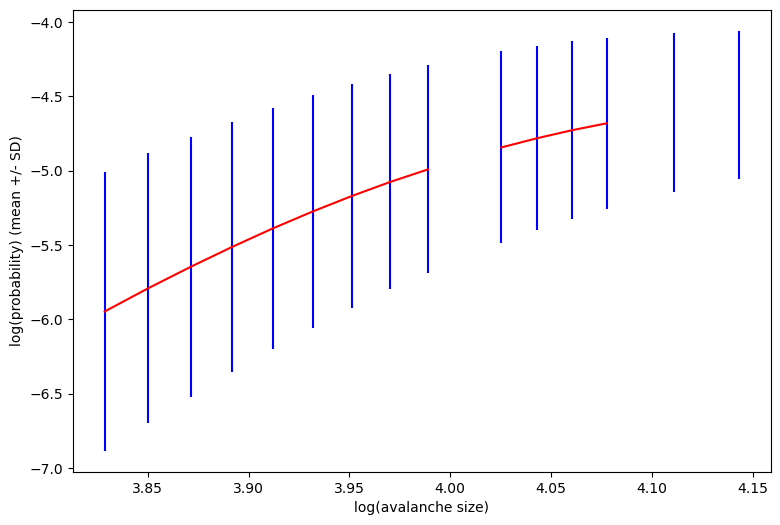

In [19]:
make_errorbar(xname='log(avalanche size)', xvalues=log_avalanche_size, yname='log(probability) (mean +/- SD)', yvalues=mean_log_avalanche_probs, yerrs=std_log_avalanche_probs)

In [113]:
threshold_file_str = 'all_selected_choices_301'
avalanche_counts = torch.load( os.path.join(file_dir, f'avalanche_counts_{threshold_file_str}.pt') )
print( avalanche_counts.size() )
thresholds, slope, intercept, r_squared, num_nonzero_counts = torch.load( os.path.join(file_dir, f'avalanche_freq_prob_log_log_fits_{threshold_file_str}.pt') )
print( thresholds.size() )

torch.Size([301, 361])
torch.Size([301])


In [114]:
num_thresholds = thresholds.numel()
avalanche_probs = avalanche_counts/avalanche_counts.sum(dim=-1, keepdim=True)
log_avalanche_probs = avalanche_probs[:,1:].log()
avalanche_sizes = torch.arange( avalanche_probs.size(dim=-1), dtype=float_type, device=device )
log_avalanche_sizes = avalanche_sizes[1:].log()

In [115]:
predicted_log_avalanche_probs = log_avalanche_sizes * slope.unsqueeze(dim=-1) + intercept.unsqueeze(dim=-1)
print( predicted_log_avalanche_probs.size() )

torch.Size([301, 360])


Text(0, 0.5, 'ln(probability of this many nodes flipped in time step)')

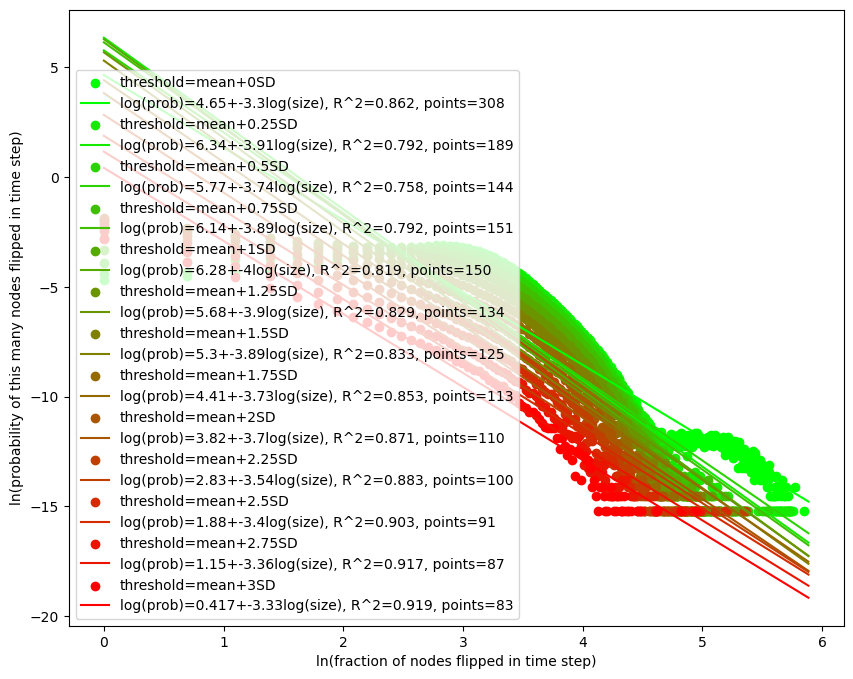

In [126]:
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
reds = torch.linspace(start=0, end=1, steps=num_thresholds, dtype=float_type, device=device)
greens = torch.linspace(start=1, end=0, steps=num_thresholds, dtype=float_type, device=device)
blues = torch.zeros_like(greens)
colors = torch.stack( (reds, greens, blues), dim=-1 )
colors_np = depytorch(colors)
log_avalanche_sizes_np = depytorch(log_avalanche_sizes)
log_avalanche_probs_np = depytorch(log_avalanche_probs)
predicted_log_avalanche_probs_np = depytorch(predicted_log_avalanche_probs)
for threshold_index in torch.linspace(start=0, end=num_thresholds-1, steps=13, dtype=int_type, device=device):
    threshold = thresholds[threshold_index]
    axs.scatter(log_avalanche_sizes_np, log_avalanche_probs_np[threshold_index,:], color=colors_np[threshold_index,:], label=f'threshold=mean+{threshold:.3g}SD')
    axs.plot(log_avalanche_sizes_np, predicted_log_avalanche_probs_np[threshold_index,:], color=colors_np[threshold_index,:], label=f'log(prob)={intercept[threshold_index]:.3g}+{slope[threshold_index]:.3g}log(size), R^2={r_squared[threshold_index]:.3g}, points={num_nonzero_counts[threshold_index]}')
axs.legend()
axs.set_xlabel('ln(fraction of nodes flipped in time step)')
axs.set_ylabel('ln(probability of this many nodes flipped in time step)')

Text(0, 0.5, 'R^2 of least-squares regression line fit to log-log plot of avalanche size vs probability')

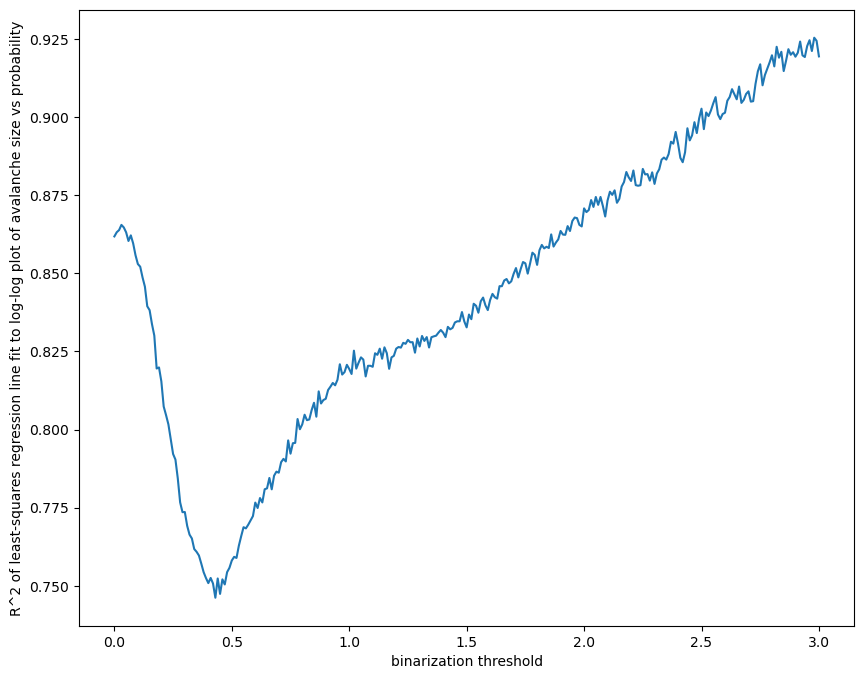

In [121]:
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
axs.plot( depytorch(thresholds), depytorch(r_squared) )
axs.set_xlabel('binarization threshold')
axs.set_ylabel('R^2 of least-squares regression line fit to log-log plot of avalanche size vs probability')

In [ ]:
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
reds = torch.linspace(start=0, end=1, steps=num_thresholds, dtype=float_type, device=device)
greens = torch.linspace(start=1, end=0, steps=num_thresholds, dtype=float_type, device=device)
blues = torch.zeros_like(greens)
colors = torch.stack( (reds, greens, blues), dim=-1 )
colors_np = depytorch(colors)
log_avalanche_sizes_np = depytorch(log_avalanche_sizes)
log_avalanche_probs_np = depytorch(log_avalanche_probs)
predicted_log_avalanche_probs_np = depytorch(predicted_log_avalanche_probs)
for threshold_index in torch.linspace(start=0, end=num_thresholds-1, steps=13, dtype=int_type, device=device):
    threshold = thresholds[threshold_index]
    axs.scatter(log_avalanche_sizes_np, log_avalanche_probs_np[threshold_index,:], color=colors_np[threshold_index,:], label=f'threshold=mean+{threshold:.3g}SD')
    # axs.plot(log_avalanche_sizes_np, predicted_log_avalanche_probs_np[threshold_index,:], color=colors_np[threshold_index,:], label=f'log(prob)={intercept[threshold_index]:.3g}+{slope[threshold_index]:.3g}log(size), R^2={r_squared[threshold_index]:.3g}, points={num_nonzero_counts[threshold_index]}')
axs.legend()
axs.set_xlabel('ln(fraction of nodes flipped in time step)')
axs.set_ylabel('ln(probability of this many nodes flipped in time step)')

In [16]:
# num_choices = 101
# all_thresholds = torch.linspace(start=-3, end=3, steps=101, dtype=float_type, device=device)
# num_choices = 141
# all_thresholds = torch.linspace(start=-2, end=5, steps=141, dtype=float_type, device=device)
num_choices = 701
all_thresholds = torch.linspace(start=-2, end=6, steps=num_choices, dtype=float_type, device=device)
# num_choices = 81
# all_thresholds = torch.linspace(start=-2, end=6, steps=num_choices, dtype=float_type, device=device)
num_steps = 1200
num_nodes = 360
num_sizes = num_steps * num_nodes
# num_time_series = 3347
all_durations = torch.arange(start=0, end=num_steps+1, dtype=int_type, device=device)
all_num_nodes = torch.arange(start=0, end=num_nodes+1, dtype=int_type, device=device)
all_sizes = torch.arange(start=0, end=num_sizes+1, dtype=int_type, device=device)
avalanche_stats_fragment = f'all_choices_{num_choices}'
gap_duration_counts = torch.load( os.path.join(file_dir, f'gap_duration_counts_{avalanche_stats_fragment}.pt') )
print( gap_duration_counts.size() )
avalanche_duration_counts = torch.load( os.path.join(file_dir, f'avalanche_duration_counts_{avalanche_stats_fragment}.pt') )
print( avalanche_duration_counts.size() )
avalanche_size_counts = torch.load( os.path.join(file_dir, f'avalanche_size_counts_{avalanche_stats_fragment}.pt') )
print( avalanche_size_counts.size() )
avalanche_unique_nodes_counts = torch.load( os.path.join(file_dir, f'avalanche_unique_nodes_counts_{avalanche_stats_fragment}.pt') )
print( avalanche_unique_nodes_counts.size() )

torch.Size([701, 1201])
torch.Size([701, 1201])
torch.Size([701, 259704])
torch.Size([701, 361])


Text(0, 0.5, 'count')

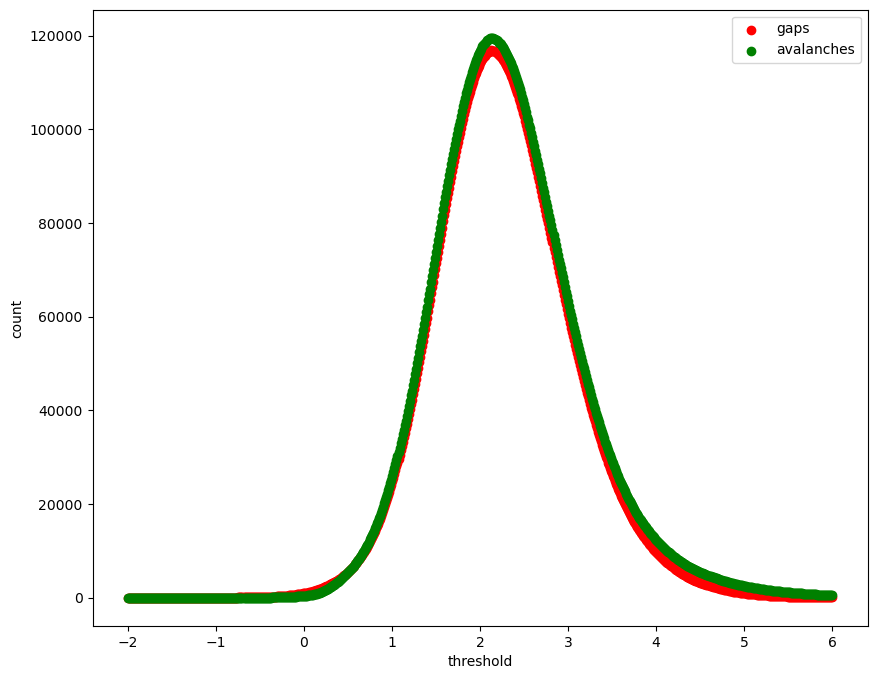

In [26]:
gap_count = gap_duration_counts.sum(dim=-1)
avalanche_count = avalanche_duration_counts.sum(dim=-1)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds)
axs.scatter( all_thresholds_np, depytorch(gap_count), color='red', label='gaps')
axs.scatter( all_thresholds_np, depytorch(avalanche_count), color='green', label='avalanches')
axs.legend()
axs.set_xlabel('threshold')
axs.set_ylabel(f'count')

In [101]:
max_avalanche_index = torch.argmax(avalanche_count).item()
max_avalanche_count = avalanche_count[max_avalanche_index].item()
max_avalanche_threshold = all_thresholds[max_avalanche_index].item()
print(max_avalanche_index, max_avalanche_count, max_avalanche_threshold)

361 119547 2.1257143020629883


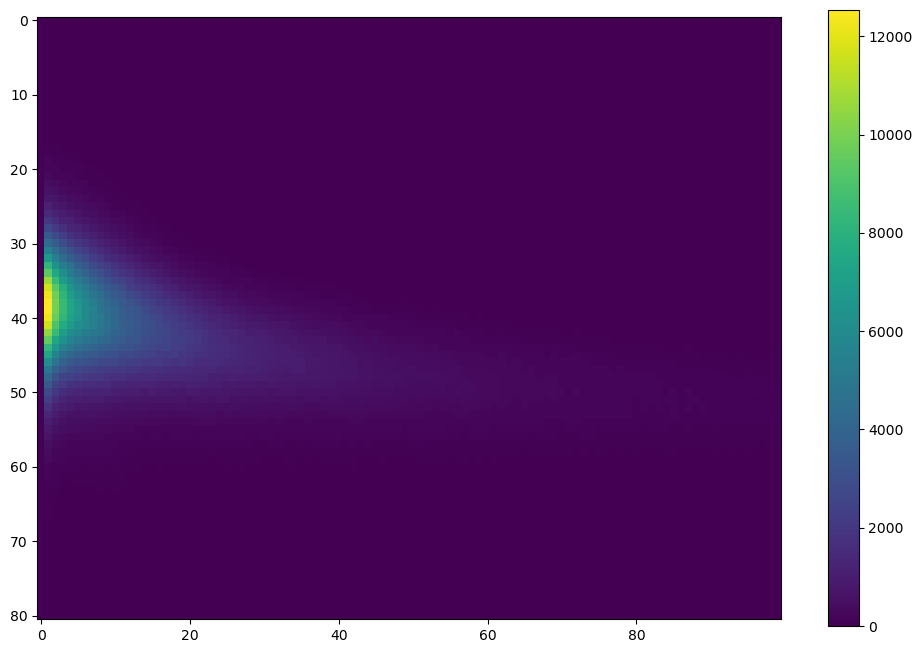

In [476]:
width=12
height=10
show_square( gap_duration_counts[:,:100], width=width, height=height )

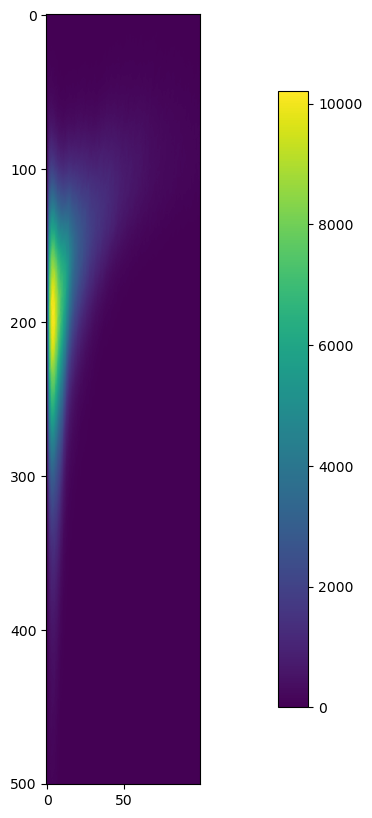

In [427]:
width=20
height=10
show_square( avalanche_duration_counts[200:,:100], width=width, height=height )

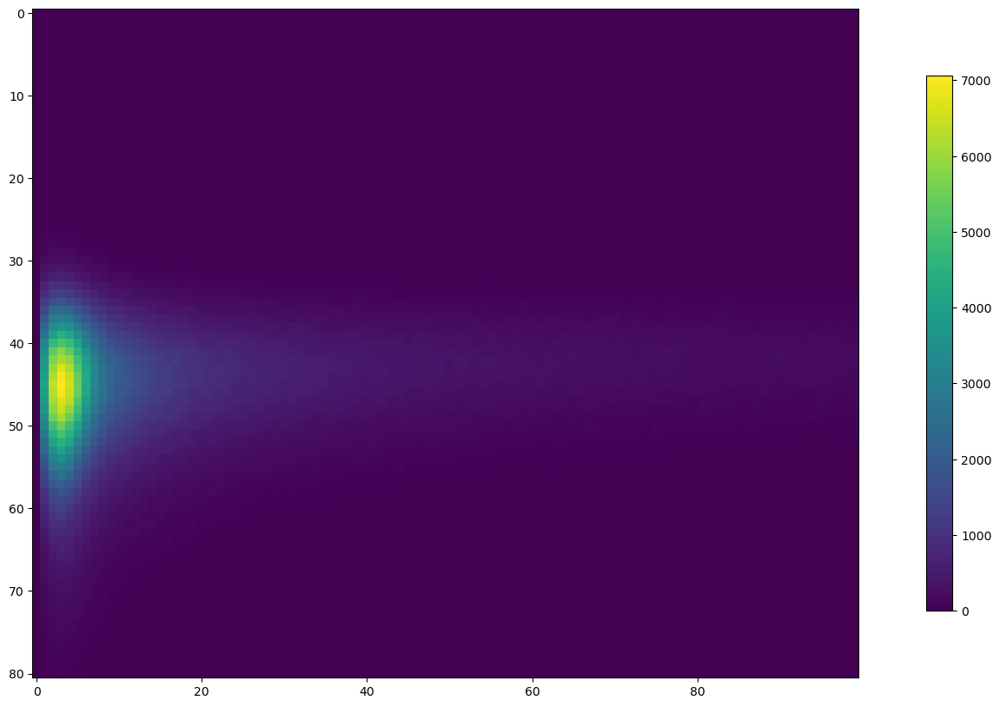

In [480]:
width=20
height=10
show_square( avalanche_size_counts[:,:100], width=width, height=height )

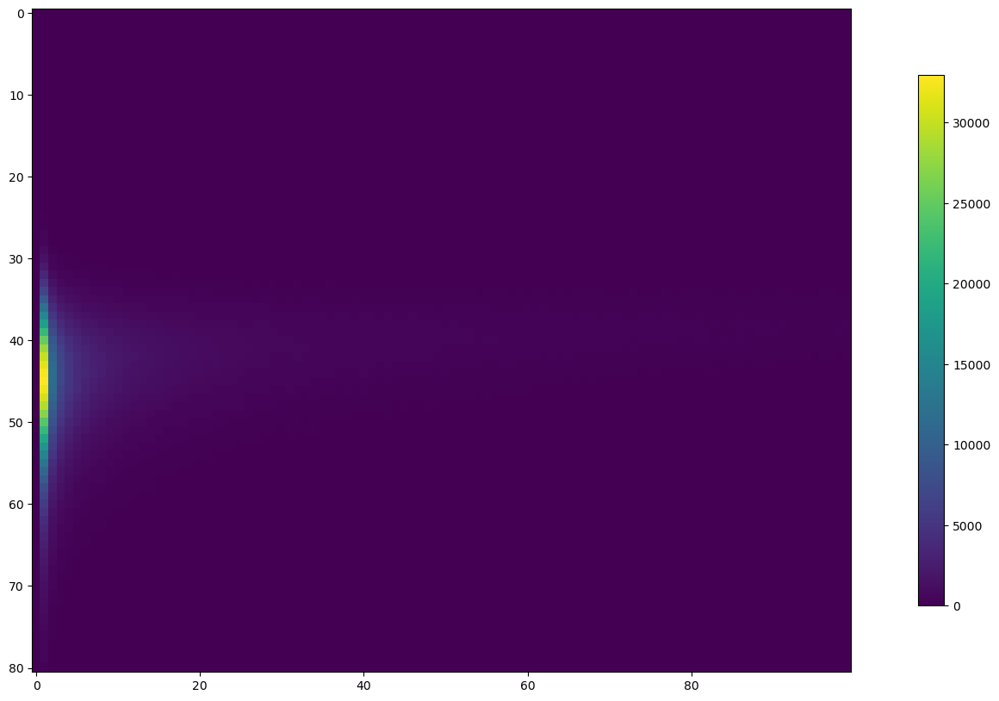

In [482]:
width=20
height=10
show_square( avalanche_unique_nodes_counts[:,:100], width=width, height=height )

Text(0, 0.5, 'log10(probability)')

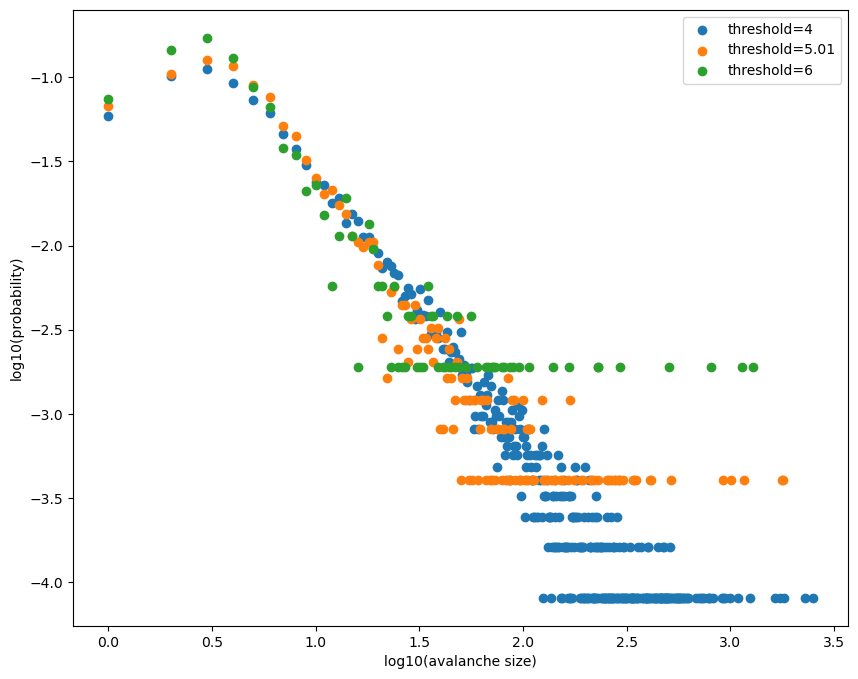

In [86]:
# selected_threshold_indices = [0, 10, 20, 30, 41, 50, 60, 70, 80]
# selected_threshold_indices = [10, 15, 20, 25, 30]
# selected_threshold_indices = [35, 40, 45, 50, 55]
# selected_threshold_indices = [60, 65, 70, 75, 80]
# selected_threshold_indices = [175, 219, 263]
# selected_threshold_indices = [306, 361, 438]
selected_threshold_indices = [525, 613, 700]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
max_size = avalanche_size_counts.size(dim=-1) 
all_sizes = all_sizes[:max_size]
for threshold_index in selected_threshold_indices:
    threshold = all_thresholds[threshold_index]
    counts_for_threshold = avalanche_size_counts[threshold_index,:]
    count_is_nonzero = counts_for_threshold != 0
    x_for_threshold = all_sizes[count_is_nonzero].log10()
    counts_for_threshold = counts_for_threshold[count_is_nonzero]
    probs = ( counts_for_threshold/counts_for_threshold.sum() ).log10()
    axs.scatter( depytorch(x_for_threshold), depytorch(probs), label=f'threshold={threshold:.3g}')
axs.legend()
axs.set_xlabel('log10(avalanche size)')
axs.set_ylabel('log10(probability)')

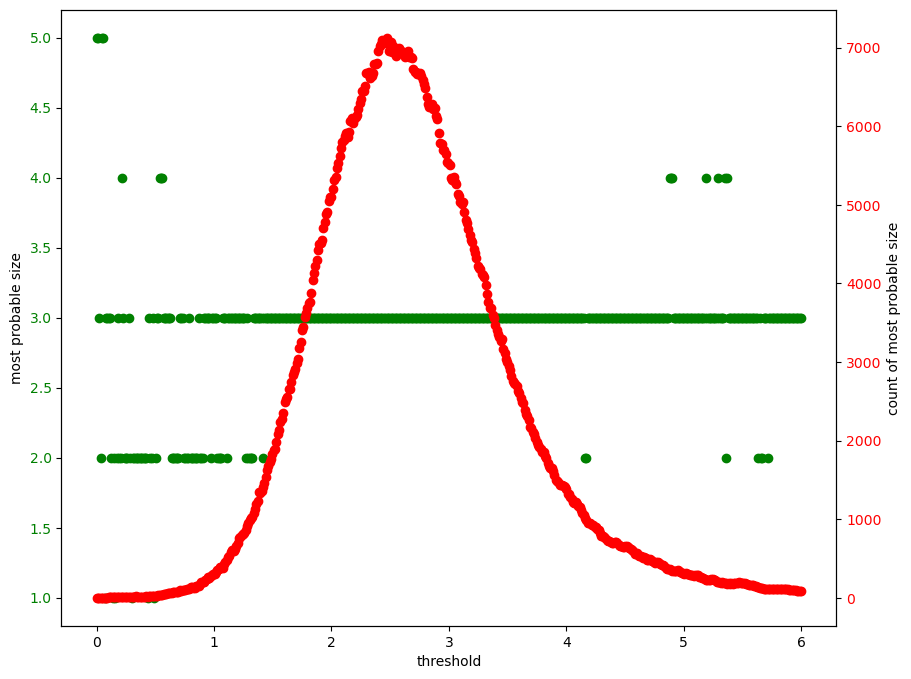

In [89]:
most_probable_size_count, max_size_count_index = avalanche_size_counts.max(dim=-1)
most_probable_size = all_sizes[max_size_count_index]
min_index = 175
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(most_probable_size[min_index:]), color='green')
axs.set_ylabel(f'most probable size')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
ax2 = axs.twinx()
ax2.scatter( all_thresholds_np, depytorch(most_probable_size_count[min_index:]), color='red')
ax2.set_ylabel(f'count of most probable size')
ax2.tick_params(axis='y', labelcolor='red')
plt.show()

In [111]:
min_pl_index = max_size_count_index[-1]
print( 'start fitting power law from (index, size)', min_pl_index.item(), all_sizes[min_pl_index].item() )

start fitting power law from (index, size) 3 3


In [128]:
min_pl_index = 4
print( 'start fitting power law from (index, size)', min_pl_index, all_sizes[min_pl_index].item() )

start fitting power law from (index, size) 4 4


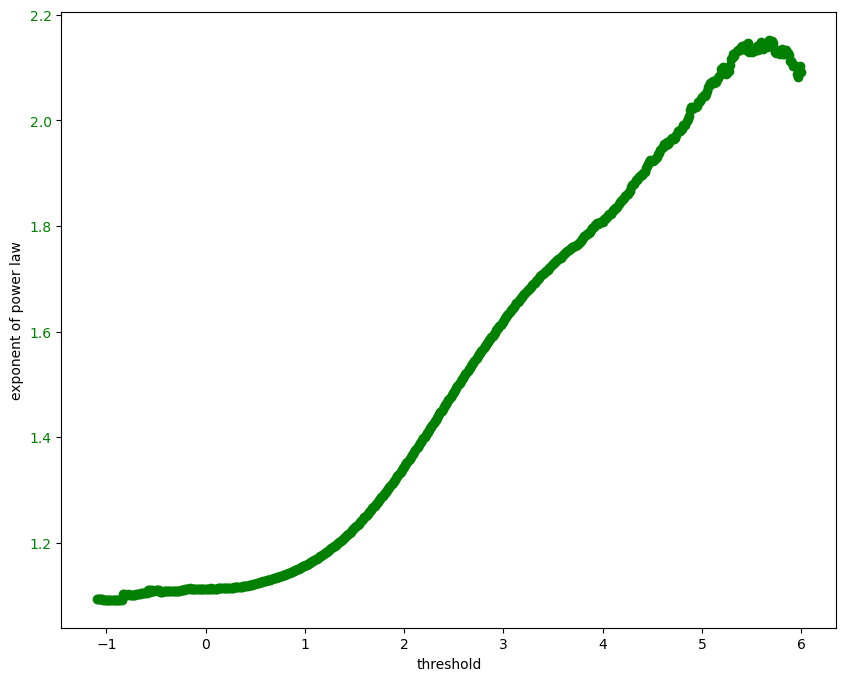

In [129]:
pl_exponent = 1 + torch.sum(avalanche_size_counts[:,min_pl_index:], dim=-1)/torch.sum( avalanche_size_counts[:,min_pl_index:] * torch.log(all_sizes[min_pl_index:]/all_sizes[min_pl_index]).unsqueeze(dim=0), dim=-1 )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(pl_exponent[min_index:]), color='green')
axs.set_ylabel(f'exponent of power law')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

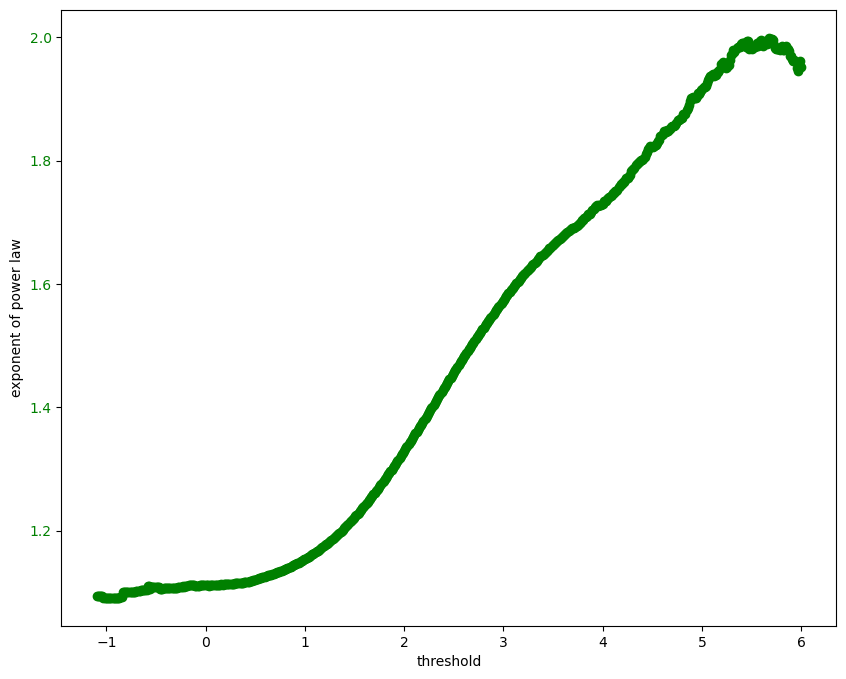

In [130]:
min_minus_half = all_sizes[min_pl_index] - 0.5
pl_exponent_approx_discrete = 1 + torch.sum(avalanche_size_counts[:,min_pl_index:], dim=-1)/torch.sum( avalanche_size_counts[:,min_pl_index:] * torch.log(all_sizes[min_pl_index:]/min_minus_half).unsqueeze(dim=0), dim=-1 )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(pl_exponent_approx_discrete[min_index:]), color='green')
axs.set_ylabel(f'exponent of power law')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

In [131]:
# https://epubs-siam-org.eu1.proxy.openathens.net/doi/epdf/10.1137/070710111 equations 3.5 and 3.7
class DiscretePowerLaw(torch.nn.Module):

    def __init__(self, avalanche_size_counts:torch.Tensor, all_sizes:torch.Tensor, min_pl_index:int, max_k:int=10000):
        super(DiscretePowerLaw, self).__init__()
        min_minus_half = all_sizes[min_pl_index] - 0.5
        init_alpha = 1 + torch.sum(avalanche_size_counts[:,min_pl_index:], dim=-1)/torch.sum( avalanche_size_counts[:,min_pl_index:] * torch.log(all_sizes[min_pl_index:]/min_minus_half).unsqueeze(dim=0), dim=-1 )
        self.n = torch.sum(avalanche_size_counts[:,min_pl_index:], dim=-1)
        self.min_x = all_sizes[min_pl_index]
        self.sum_of_log_x = torch.sum( avalanche_size_counts[:,min_pl_index:] * torch.log(all_sizes[min_pl_index:]).unsqueeze(dim=0), dim=-1 )
        self.k_plus_minx = torch.arange(start=self.min_x, end=max_k+self.min_x, dtype=self.min_x.dtype, device=self.min_x.device).unsqueeze(dim=0)
        self.alpha = torch.nn.parameter.Parameter(init_alpha)
    
    def forward(self):
        # zeta(x,q) = sum( (k+q)**(-x), dim=k_dim ) where k=torch.arange(inf)
        # log_likelihood(alpha) = -n*ln( zeta(alpha,x_min) ) - alpha*sum( ln(x), dim=x_dim )
        # self.n * torch.special.zeta(self.alpha, self.min_x).log() + self.alpha * self.sum_of_log_x
        zeta_aminx = torch.sum(  torch.pow( self.k_plus_minx, -1*self.alpha.unsqueeze(dim=-1) ), dim=-1  ).log()
        return  self.n * zeta_aminx.log() + self.alpha * self.sum_of_log_x

In [254]:
dpl = DiscretePowerLaw(avalanche_size_counts=avalanche_size_counts, all_sizes=all_sizes, min_pl_index=min_pl_index, max_k=1000000)
num_steps = 20000
likelihoods = torch.zeros(  ( dpl.alpha.numel(), num_steps ), dtype=float_type, device=device  )
opt = torch.optim.Adam( dpl.parameters(), lr=0.001 )
for opt_step in range(num_steps):
    opt.zero_grad()
    neg_ll = dpl()
    neg_ll_sum = neg_ll.sum()
    neg_ll_sum.backward()
    opt.step()
    likelihoods[:,opt_step] = neg_ll

In [255]:
nan_ll = torch.isnan(likelihoods)
num_nan_ll = torch.count_nonzero(nan_ll)
num_ll = likelihoods.numel()
print(f'{num_nan_ll} out of {num_ll}, or {num_nan_ll/num_ll:.3g} are NaN')

1792649 out of 2820000, or 0.636 are NaN


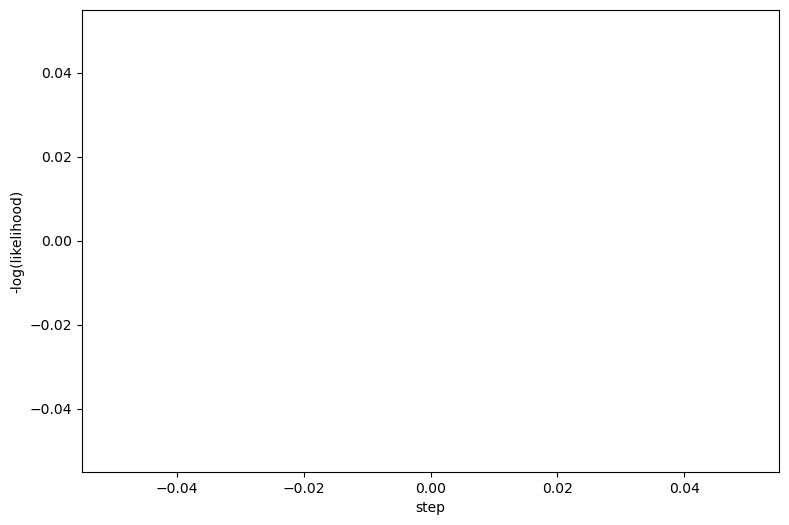

In [256]:
opt_steps = torch.arange(num_steps, dtype=float_type, device=device)
med_and_ci = torch.tensor([0.025, 0.5, 0.975], dtype=float_type, device=device)
neg_ll_quantiles = torch.quantile(likelihoods, q=med_and_ci, dim=0).transpose(dim0=0, dim1=1)
make_errorbar_two_sides(xname='step', xvalues=opt_steps, yname='-log(likelihood)', yvalues=neg_ll_quantiles)

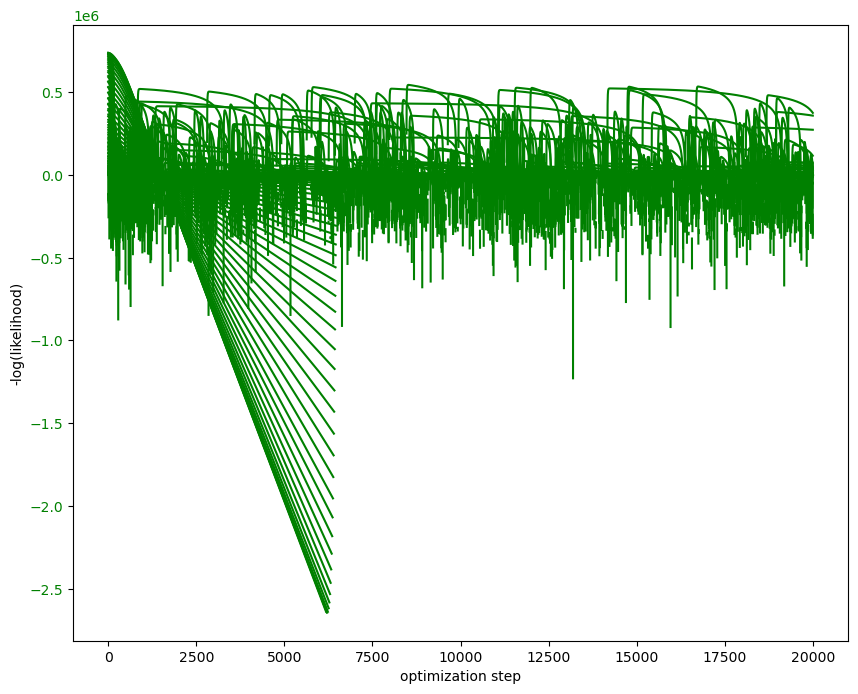

In [257]:
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
opt_steps = torch.arange(num_steps, dtype=float_type, device=device)
axs.plot(  depytorch(opt_steps), depytorch( likelihoods.transpose(dim0=0, dim1=1) ), color='green'  )
axs.set_ylabel(f'-log(likelihood)')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('optimization step')
plt.show()

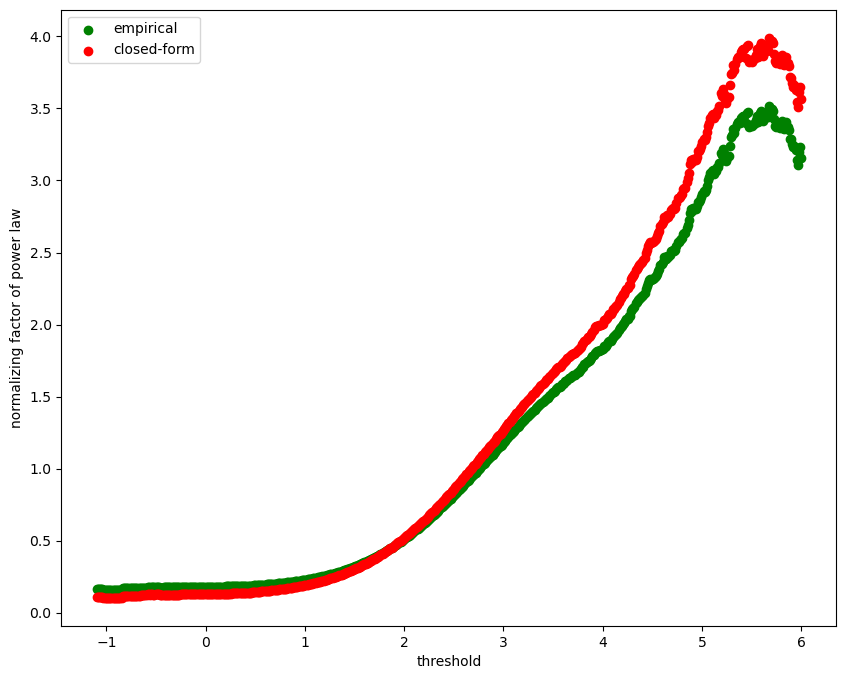

In [132]:
alpha_minus_1 = pl_exponent_approx_discrete - 1
normalizing_factor = alpha_minus_1 * torch.pow( all_sizes[min_pl_index], alpha_minus_1 )
# more_sizes = torch.arange(start=min_pl_index, end=min_pl_index+1000000, dtype=float_type, device=device)
empirical_normalizing_factor = 1/torch.sum(  torch.pow( all_sizes[min_pl_index:,None], -1*pl_exponent_approx_discrete[None,:] ), dim=0  )
# empirical_normalizing_factor = 1/torch.sum(  torch.pow( more_sizes[:,None], -1*pl_exponent_approx_discrete[None,:] ), dim=0  )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(empirical_normalizing_factor[min_index:]), color='green', label='empirical')
axs.scatter( all_thresholds_np, depytorch(normalizing_factor[min_index:]), color='red', label='closed-form')
axs.set_ylabel(f'normalizing factor of power law')
# axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
axs.legend()
plt.show()

In [124]:
print(  'count( isnan(avalanche_size_counts) )', torch.count_nonzero( torch.isnan(avalanche_size_counts) ).item()  )
num_avalanches = torch.sum(avalanche_size_counts, dim=-1, keepdim=True)
print( 'count(num_avalanches == 0)', torch.count_nonzero(num_avalanches==0).item() )
avalanche_size_probs = avalanche_size_counts/torch.sum(avalanche_size_counts, dim=-1, keepdim=True)
print(  'count( isnan(avalanche_size_probs) )', torch.count_nonzero( torch.isnan(avalanche_size_probs) ).item()  )
avalanche_size_cdf = torch.cumsum(avalanche_size_probs, dim=-1)
print(  'count( isnan(avalanche_size_cdf) )', torch.count_nonzero( torch.isnan(avalanche_size_cdf) ).item()  )
power_law_size_probs = normalizing_factor.unsqueeze(dim=-1) * torch.pow( all_sizes.unsqueeze(dim=0), -1*pl_exponent_approx_discrete.unsqueeze(dim=-1) )
print(  'count( isnan(power_law_size_probs) )', torch.count_nonzero( torch.isnan(power_law_size_probs) ).item()  )
power_law_size_cdf = torch.cumsum(power_law_size_probs, dim=-1)
print(  'count( isnan(power_law_size_cdf) )', torch.count_nonzero( torch.isnan(power_law_size_cdf) ).item()  )
cdf_diff = torch.abs(avalanche_size_cdf - power_law_size_cdf)
print(  'count( isnan(cdf_diff) )', torch.count_nonzero( torch.isnan(cdf_diff) ).item()  )
ks_distance = torch.max( cdf_diff, dim=-1 ).values
print(  'count( isnan(ks_distance) )', torch.count_nonzero( torch.isnan(ks_distance) ).item()  )

count( isnan(avalanche_size_counts) ) 0
count(num_avalanches == 0) 79
count( isnan(avalanche_size_probs) ) 20516616
count( isnan(avalanche_size_cdf) ) 20516616
count( isnan(power_law_size_probs) ) 20516616
count( isnan(power_law_size_cdf) ) 20516616
count( isnan(cdf_diff) ) 20516616
count( isnan(ks_distance) ) 79


avalanche_size_counts_selected size torch.Size([622, 259700]) nans 0 infs 0
normalizing_factor_selected size torch.Size([622]) nans 0 infs 0
pl_exponent_selected size torch.Size([622]) nans 0 infs 0
avalanche_size_probs size torch.Size([622, 259700]) nans 0 infs 0
avalanche_size_cdf size torch.Size([622, 259700]) nans 0 infs 0
power_law_size_probs size torch.Size([622, 259700]) nans 0 infs 0
power_law_size_cdf size torch.Size([622, 259700]) nans 0 infs 0
cdf_diff size torch.Size([622, 259700]) nans 0 infs 0
ks_distance size torch.Size([622]) nans 0 infs 0


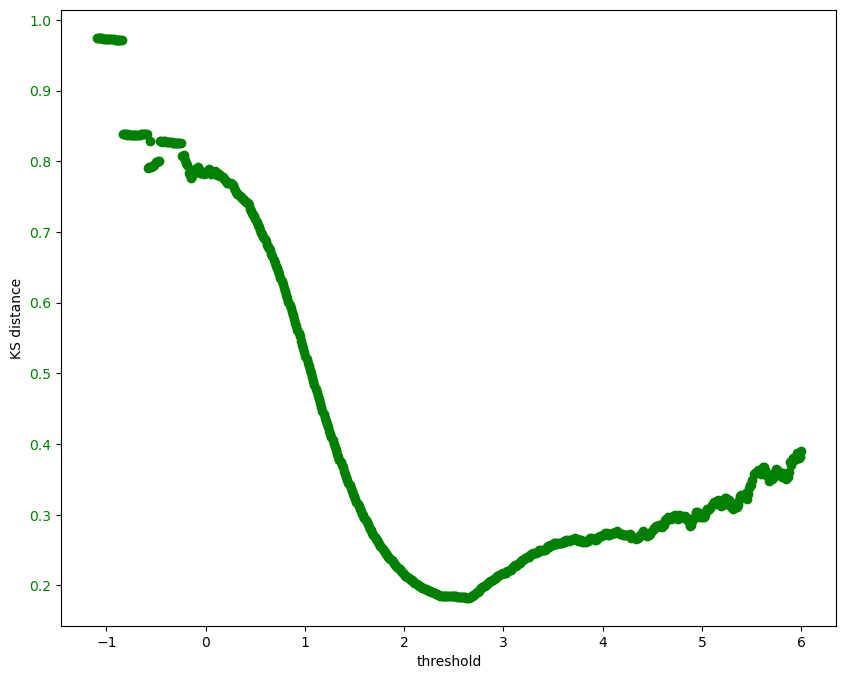

In [133]:
num_avalanches = torch.sum(avalanche_size_counts, dim=-1, keepdim=True)
nonzero_sizes = all_sizes[min_pl_index:]
has_avalanches = (num_avalanches > 0).squeeze()
selected_thresholds = all_thresholds[has_avalanches]
avalanche_size_counts_selected = avalanche_size_counts[has_avalanches,min_pl_index:]
print(  'avalanche_size_counts_selected size', avalanche_size_counts_selected.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_size_counts_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_size_counts_selected) ).item()  )
num_avalanches_selected = num_avalanches[has_avalanches,:]
normalizing_factor_selected = empirical_normalizing_factor[has_avalanches]
print(  'normalizing_factor_selected size', normalizing_factor_selected.size(), 'nans', torch.count_nonzero( torch.isnan(normalizing_factor_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(normalizing_factor_selected) ).item()  )
pl_exponent_selected = pl_exponent_approx_discrete[has_avalanches]
print(  'pl_exponent_selected size', pl_exponent_selected.size(), 'nans', torch.count_nonzero( torch.isnan(pl_exponent_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(pl_exponent_selected) ).item()  )
avalanche_size_probs = avalanche_size_counts_selected/num_avalanches_selected
print(  'avalanche_size_probs size', avalanche_size_probs.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_size_probs) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_size_probs) ).item()  )
avalanche_size_cdf = torch.cumsum(avalanche_size_probs, dim=-1)
print(  'avalanche_size_cdf size', avalanche_size_cdf.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_size_cdf) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_size_cdf) ).item()  )
power_law_size_probs = normalizing_factor_selected.unsqueeze(dim=-1) * torch.pow( nonzero_sizes.unsqueeze(dim=0), -1*pl_exponent_selected.unsqueeze(dim=-1) )
# power_law_size_probs[:,:min_index] = 0
print(  'power_law_size_probs size', power_law_size_probs.size(), 'nans', torch.count_nonzero( torch.isnan(power_law_size_probs) ).item(), 'infs', torch.count_nonzero( torch.isinf(power_law_size_probs) ).item()  )
power_law_size_cdf = torch.cumsum(power_law_size_probs, dim=-1)
print(  'power_law_size_cdf size', power_law_size_cdf.size(), 'nans', torch.count_nonzero( torch.isnan(power_law_size_cdf) ).item(), 'infs', torch.count_nonzero( torch.isinf(power_law_size_cdf) ).item()  )
cdf_diff = torch.abs(avalanche_size_cdf - power_law_size_cdf)
print(  'cdf_diff size', cdf_diff.size(), 'nans', torch.count_nonzero( torch.isnan(cdf_diff) ).item(), 'infs', torch.count_nonzero( torch.isinf(cdf_diff) ).item()  )
ks_distance = torch.max(cdf_diff, dim=-1).values
print(  'ks_distance size', ks_distance.size(), 'nans', torch.count_nonzero( torch.isnan(ks_distance) ).item(), 'infs', torch.count_nonzero( torch.isinf(ks_distance) ).item()  )
min_index = 0
max_index = selected_thresholds.numel()
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
selected_thresholds_np = depytorch(selected_thresholds[min_index:max_index])
axs.scatter( selected_thresholds_np, depytorch(ks_distance[min_index:max_index]), color='green')
axs.set_ylabel(f'KS distance')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

In [134]:
min_ksd_index = ks_distance.argmin()
min_ksd_threshold = selected_thresholds[min_ksd_index]
min_ksd = ks_distance[min_ksd_index]
print(f'Threshold {min_ksd_threshold:.3g} has the lowest KS distance, {min_ksd:.3g}, and power law P(size) = {normalizing_factor_selected[min_ksd_index]:.3g}*size^{-1*pl_exponent_selected[min_ksd_index]:.3g}.')

Threshold 2.63 has the lowest KS distance, 0.183, and power law P(size) = 0.906*size^-1.49.


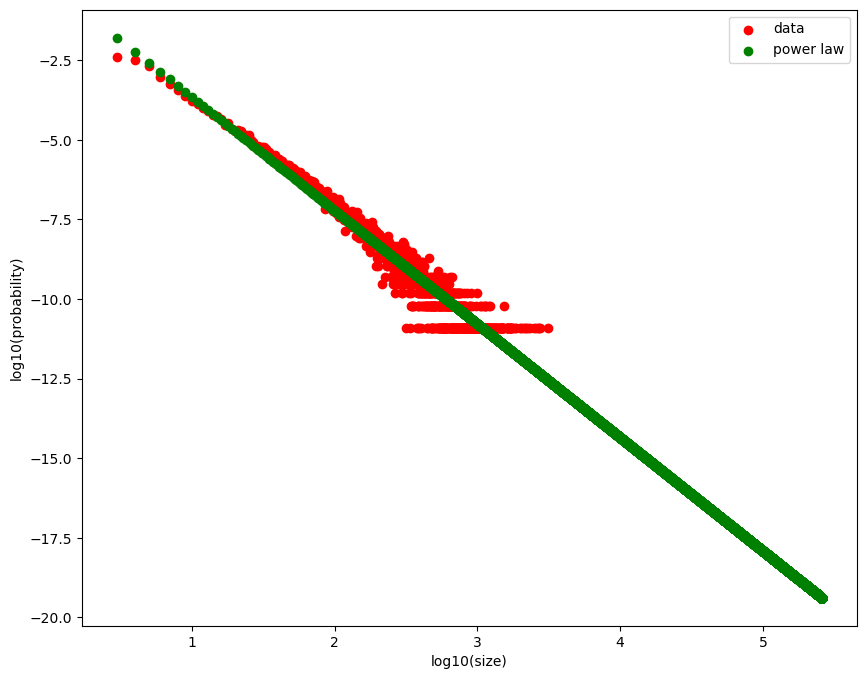

In [537]:
threshold_index = min_ksd_index
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
log_nonzero_sizes_np = depytorch( nonzero_sizes.log10() )
axs.scatter(  log_nonzero_sizes_np, depytorch( avalanche_size_probs[threshold_index,:].log() ), color='red', label='data'  )
axs.scatter(  log_nonzero_sizes_np, depytorch( power_law_size_probs[threshold_index,:].log() ), color='green', label='power law'  )
axs.set_xlabel(f'log10(size)')
# axs.tick_params(axis='y', labelcolor='green')
axs.set_ylabel('log10(probability)')
axs.legend()
plt.show()

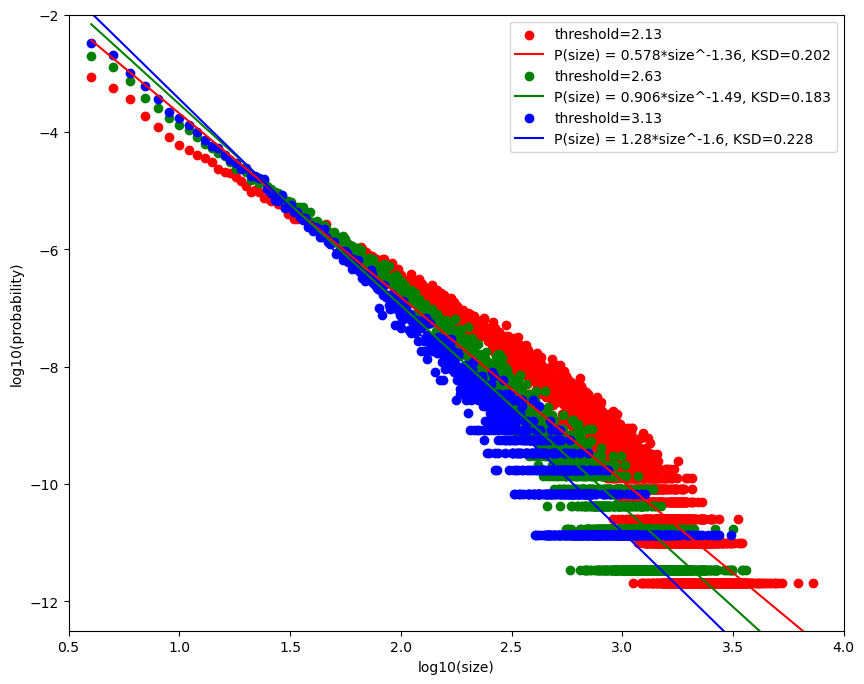

In [135]:
index_offset = 10
max_num_points_index = 282
indices_to_plot = [max_num_points_index, min_ksd_index, min_ksd_index+(min_ksd_index-max_num_points_index)]# [min_ksd_index-index_offset, min_ksd_index, min_ksd_index+index_offset]
plot_colors = ['red', 'green', 'blue']
num_to_plot = len(indices_to_plot)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
log_nonzero_sizes_np = depytorch( nonzero_sizes.log10() )
for plot_index in range(num_to_plot):
    threshold_index = indices_to_plot[plot_index]
    threshold = selected_thresholds[threshold_index]
    plexp_for_thresh = pl_exponent_selected[threshold_index]
    norm_factor_for_thresh = normalizing_factor_selected[threshold_index]
    ksd_for_thresh = ks_distance[threshold_index]
    plot_color = plot_colors[plot_index]
    axs.scatter(  log_nonzero_sizes_np, depytorch( avalanche_size_probs[threshold_index,:].log() ), color=plot_color, label=f'threshold={threshold:.3g}'  )
    axs.plot(  log_nonzero_sizes_np, depytorch( power_law_size_probs[threshold_index,:].log() ), color=plot_color, label=f'P(size) = {norm_factor_for_thresh:.3g}*size^{-1*plexp_for_thresh:.3g}, KSD={ksd_for_thresh:.3g}'  )
axs.set_xlim([0.5, 4.0])
axs.set_ylim([-12.5, -2.0])
axs.set_xlabel('log10(size)')
axs.set_ylabel('log10(probability)')
axs.legend()
plt.show()

In [136]:
# Try everything again but optimizing x_min for each threshold to minimize KS distance.
any_has_size = (avalanche_size_counts > 0).any(dim=0)
print(f'{torch.count_nonzero(any_has_size)} of {any_has_size.numel()} sizes actually occur for some threshold.')
nonzero_sizes = all_sizes[any_has_size]
num_nonzero_sizes = nonzero_sizes.numel()
num_avalanches = avalanche_size_counts.sum(dim=-1, keepdim=True)
has_avalanches = (num_avalanches > 0).squeeze()
print(f'{torch.count_nonzero(has_avalanches)} of {has_avalanches.numel()} thresholds allow at least one avalanche to exist.')
# print( 'all_thresholds size', all_thresholds.size() )
has_avalanches_thresholds = all_thresholds[has_avalanches]
# print( 'has_avalanches_thresholds size', has_avalanches_thresholds.size() )
num_nonzero_thresholds = has_avalanches_thresholds.numel()
# print( 'num_nonzero_thresholds', num_nonzero_thresholds )
avalanche_size_counts_nonzero = (avalanche_size_counts[has_avalanches,:])[:,any_has_size]
# print( 'avalanche_size_counts_nonzero size', avalanche_size_counts_nonzero.size() )
ks_dist = torch.zeros( size=(num_nonzero_thresholds, num_nonzero_sizes), dtype=float_type, device=device )
# print( 'ks_dist size', ks_dist.size() )
stored_pl_exp = torch.zeros_like(ks_dist)
# print( 'stored_pl_exp size', stored_pl_exp.size() )
stored_pl_norm = torch.zeros_like(ks_dist)
for min_size_index in range(num_nonzero_sizes):
    min_size = nonzero_sizes[min_size_index]
    selected_sizes = nonzero_sizes[min_size_index:].unsqueeze(dim=0)
    # print( 'selected_sizes', selected_sizes.size() )
    selected_counts = avalanche_size_counts_nonzero[:,min_size_index:]
    total_selected = selected_counts.sum(dim=-1, keepdim=True)
    selected_probs = selected_counts/total_selected
    # print( 'selected_probs', selected_probs.size() )
    pl_exp_minus_1 = total_selected/torch.sum( selected_counts*torch.log( selected_sizes/(min_size-0.5) ), dim=-1, keepdim=True )
    pl_exp = 1 + pl_exp_minus_1
    # print( 'pl_exp', pl_exp.size() )
    # pl_norm = pl_exp_minus_1 * torch.pow(min_size, pl_exp_minus_1)
    # pl_probs = pl_norm * torch.pow(selected_sizes, -1*pl_exp)
    pl_probs = torch.pow(selected_sizes, -1*pl_exp)
    # print( 'pl_probs', pl_probs.size() )
    pl_norm = 1/torch.sum(pl_probs, dim=-1, keepdim=True)
    # print( 'pl_norm', pl_norm.size() )
    pl_probs *= pl_norm
    selected_cdf = torch.cumsum(selected_probs,dim=-1)
    pl_cdf = torch.cumsum(pl_probs, dim=-1)
    ks_dist[:,min_size_index] = torch.max( torch.abs(selected_cdf-pl_cdf), dim=-1 ).values
    # print( 'pl_exp size', pl_exp.size() )
    stored_pl_exp[:,min_size_index] = pl_exp.squeeze()
    stored_pl_norm[:,min_size_index] = pl_norm.squeeze()
# Choose the best min_size for each threshold.
best_ks_dist, best_ks_dist_index = torch.min(ks_dist, dim=-1)
best_min_size = nonzero_sizes[best_ks_dist_index]

77795 of 259704 sizes actually occur for some threshold.
622 of 701 thresholds allow at least one avalanche to exist.


In [137]:
# For each threshold, find the min_size that produces the lowest ks_dist.
ks_dist_is_valid = torch.logical_not( torch.isnan(ks_dist) )
best_pl_exp = torch.zeros_like(best_ks_dist)
best_pl_norm = torch.zeros_like(best_ks_dist)
best_indices = torch.zeros( size=best_ks_dist.size(), dtype=int_type, device=best_ks_dist.device )
for threshold_index in range(num_nonzero_thresholds):
    is_valid_for_threshold = ks_dist_is_valid[threshold_index,:]
    valid_min_sizes = nonzero_sizes[is_valid_for_threshold]
    valid_ks_dists = (ks_dist[threshold_index,:])[is_valid_for_threshold]
    valid_pl_exps = (stored_pl_exp[threshold_index,:])[is_valid_for_threshold]
    valid_pl_norms = (stored_pl_norm[threshold_index,:])[is_valid_for_threshold]
    best_index = torch.argmin(valid_ks_dists)
    best_min_size[threshold_index] = valid_min_sizes[best_index]
    best_ks_dist[threshold_index] = valid_ks_dists[best_index]
    best_pl_exp[threshold_index] = valid_pl_exps[best_index]
    best_pl_norm[threshold_index] = valid_pl_norms[best_index]

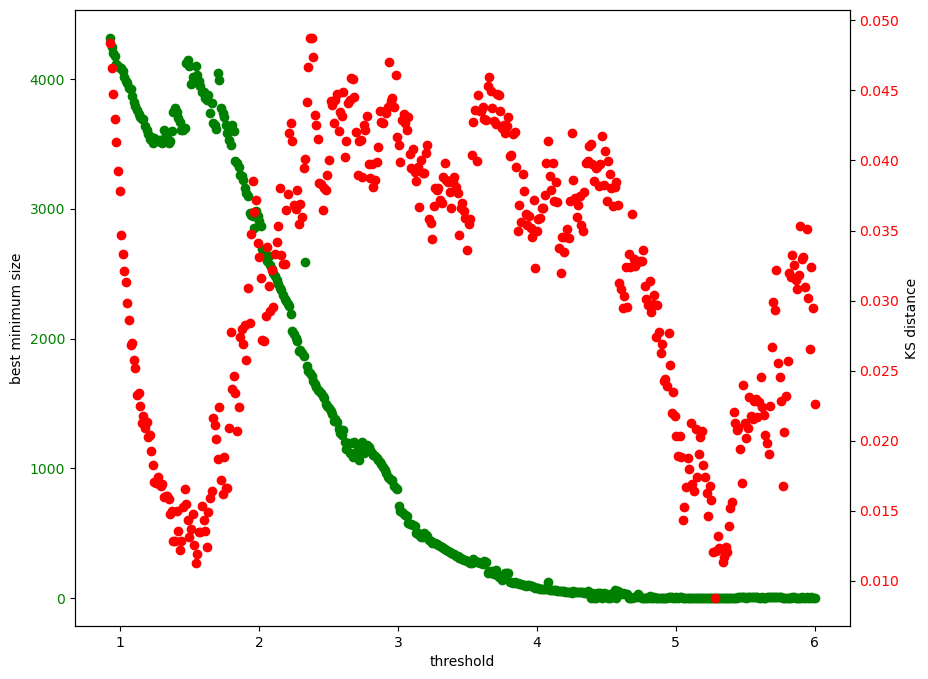

In [140]:
min_index = (2*num_nonzero_thresholds)//7# (5*num_nonzero_thresholds)//6
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
thresholds_np = depytorch(has_avalanches_thresholds[min_index:])
axs.scatter( thresholds_np, depytorch(best_min_size[min_index:]), color='green')
axs.set_ylabel(f'best minimum size')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
ax2 = axs.twinx()
ax2.scatter( thresholds_np, depytorch(best_ks_dist[min_index:]), color='red')
ax2.set_ylabel(f'KS distance')
ax2.tick_params(axis='y', labelcolor='red')
plt.show()

In [335]:
# For each threshold, find the min_size at which the exponent changes the least when we go to the next size.
ks_dist_is_valid = torch.logical_not( torch.isnan(ks_dist) )
best_pl_exp = torch.zeros_like(best_ks_dist)
best_pl_norm = torch.zeros_like(best_ks_dist)
best_pl_exp_diff = torch.zeros_like(best_ks_dist)
best_indices = torch.zeros( size=best_ks_dist.size(), dtype=int_type, device=best_ks_dist.device )
for threshold_index in range(num_nonzero_thresholds):
    is_valid_for_threshold = ks_dist_is_valid[threshold_index,:]
    valid_min_sizes = nonzero_sizes[is_valid_for_threshold]
    valid_ks_dists = (ks_dist[threshold_index,:])[is_valid_for_threshold]
    valid_pl_exps = (stored_pl_exp[threshold_index,:])[is_valid_for_threshold]
    valid_pl_norms = (stored_pl_norm[threshold_index,:])[is_valid_for_threshold]
    pl_norm_diff = valid_pl_norms.diff().abs()
    best_index = torch.argmin(pl_norm_diff)
    best_pl_exp_diff[threshold_index] = pl_norm_diff[best_index]
    best_min_size[threshold_index] = valid_min_sizes[best_index]
    best_ks_dist[threshold_index] = valid_ks_dists[best_index]
    best_pl_exp[threshold_index] = valid_pl_exps[best_index]
    best_pl_norm[threshold_index] = valid_pl_norms[best_index]

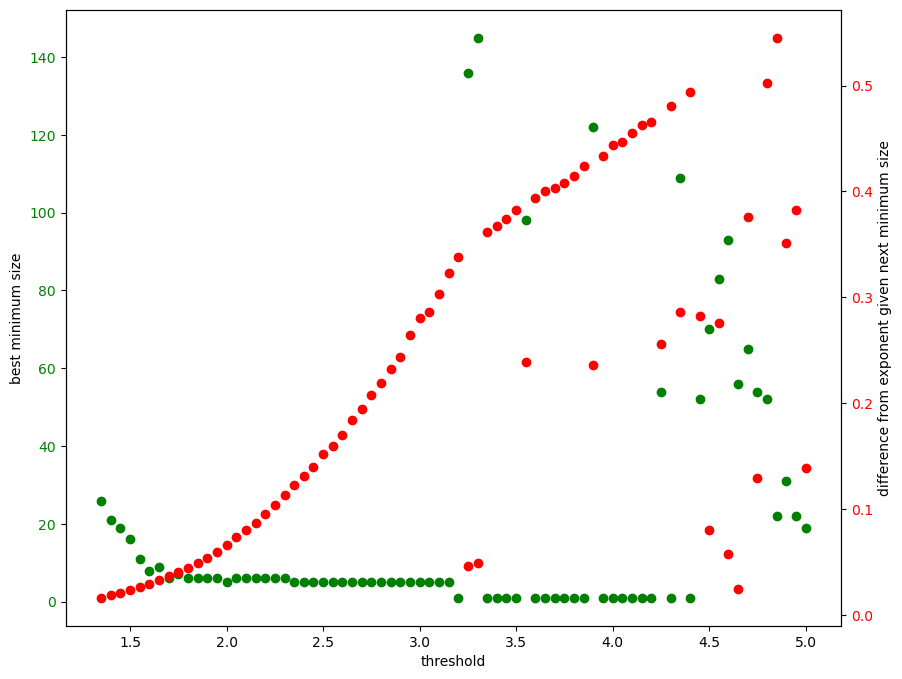

In [345]:
min_index = (2*num_nonzero_thresholds)//5# (5*num_nonzero_thresholds)//6
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
thresholds_np = depytorch(has_avalanches_thresholds[min_index:])
axs.scatter( thresholds_np, depytorch(best_min_size[min_index:]), color='green')
axs.set_ylabel(f'best minimum size')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
ax2 = axs.twinx()
ax2.scatter( thresholds_np, depytorch(best_pl_exp_diff[min_index:]), color='red')
ax2.set_ylabel(f'difference from exponent given next minimum size')
ax2.tick_params(axis='y', labelcolor='red')
plt.show()

In [152]:
try_min_index = 230
try_max_index = 233
print( best_ks_dist[try_min_index:try_max_index] )
print( has_avalanches_thresholds[try_min_index:try_max_index] )

tensor([0.0125, 0.0113, 0.0119], device='cuda:0')
tensor([1.5314, 1.5429, 1.5543], device='cuda:0')


min size index 6 min size 7 max size index 1987 max size 1988
min size index 4 min size 5 max size index 1630 max size 1631
min size index 6 min size 7 max size index 1371 max size 1372


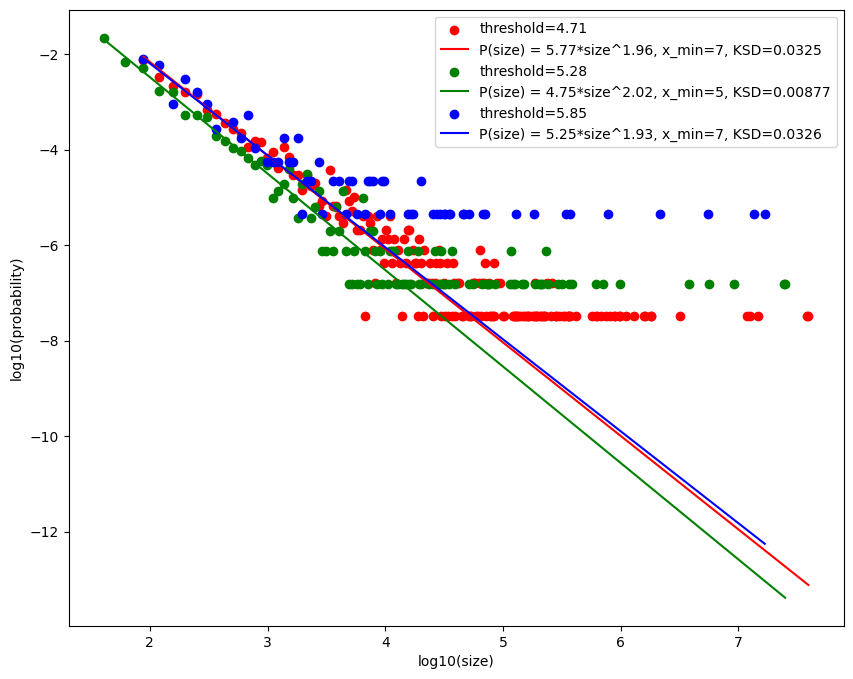

In [174]:
min_ksd_index = best_ks_dist.argmin()
max_index = best_ks_dist.numel()-1
# min_ksd_index = 244
index_offset = 50# 7
indices_to_plot = [min_ksd_index-index_offset, min_ksd_index, min_ksd_index+index_offset]
# indices_to_plot = [min_ksd_index-(max_index-min_ksd_index), min_ksd_index, max_index]
plot_colors = ['red', 'green', 'blue']
num_to_plot = len(indices_to_plot)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
log_nonzero_sizes_np = depytorch( nonzero_sizes.log10() )
for plot_index in range(num_to_plot):
    threshold_index = indices_to_plot[plot_index]
    threshold = has_avalanches_thresholds[threshold_index]
    min_size_for_thresh = best_min_size[threshold_index]
    min_size_index_for_thresh = torch.nonzero(nonzero_sizes == min_size_for_thresh).squeeze()
    max_size_index_for_thresh = torch.nonzero(avalanche_size_counts_nonzero[threshold_index,:] > 0).squeeze()[-1]
    max_size_for_thresh = nonzero_sizes[max_size_index_for_thresh]
    print( 'min size index', min_size_index_for_thresh.item(), 'min size', min_size_for_thresh.item(), 'max size index', max_size_index_for_thresh.item(), 'max size', max_size_for_thresh.item() )
    plexp_for_thresh = best_pl_exp[threshold_index]
    norm_factor_for_thresh = best_pl_norm[threshold_index]
    ksd_for_thresh = best_ks_dist[threshold_index]
    plot_color = plot_colors[plot_index]
    
    selected_sizes = nonzero_sizes[min_size_index_for_thresh:(max_size_index_for_thresh+1)]
    selected_counts = avalanche_size_counts_nonzero[threshold_index,min_size_index_for_thresh:(max_size_index_for_thresh+1)]
    total_selected = selected_counts.sum()
    selected_probs = selected_counts/total_selected
    pl_probs = norm_factor_for_thresh * torch.pow(selected_sizes, -1*plexp_for_thresh)
    
    log_sizes_np = depytorch( selected_sizes.log() )
    axs.scatter(  log_sizes_np, depytorch( selected_probs.log() ), color=plot_color, label=f'threshold={threshold:.3g}'  )
    axs.plot(  log_sizes_np, depytorch( pl_probs.log() ), color=plot_color, label=f'P(size) = {norm_factor_for_thresh:.3g}*size^{plexp_for_thresh:.3g}, x_min={min_size_for_thresh}, KSD={ksd_for_thresh:.3g}'  )
axs.set_xlabel('log10(size)')
axs.set_ylabel('log10(probability)')
# axs.set_ylim([-7.5, -1.25])
# axs.set_ylim([-10, -4])
# axs.set_ylim([-8, -1])
axs.legend()
plt.show()

In [326]:
print( "selected_sizes size", selected_sizes.size() )
print( "selected_probs size", selected_probs.size() )
print( "pl_probs size", pl_probs.size() )

selected_sizes size torch.Size([1, 44087])
selected_probs size torch.Size([44087])
pl_probs size torch.Size([1, 44087])


3.0742857456207275
2722


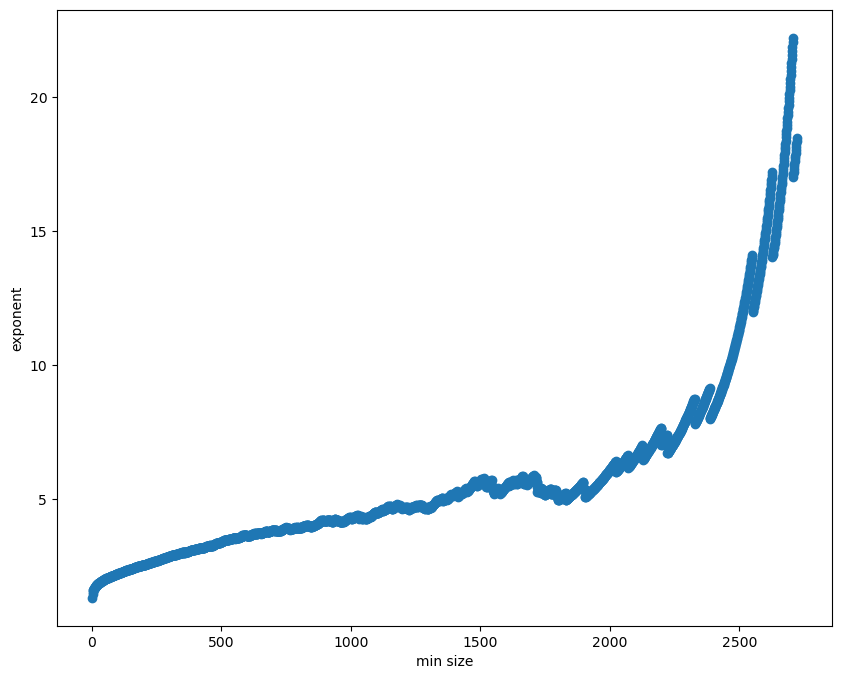

In [194]:
threshold_index = 365# min_ksd_index# 42# min_ksd_index
print( has_avalanches_thresholds[threshold_index].item() )
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
max_index = ( 35*nonzero_sizes.numel() )//1000
print( max_index )
axs.scatter(  depytorch(nonzero_sizes[:max_index]), depytorch(stored_pl_exp[threshold_index,:max_index])  )
axs.set_xlabel('min size')
axs.set_ylabel('exponent')
plt.show()

Text(0, 0.5, 'log10(probability)')

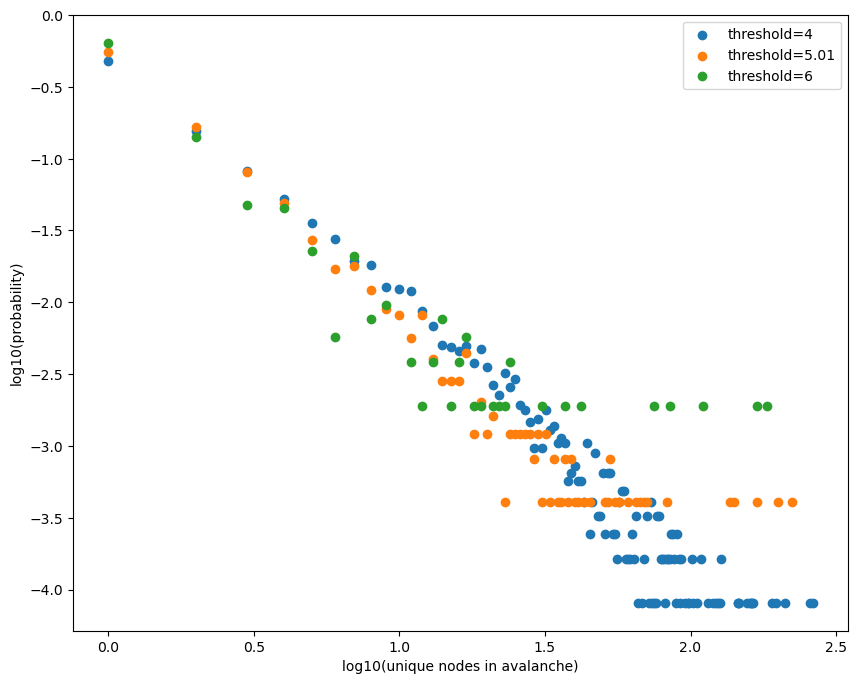

In [131]:
# selected_threshold_indices = [0, 10, 20, 30, 41, 50, 60, 70, 80]
# selected_threshold_indices = [10, 15, 20, 25, 30]
# selected_threshold_indices = [35, 40, 45, 50, 55]
# selected_threshold_indices = [60, 65, 70, 75, 80]
# selected_threshold_indices = [175, 219, 263]
# selected_threshold_indices = [306, 361, 438]
# selected_threshold_indices = [175, 219, 263, 306, 330, 350, 394, 438, 481, 525, 613, 700]
# selected_threshold_indices = [175, 219, 263, 296, 306]
# selected_threshold_indices = [306, 330, 350, 394, 438, 481]
# selected_threshold_indices = [306, 350, 394, 438, 481]
selected_threshold_indices = [525, 613, 700]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
max_nodes = avalanche_unique_nodes_counts.size(dim=-1)
all_num_nodes = all_num_nodes[:max_nodes]
for threshold_index in selected_threshold_indices:
    threshold = all_thresholds[threshold_index]
    counts_for_threshold = avalanche_unique_nodes_counts[threshold_index,:]
    count_is_nonzero = counts_for_threshold != 0
    x_for_threshold = all_num_nodes[count_is_nonzero].log10()
    counts_for_threshold = counts_for_threshold[count_is_nonzero]
    probs = ( counts_for_threshold/counts_for_threshold.sum() ).log10()
    axs.scatter( depytorch(x_for_threshold), depytorch(probs), label=f'threshold={threshold:.3g}')
axs.legend()
axs.set_xlabel('log10(unique nodes in avalanche)')
axs.set_ylabel('log10(probability)')

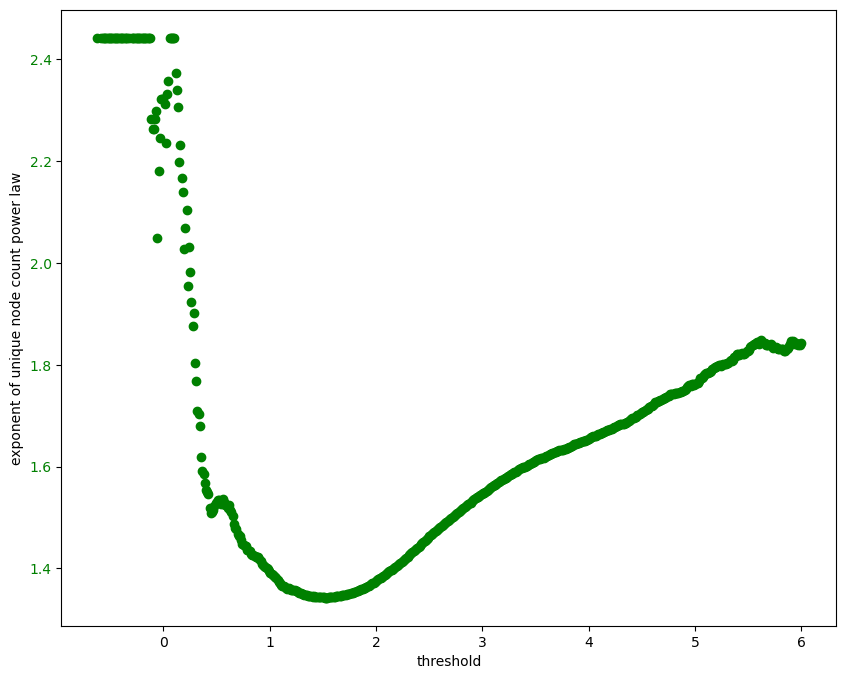

In [132]:
pl_num_nodes_start = 1
pl_num_nodes_end = 101# 361
min_minus_half = all_num_nodes[pl_num_nodes_start] - 0.5
nn_pl_exponent_approx_discrete = 1 + torch.sum(avalanche_unique_nodes_counts[:,pl_num_nodes_start:pl_num_nodes_end], dim=-1)/torch.sum( avalanche_unique_nodes_counts[:,pl_num_nodes_start:pl_num_nodes_end] * torch.log(all_num_nodes[pl_num_nodes_start:pl_num_nodes_end]/min_minus_half).unsqueeze(dim=0), dim=-1 )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(nn_pl_exponent_approx_discrete[min_index:]), color='green')
axs.set_ylabel(f'exponent of unique node count power law')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

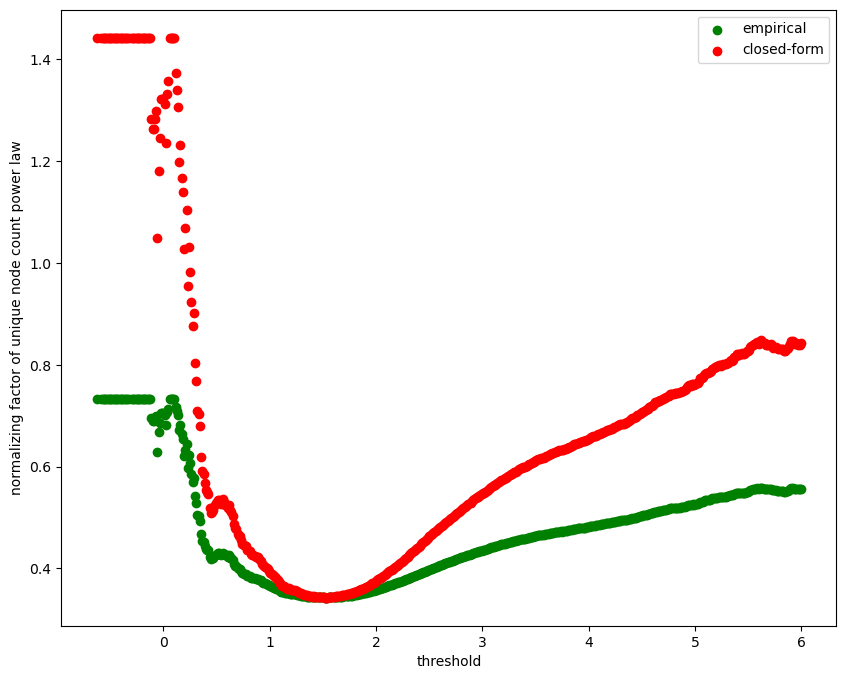

In [133]:
alpha_minus_1 = nn_pl_exponent_approx_discrete - 1
nn_normalizing_factor = alpha_minus_1 * torch.pow( all_num_nodes[pl_num_nodes_start], alpha_minus_1 )
# more_sizes = torch.arange(start=min_pl_index, end=min_pl_index+1000000, dtype=float_type, device=device)
nn_empirical_normalizing_factor = 1/torch.sum(  torch.pow( all_num_nodes[pl_num_nodes_start:pl_num_nodes_end,None], -1*nn_pl_exponent_approx_discrete[None,:] ), dim=0  )
# empirical_normalizing_factor = 1/torch.sum(  torch.pow( more_sizes[:,None], -1*pl_exponent_approx_discrete[None,:] ), dim=0  )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(nn_empirical_normalizing_factor[min_index:]), color='green', label='empirical')
axs.scatter( all_thresholds_np, depytorch(nn_normalizing_factor[min_index:]), color='red', label='closed-form')
axs.set_ylabel(f'normalizing factor of unique node count power law')
# axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
axs.legend()
plt.show()

avalanche_node_counts_selected size torch.Size([576, 100]) nans 0 infs 0
normalizing_factor_selected size torch.Size([576]) nans 0 infs 0
pl_exponent_selected size torch.Size([576]) nans 0 infs 0
avalanche_node_count_probs size torch.Size([576, 100]) nans 0 infs 0
avalanche_node_count_cdf size torch.Size([576, 100]) nans 0 infs 0
power_law_node_count_probs size torch.Size([576, 100]) nans 0 infs 0
power_law_node_count_cdf size torch.Size([576, 100]) nans 0 infs 0
cdf_diff size torch.Size([576, 100]) nans 0 infs 0
nn_ks_distance size torch.Size([576]) nans 0 infs 0


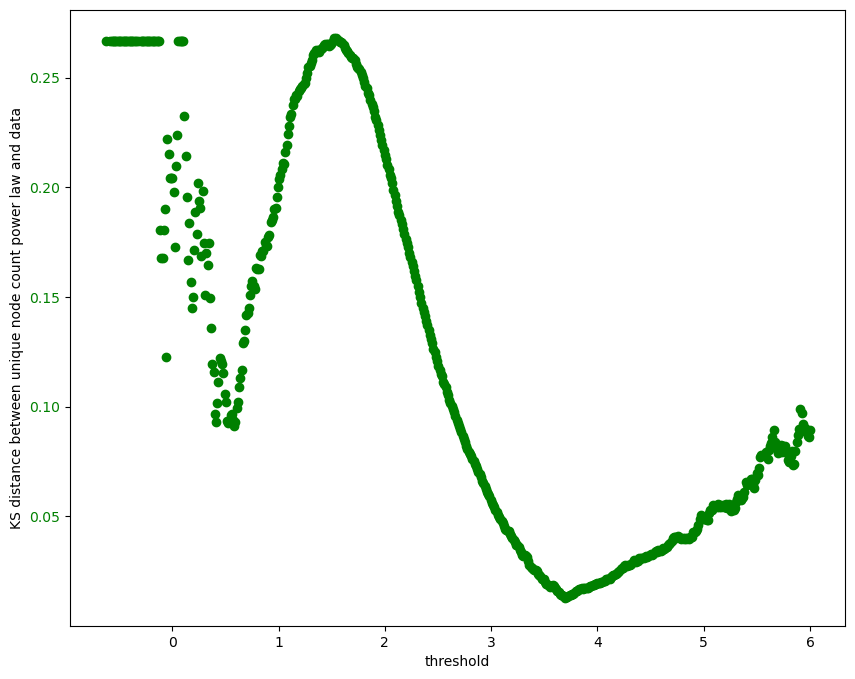

In [134]:
num_avalanches = torch.sum(avalanche_unique_nodes_counts[:,pl_num_nodes_start:pl_num_nodes_end], dim=-1, keepdim=True)
nonzero_num_nodes = all_num_nodes[pl_num_nodes_start:pl_num_nodes_end]
has_avalanches = (num_avalanches > 0).squeeze()
selected_thresholds = all_thresholds[has_avalanches]
avalanche_node_counts_selected = avalanche_unique_nodes_counts[has_avalanches,pl_num_nodes_start:pl_num_nodes_end]
print(  'avalanche_node_counts_selected size', avalanche_node_counts_selected.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_node_counts_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_node_counts_selected) ).item()  )
num_avalanches_selected = num_avalanches[has_avalanches,:]
normalizing_factor_selected = nn_empirical_normalizing_factor[has_avalanches]
print(  'normalizing_factor_selected size', normalizing_factor_selected.size(), 'nans', torch.count_nonzero( torch.isnan(normalizing_factor_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(normalizing_factor_selected) ).item()  )
pl_exponent_selected = nn_pl_exponent_approx_discrete[has_avalanches]
print(  'pl_exponent_selected size', pl_exponent_selected.size(), 'nans', torch.count_nonzero( torch.isnan(pl_exponent_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(pl_exponent_selected) ).item()  )
avalanche_node_count_probs = avalanche_node_counts_selected/num_avalanches_selected
print(  'avalanche_node_count_probs size', avalanche_node_count_probs.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_node_count_probs) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_node_count_probs) ).item()  )
avalanche_node_count_cdf = torch.cumsum(avalanche_node_count_probs, dim=-1)
print(  'avalanche_node_count_cdf size', avalanche_node_count_cdf.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_node_count_cdf) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_node_count_cdf) ).item()  )
power_law_node_count_probs = normalizing_factor_selected.unsqueeze(dim=-1) * torch.pow( nonzero_num_nodes.unsqueeze(dim=0), -1*pl_exponent_selected.unsqueeze(dim=-1) )
# power_law_size_probs[:,:min_index] = 0
print(  'power_law_node_count_probs size', power_law_node_count_probs.size(), 'nans', torch.count_nonzero( torch.isnan(power_law_node_count_probs) ).item(), 'infs', torch.count_nonzero( torch.isinf(power_law_node_count_probs) ).item()  )
power_law_node_count_cdf = torch.cumsum(power_law_node_count_probs, dim=-1)
print(  'power_law_node_count_cdf size', power_law_node_count_cdf.size(), 'nans', torch.count_nonzero( torch.isnan(power_law_node_count_cdf) ).item(), 'infs', torch.count_nonzero( torch.isinf(power_law_node_count_cdf) ).item()  )
cdf_diff = torch.abs(avalanche_node_count_cdf - power_law_node_count_cdf)
print(  'cdf_diff size', cdf_diff.size(), 'nans', torch.count_nonzero( torch.isnan(cdf_diff) ).item(), 'infs', torch.count_nonzero( torch.isinf(cdf_diff) ).item()  )
nn_ks_distance = torch.max(cdf_diff, dim=-1).values
print(  'nn_ks_distance size', nn_ks_distance.size(), 'nans', torch.count_nonzero( torch.isnan(nn_ks_distance) ).item(), 'infs', torch.count_nonzero( torch.isinf(nn_ks_distance) ).item()  )
min_index = 0
max_index = selected_thresholds.numel()
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
selected_thresholds_np = depytorch(selected_thresholds[min_index:max_index])
axs.scatter( selected_thresholds_np, depytorch(nn_ks_distance[min_index:max_index]), color='green')
axs.set_ylabel(f'KS distance between unique node count power law and data')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

In [135]:
nn_min_ksd_index = nn_ks_distance.argmin()
nn_min_ksd_threshold = selected_thresholds[nn_min_ksd_index]
nn_min_ksd = nn_ks_distance[nn_min_ksd_index]
print(f'Threshold {nn_min_ksd_threshold:.3g} has the lowest KS distance, {nn_min_ksd:.3g}, and power law P(num nodes) = {normalizing_factor_selected[nn_min_ksd_index]:.3g}*size^{-1*pl_exponent_selected[nn_min_ksd_index]:.3g}.')

Threshold 3.69 has the lowest KS distance, 0.0129, and power law P(num nodes) = 0.471*size^-1.63.


In [147]:
# Try everything again but optimizing x_min for each threshold to minimize KS distance.
any_has_size = (avalanche_unique_nodes_counts > 0).any(dim=0)
print(f'{torch.count_nonzero(any_has_size)} of {any_has_size.numel()} sizes actually occur for some threshold.')
nonzero_node_counts = all_num_nodes[any_has_size]
num_nonzero_node_counts = nonzero_node_counts.numel()
num_avalanches = avalanche_unique_nodes_counts.sum(dim=-1, keepdim=True)
has_avalanches = (num_avalanches > 0).squeeze()
print(f'{torch.count_nonzero(has_avalanches)} of {has_avalanches.numel()} thresholds allow at least one avalanche to exist.')
# print( 'all_thresholds size', all_thresholds.size() )
has_avalanches_thresholds = all_thresholds[has_avalanches]
# print( 'has_avalanches_thresholds size', has_avalanches_thresholds.size() )
num_nonzero_thresholds = has_avalanches_thresholds.numel()
# print( 'num_nonzero_thresholds', num_nonzero_thresholds )
avalanche_node_counts_nonzero = (avalanche_unique_nodes_counts[has_avalanches,:])[:,any_has_size]
# print( 'avalanche_size_counts_nonzero size', avalanche_size_counts_nonzero.size() )
ks_dist = torch.zeros( size=(num_nonzero_thresholds, num_nonzero_node_counts), dtype=float_type, device=device )
# print( 'ks_dist size', ks_dist.size() )
stored_pl_exp = torch.zeros_like(ks_dist)
# print( 'stored_pl_exp size', stored_pl_exp.size() )
stored_pl_norm = torch.zeros_like(ks_dist)
max_node_count_index = nonzero_node_counts.numel()
max_node_count = nonzero_node_counts[max_node_count_index-1]
for min_node_count_index in range(num_nonzero_node_counts):
    min_node_count = nonzero_node_counts[min_node_count_index]
    selected_node_counts = nonzero_node_counts[min_node_count_index:max_node_count_index].unsqueeze(dim=0)
    # print( 'selected_node_counts', selected_node_counts.size() )
    selected_counts = avalanche_node_counts_nonzero[:,min_node_count_index:max_node_count_index]
    total_selected = selected_counts.sum(dim=-1, keepdim=True)
    selected_probs = selected_counts/total_selected
    # print( 'selected_probs', selected_probs.size() )
    pl_exp_minus_1 = total_selected/torch.sum( selected_counts*torch.log( selected_node_counts/(min_node_count-0.5) ), dim=-1, keepdim=True )
    pl_exp = 1 + pl_exp_minus_1
    # print( 'pl_exp', pl_exp.size() )
    # pl_norm = pl_exp_minus_1 * torch.pow(min_size, pl_exp_minus_1)
    # pl_probs = pl_norm * torch.pow(selected_sizes, -1*pl_exp)
    pl_probs = torch.pow(selected_node_counts, -1*pl_exp)
    # print( 'pl_probs', pl_probs.size() )
    pl_norm = 1/torch.sum(pl_probs, dim=-1, keepdim=True)
    # print( 'pl_norm', pl_norm.size() )
    pl_probs *= pl_norm
    selected_cdf = torch.cumsum(selected_probs,dim=-1)
    pl_cdf = torch.cumsum(pl_probs, dim=-1)
    # print( 'pl_cdf size', pl_cdf.size() )
    ks_dist[:,min_node_count_index] = torch.max( torch.abs(selected_cdf-pl_cdf), dim=-1 ).values
    stored_pl_exp[:,min_node_count_index] = pl_exp.squeeze()
    stored_pl_norm[:,min_node_count_index] = pl_norm.squeeze()
# Choose the best min_size for each threshold.
best_ks_dist, best_ks_dist_index = torch.min(ks_dist, dim=-1)
best_min_node_count = nonzero_node_counts[best_ks_dist_index]

360 of 361 sizes actually occur for some threshold.
622 of 701 thresholds allow at least one avalanche to exist.


In [148]:
# For each threshold, find the min_duration that produces the lowest ks_dist.
ks_dist_is_valid = torch.logical_not( torch.isnan(ks_dist) )
best_pl_exp = torch.zeros_like(best_ks_dist)
best_pl_norm = torch.zeros_like(best_ks_dist)
best_indices = torch.zeros( size=best_ks_dist.size(), dtype=int_type, device=best_ks_dist.device )
for threshold_index in range(num_nonzero_thresholds):
    is_valid_for_threshold = ks_dist_is_valid[threshold_index,:]
    valid_min_node_counts = nonzero_node_counts[is_valid_for_threshold]
    valid_ks_dists = (ks_dist[threshold_index,:])[is_valid_for_threshold]
    valid_pl_exps = (stored_pl_exp[threshold_index,:])[is_valid_for_threshold]
    valid_pl_norms = (stored_pl_norm[threshold_index,:])[is_valid_for_threshold]
    best_index = torch.argmin(valid_ks_dists)
    best_min_node_count[threshold_index] = valid_min_node_counts[best_index]
    best_ks_dist[threshold_index] = valid_ks_dists[best_index]
    best_pl_exp[threshold_index] = valid_pl_exps[best_index]
    best_pl_norm[threshold_index] = valid_pl_norms[best_index]

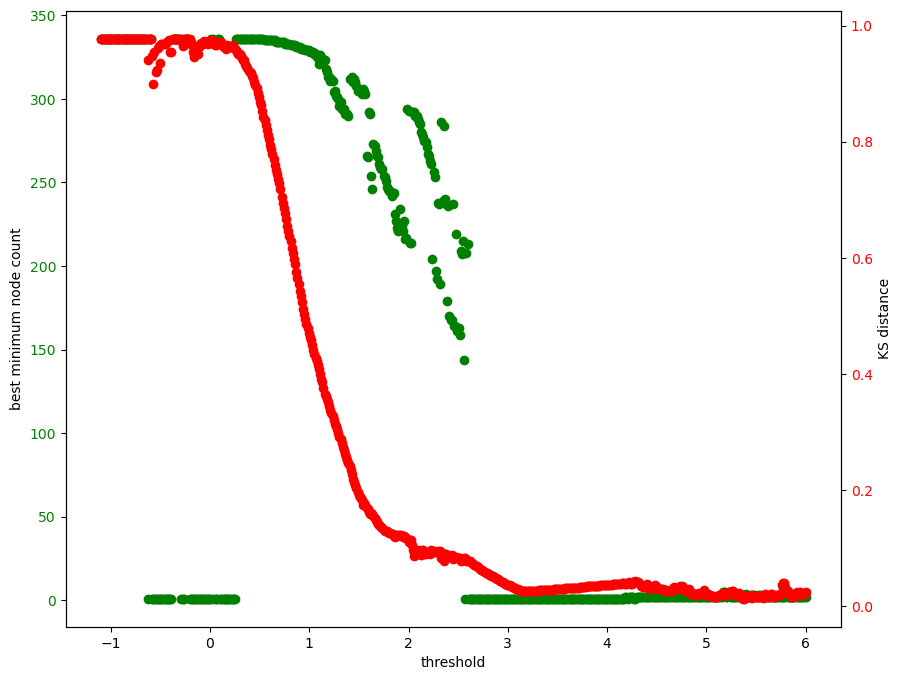

In [150]:
min_index = 0# (2*num_nonzero_thresholds)//7# (5*num_nonzero_thresholds)//6
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
thresholds_np = depytorch(has_avalanches_thresholds[min_index:])
axs.scatter( thresholds_np, depytorch(best_min_node_count[min_index:]), color='green')
axs.set_ylabel(f'best minimum node count')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
ax2 = axs.twinx()
ax2.scatter( thresholds_np, depytorch(best_ks_dist[min_index:]), color='red')
ax2.set_ylabel(f'KS distance')
ax2.tick_params(axis='y', labelcolor='red')
plt.show()

In [130]:
print( best_max_node_count[0:10] )
print( best_ks_dist[0:10] )

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0', dtype=torch.int32)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0')


Text(0, 0.5, 'log10(probability)')

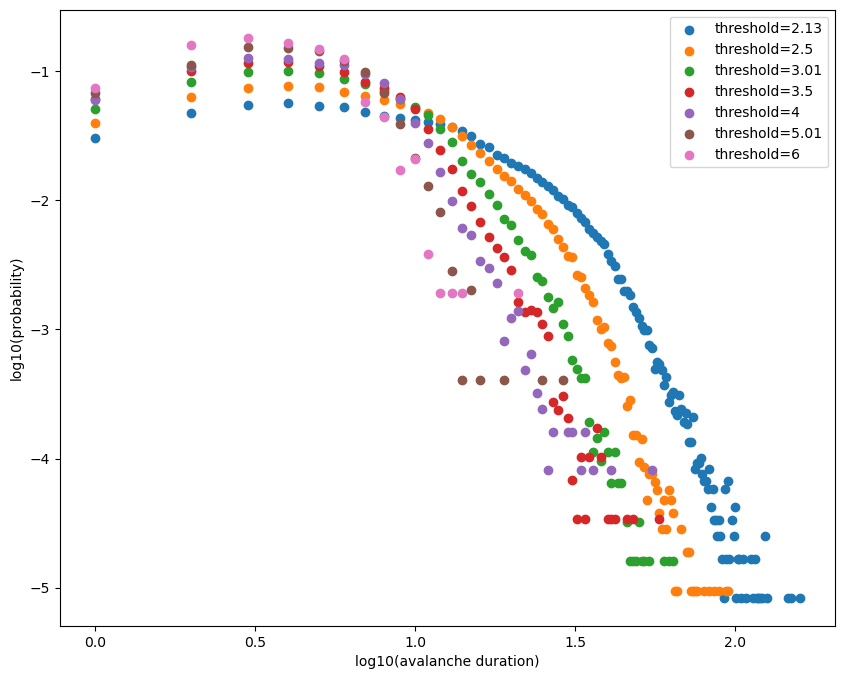

In [151]:
# selected_threshold_indices = [0, 10, 20, 30, 41, 50, 60, 70, 80]
# selected_threshold_indices = [10, 15, 20, 25, 30]
# selected_threshold_indices = [35, 40, 45, 50, 55]
# selected_threshold_indices = [60, 65, 70, 75, 80]

# selected_threshold_indices = [0, 175, 361, 700]
# selected_threshold_indices = [175, 219, 263, 306, 361]
selected_threshold_indices = [361, 394, 438, 481, 525, 613, 700]
# selected_threshold_indices = [306, 361, 438]
# selected_threshold_indices = [175, 219, 263, 306, 330, 350, 394, 438, 481, 525, 613, 700]
# selected_threshold_indices = [175, 219, 263, 296, 306]
# selected_threshold_indices = [306, 330, 350, 394, 438, 481]
# selected_threshold_indices = [306, 350, 394, 438, 481]
# selected_threshold_indices = [525, 613, 700]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
max_nodes = avalanche_duration_counts.size(dim=-1)
all_num_nodes = all_num_nodes[:max_nodes]
for threshold_index in selected_threshold_indices:
    threshold = all_thresholds[threshold_index]
    counts_for_threshold = avalanche_duration_counts[threshold_index,:]
    count_is_nonzero = counts_for_threshold != 0
    x_for_threshold = all_durations[count_is_nonzero].log10()
    counts_for_threshold = counts_for_threshold[count_is_nonzero]
    probs = ( counts_for_threshold/counts_for_threshold.sum() ).log10()
    axs.scatter( depytorch(x_for_threshold), depytorch(probs), label=f'threshold={threshold:.3g}')
axs.legend()
axs.set_xlabel('log10(avalanche duration)')
axs.set_ylabel('log10(probability)')

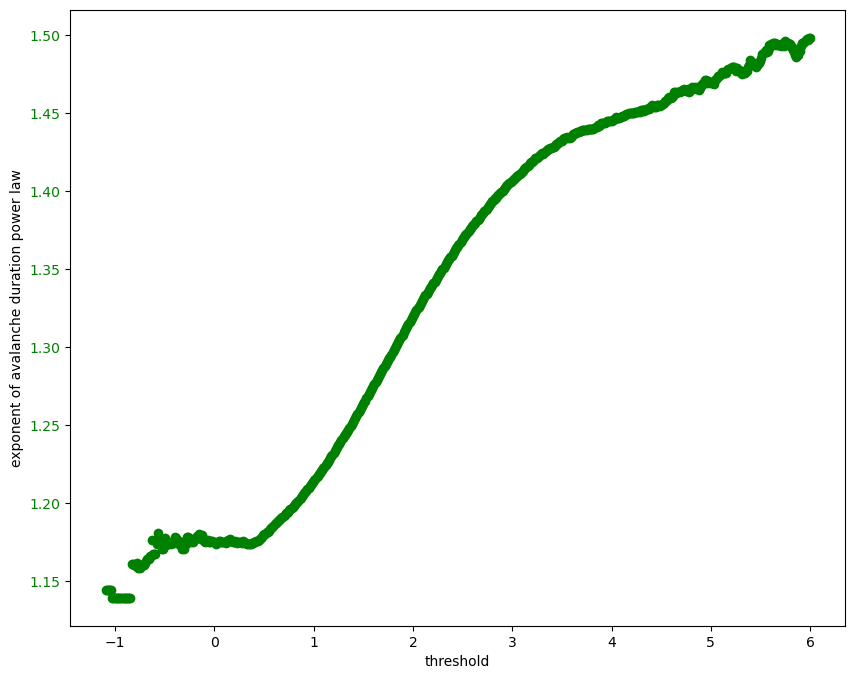

In [152]:
pl_durations_start = 1
pl_durations_end = 1201
min_minus_half = all_durations[pl_num_nodes_start] - 0.5
ad_pl_exponent_approx_discrete = 1 + torch.sum(avalanche_duration_counts[:,pl_durations_start:pl_durations_end], dim=-1)/torch.sum( avalanche_duration_counts[:,pl_durations_start:pl_durations_end] * torch.log(all_durations[pl_durations_start:pl_durations_end]/min_minus_half).unsqueeze(dim=0), dim=-1 )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(ad_pl_exponent_approx_discrete[min_index:]), color='green')
axs.set_ylabel(f'exponent of avalanche duration power law')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

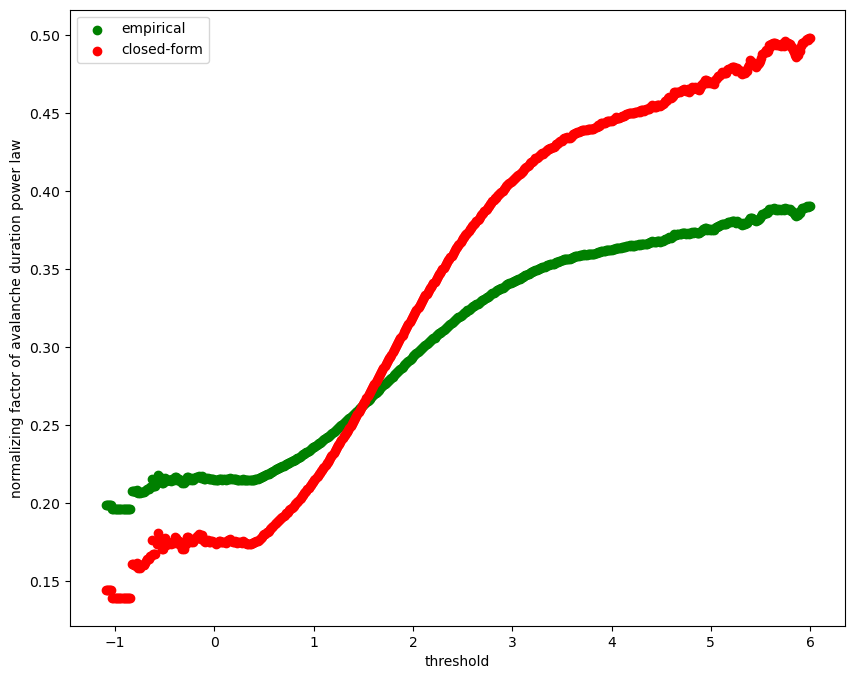

In [153]:
alpha_minus_1 = ad_pl_exponent_approx_discrete - 1
ad_normalizing_factor = alpha_minus_1 * torch.pow( all_durations[pl_durations_start], alpha_minus_1 )
# more_sizes = torch.arange(start=min_pl_index, end=min_pl_index+1000000, dtype=float_type, device=device)
ad_empirical_normalizing_factor = 1/torch.sum(  torch.pow( all_durations[pl_durations_start:pl_durations_end,None], -1*ad_pl_exponent_approx_discrete[None,:] ), dim=0  )
# empirical_normalizing_factor = 1/torch.sum(  torch.pow( more_sizes[:,None], -1*pl_exponent_approx_discrete[None,:] ), dim=0  )
min_index = 0
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
all_thresholds_np = depytorch(all_thresholds[min_index:])
axs.scatter( all_thresholds_np, depytorch(ad_empirical_normalizing_factor[min_index:]), color='green', label='empirical')
axs.scatter( all_thresholds_np, depytorch(ad_normalizing_factor[min_index:]), color='red', label='closed-form')
axs.set_ylabel(f'normalizing factor of avalanche duration power law')
# axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
axs.legend()
plt.show()

avalanche_durations_selected size torch.Size([622, 1200]) nans 0 infs 0
normalizing_factor_selected size torch.Size([622]) nans 0 infs 0
pl_exponent_selected size torch.Size([622]) nans 0 infs 0
avalanche_duration_probs size torch.Size([622, 1200]) nans 0 infs 0
avalanche_duration_cdf size torch.Size([622, 1200]) nans 0 infs 0
power_law_duration_probs size torch.Size([622, 1200]) nans 0 infs 0
power_law_duration_cdf size torch.Size([622, 1200]) nans 0 infs 0
cdf_diff size torch.Size([622, 1200]) nans 0 infs 0
ad_ks_distance size torch.Size([622]) nans 0 infs 0


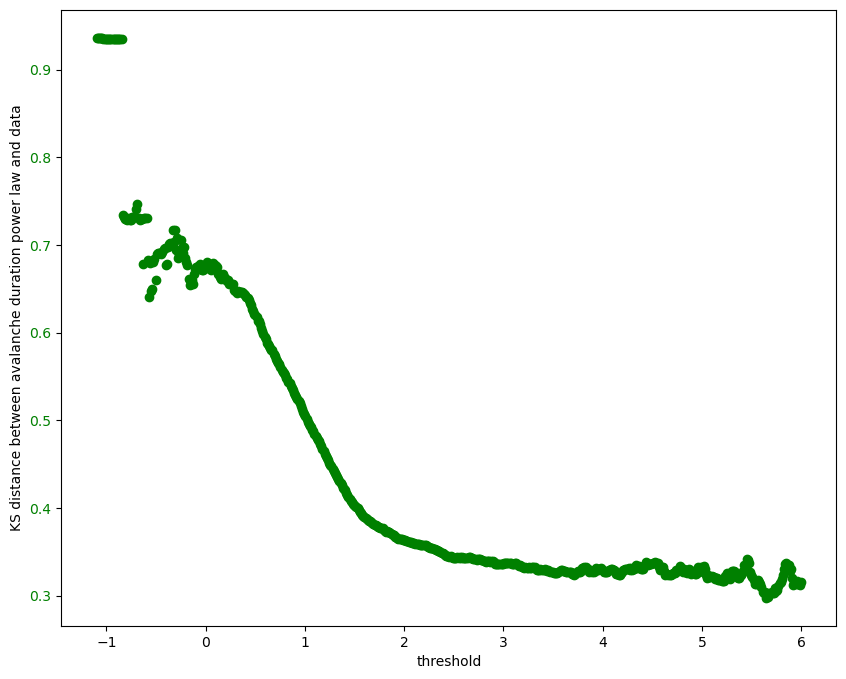

In [154]:
num_avalanches = torch.sum(avalanche_duration_counts[:,pl_durations_start:pl_durations_end], dim=-1, keepdim=True)
nonzero_durations = all_durations[pl_durations_start:pl_durations_end]
has_avalanches = (num_avalanches > 0).squeeze()
selected_thresholds = all_thresholds[has_avalanches]
avalanche_durations_selected = avalanche_duration_counts[has_avalanches,pl_durations_start:pl_durations_end]
print(  'avalanche_durations_selected size', avalanche_durations_selected.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_durations_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_durations_selected) ).item()  )
num_avalanches_selected = num_avalanches[has_avalanches,:]
normalizing_factor_selected = ad_empirical_normalizing_factor[has_avalanches]
print(  'normalizing_factor_selected size', normalizing_factor_selected.size(), 'nans', torch.count_nonzero( torch.isnan(normalizing_factor_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(normalizing_factor_selected) ).item()  )
pl_exponent_selected = ad_pl_exponent_approx_discrete[has_avalanches]
print(  'pl_exponent_selected size', pl_exponent_selected.size(), 'nans', torch.count_nonzero( torch.isnan(pl_exponent_selected) ).item(), 'infs', torch.count_nonzero( torch.isinf(pl_exponent_selected) ).item()  )
avalanche_duration_probs = avalanche_durations_selected/num_avalanches_selected
print(  'avalanche_duration_probs size', avalanche_duration_probs.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_duration_probs) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_duration_probs) ).item()  )
avalanche_duration_cdf = torch.cumsum(avalanche_duration_probs, dim=-1)
print(  'avalanche_duration_cdf size', avalanche_duration_cdf.size(), 'nans', torch.count_nonzero( torch.isnan(avalanche_duration_cdf) ).item(), 'infs', torch.count_nonzero( torch.isinf(avalanche_duration_cdf) ).item()  )
power_law_duration_probs = normalizing_factor_selected.unsqueeze(dim=-1) * torch.pow( nonzero_durations.unsqueeze(dim=0), -1*pl_exponent_selected.unsqueeze(dim=-1) )
# power_law_size_probs[:,:min_index] = 0
print(  'power_law_duration_probs size', power_law_duration_probs.size(), 'nans', torch.count_nonzero( torch.isnan(power_law_duration_probs) ).item(), 'infs', torch.count_nonzero( torch.isinf(power_law_duration_probs) ).item()  )
power_law_duration_cdf = torch.cumsum(power_law_duration_probs, dim=-1)
print(  'power_law_duration_cdf size', power_law_duration_cdf.size(), 'nans', torch.count_nonzero( torch.isnan(power_law_duration_cdf) ).item(), 'infs', torch.count_nonzero( torch.isinf(power_law_duration_cdf) ).item()  )
cdf_diff = torch.abs(avalanche_duration_cdf - power_law_duration_cdf)
print(  'cdf_diff size', cdf_diff.size(), 'nans', torch.count_nonzero( torch.isnan(cdf_diff) ).item(), 'infs', torch.count_nonzero( torch.isinf(cdf_diff) ).item()  )
ad_ks_distance = torch.max(cdf_diff, dim=-1).values
print(  'ad_ks_distance size', ad_ks_distance.size(), 'nans', torch.count_nonzero( torch.isnan(ad_ks_distance) ).item(), 'infs', torch.count_nonzero( torch.isinf(ad_ks_distance) ).item()  )
min_index = 0
max_index = selected_thresholds.numel()
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
selected_thresholds_np = depytorch(selected_thresholds[min_index:max_index])
axs.scatter( selected_thresholds_np, depytorch(ad_ks_distance[min_index:max_index]), color='green')
axs.set_ylabel(f'KS distance between avalanche duration power law and data')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
plt.show()

In [155]:
ad_min_ksd_index = ad_ks_distance.argmin()
ad_min_ksd_threshold = selected_thresholds[ad_min_ksd_index]
ad_min_ksd = ad_ks_distance[ad_min_ksd_index]
print(f'Threshold {ad_min_ksd_threshold:.3g} has the lowest KS distance, {ad_min_ksd:.3g}, and power law P(duration) = {normalizing_factor_selected[ad_min_ksd_index]:.3g}*size^{-1*pl_exponent_selected[ad_min_ksd_index]:.3g}.')

Threshold 5.65 has the lowest KS distance, 0.298, and power law P(duration) = 0.389*size^-1.49.


In [156]:
# Try everything again but optimizing x_min for each threshold to minimize KS distance.
any_has_size = (avalanche_duration_counts > 0).any(dim=0)
print(f'{torch.count_nonzero(any_has_size)} of {any_has_size.numel()} sizes actually occur for some threshold.')
nonzero_durations = all_durations[any_has_size]
num_nonzero_durations = nonzero_durations.numel()
num_avalanches = avalanche_duration_counts.sum(dim=-1, keepdim=True)
has_avalanches = (num_avalanches > 0).squeeze()
print(f'{torch.count_nonzero(has_avalanches)} of {has_avalanches.numel()} thresholds allow at least one avalanche to exist.')
# print( 'all_thresholds size', all_thresholds.size() )
has_avalanches_thresholds = all_thresholds[has_avalanches]
# print( 'has_avalanches_thresholds size', has_avalanches_thresholds.size() )
num_nonzero_thresholds = has_avalanches_thresholds.numel()
# print( 'num_nonzero_thresholds', num_nonzero_thresholds )
avalanche_duration_counts_nonzero = (avalanche_duration_counts[has_avalanches,:])[:,any_has_size]
# print( 'avalanche_size_counts_nonzero size', avalanche_size_counts_nonzero.size() )
ks_dist = torch.zeros( size=(num_nonzero_thresholds, num_nonzero_durations), dtype=float_type, device=device )
# print( 'ks_dist size', ks_dist.size() )
stored_pl_exp = torch.zeros_like(ks_dist)
# print( 'stored_pl_exp size', stored_pl_exp.size() )
stored_pl_norm = torch.zeros_like(ks_dist)
for min_duration_index in range(num_nonzero_durations):
    min_size = nonzero_durations[min_duration_index]
    selected_durations = nonzero_durations[min_duration_index:].unsqueeze(dim=0)
    # print( 'selected_sizes', selected_sizes.size() )
    selected_counts = avalanche_duration_counts_nonzero[:,min_duration_index:]
    total_selected = selected_counts.sum(dim=-1, keepdim=True)
    selected_probs = selected_counts/total_selected
    # print( 'selected_probs', selected_probs.size() )
    pl_exp_minus_1 = total_selected/torch.sum( selected_counts*torch.log( selected_durations/(min_size-0.5) ), dim=-1, keepdim=True )
    pl_exp = 1 + pl_exp_minus_1
    # print( 'pl_exp', pl_exp.size() )
    # pl_norm = pl_exp_minus_1 * torch.pow(min_size, pl_exp_minus_1)
    # pl_probs = pl_norm * torch.pow(selected_sizes, -1*pl_exp)
    pl_probs = torch.pow(selected_durations, -1*pl_exp)
    # print( 'pl_probs', pl_probs.size() )
    pl_norm = 1/torch.sum(pl_probs, dim=-1, keepdim=True)
    # print( 'pl_norm', pl_norm.size() )
    pl_probs *= pl_norm
    selected_cdf = torch.cumsum(selected_probs,dim=-1)
    pl_cdf = torch.cumsum(pl_probs, dim=-1)
    ks_dist[:,min_duration_index] = torch.max( torch.abs(selected_cdf-pl_cdf), dim=-1 ).values
    # print( 'pl_exp size', pl_exp.size() )
    stored_pl_exp[:,min_duration_index] = pl_exp.squeeze()
    stored_pl_norm[:,min_duration_index] = pl_norm.squeeze()
# Choose the best min_size for each threshold.
best_ks_dist, best_ks_dist_index = torch.min(ks_dist, dim=-1)
best_min_duration = nonzero_durations[best_ks_dist_index]

1188 of 1201 sizes actually occur for some threshold.
622 of 701 thresholds allow at least one avalanche to exist.


In [157]:
# For each threshold, find the min_duration that produces the lowest ks_dist.
ks_dist_is_valid = torch.logical_not( torch.isnan(ks_dist) )
best_pl_exp = torch.zeros_like(best_ks_dist)
best_pl_norm = torch.zeros_like(best_ks_dist)
best_indices = torch.zeros( size=best_ks_dist.size(), dtype=int_type, device=best_ks_dist.device )
for threshold_index in range(num_nonzero_thresholds):
    is_valid_for_threshold = ks_dist_is_valid[threshold_index,:]
    valid_min_durations = nonzero_durations[is_valid_for_threshold]
    valid_ks_dists = (ks_dist[threshold_index,:])[is_valid_for_threshold]
    valid_pl_exps = (stored_pl_exp[threshold_index,:])[is_valid_for_threshold]
    valid_pl_norms = (stored_pl_norm[threshold_index,:])[is_valid_for_threshold]
    best_index = torch.argmin(valid_ks_dists)
    best_min_duration[threshold_index] = valid_min_durations[best_index]
    best_ks_dist[threshold_index] = valid_ks_dists[best_index]
    best_pl_exp[threshold_index] = valid_pl_exps[best_index]
    best_pl_norm[threshold_index] = valid_pl_norms[best_index]

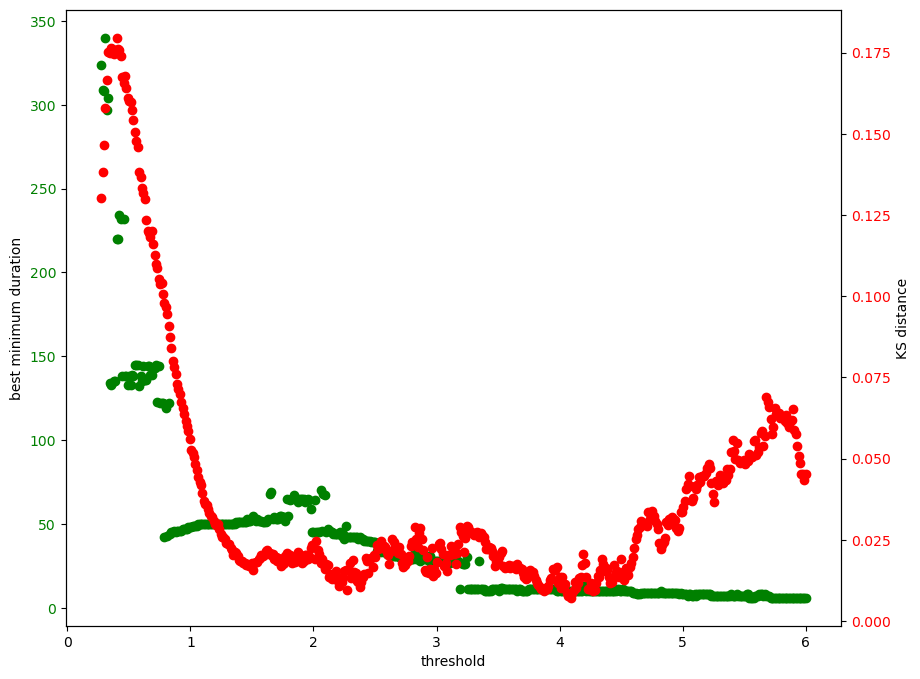

In [161]:
min_index = 120# (2*num_nonzero_thresholds)//7# (5*num_nonzero_thresholds)//6
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(10, 8) )
thresholds_np = depytorch(has_avalanches_thresholds[min_index:])
axs.scatter( thresholds_np, depytorch(best_min_duration[min_index:]), color='green')
axs.set_ylabel(f'best minimum duration')
axs.tick_params(axis='y', labelcolor='green')
axs.set_xlabel('threshold')
ax2 = axs.twinx()
ax2.scatter( thresholds_np, depytorch(best_ks_dist[min_index:]), color='red')
ax2.set_ylabel(f'KS distance')
ax2.tick_params(axis='y', labelcolor='red')
plt.show()

In [194]:
test_alpha = torch.arange(start=1, end=5, dtype=float_type, device=device)
test_x_min = torch.arange(start=1, end=10, dtype=float_type, device=device)
test_zeta = torch.special.zeta( test_alpha.unsqueeze(dim=-1), test_x_min.unsqueeze(dim=0) )
print( test_zeta )
print( -1*test_zeta )
print( test_zeta.min(dim=0).values )

tensor([[       inf,        inf,        inf,        inf,        inf,        inf,
                inf,        inf,        inf],
        [1.6449e+00, 6.4493e-01, 3.9493e-01, 2.8382e-01, 2.2132e-01, 1.8132e-01,
         1.5355e-01, 1.3314e-01, 1.1751e-01],
        [1.2021e+00, 2.0206e-01, 7.7057e-02, 4.0020e-02, 2.4395e-02, 1.6395e-02,
         1.1765e-02, 8.8498e-03, 6.8967e-03],
        [1.0823e+00, 8.2323e-02, 1.9823e-02, 7.4776e-03, 3.5713e-03, 1.9713e-03,
         1.1997e-03, 7.8321e-04, 5.3907e-04]], device='cuda:0')
tensor([[       -inf,        -inf,        -inf,        -inf,        -inf,
                -inf,        -inf,        -inf,        -inf],
        [-1.6449e+00, -6.4493e-01, -3.9493e-01, -2.8382e-01, -2.2132e-01,
         -1.8132e-01, -1.5355e-01, -1.3314e-01, -1.1751e-01],
        [-1.2021e+00, -2.0206e-01, -7.7057e-02, -4.0020e-02, -2.4395e-02,
         -1.6395e-02, -1.1765e-02, -8.8498e-03, -6.8967e-03],
        [-1.0823e+00, -8.2323e-02, -1.9823e-02, -7.4776e-03, -3.57

In [215]:
print( torch.tensor([100], dtype=float_type, device=device) * torch.tensor([10e6], dtype=float_type, device=device) )
exponent = torch.arange(start=0, end=20, dtype=float_type, device=device)
print( 'exponent', exponent )
x_min = torch.pow( 10, torch.arange(start=0, end=10, dtype=float_type, device=device) )
print( 'x_min', x_min )
test_zeta = torch.special.zeta( exponent.unsqueeze(dim=-1), x_min.unsqueeze(dim=0) )
print('zeta[exp_index, x_min_index]')
print(test_zeta)
print('log zeta')
print( test_zeta.log() )
print('is inf?')
print( test_zeta.log().isinf() )
print('is neg?')
print( test_zeta.log() < 0 )

tensor([1.0000e+09], device='cuda:0')
exponent tensor([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
        14., 15., 16., 17., 18., 19.], device='cuda:0')
x_min tensor([1.0000e+00, 1.0000e+01, 1.0000e+02, 1.0000e+03, 1.0000e+04, 1.0000e+05,
        1.0000e+06, 1.0000e+07, 1.0000e+08, 1.0000e+09], device='cuda:0')
zeta[exp_index, x_min_index]
tensor([[       nan,        nan,        nan,        nan,        nan,        nan,
                nan,        nan,        nan,        nan],
        [       inf,        inf,        inf,        inf,        inf,        inf,
                inf,        inf,        inf,        inf],
        [1.6449e+00, 1.0517e-01, 1.0050e-02, 1.0005e-03, 1.0000e-04, 1.0000e-05,
         1.0000e-06, 1.0000e-07, 1.0000e-08, 1.0000e-09],
        [1.2021e+00, 5.5249e-03, 5.0503e-05, 5.0050e-07, 5.0005e-09, 5.0001e-11,
         5.0000e-13, 5.0000e-15, 5.0000e-17, 5.0000e-19],
        [1.0823e+00, 3.8665e-04, 3.3837e-07, 3.3383e-10, 3.3338e-13, 3.333

In [55]:
min_threshold = 0
max_threshold = 3
min_beta = 1e-10
max_beta = 0.05
multi_threshold_model_param_string = f'light_group_thresholds_31_min_{min_threshold:.3g}_max_{max_threshold:.3g}_betas_101_min_{min_beta:.3g}_max_{max_beta:.3g}_steps_1200_lr_0.01_beta_updates_8_test_beta_min_1e-09_max_1_sim_steps_120000'
fc_corr_file = os.path.join(file_dir, f'fc_corr_{multi_threshold_model_param_string}.pt')
fc_corr = torch.load(f=fc_corr_file)
num_betas, num_thresholds = fc_corr.size()
print( num_betas, num_thresholds )
# beta = torch.linspace(start=min_beta, end=max_beta, steps=num_betas, dtype=fc_corr.dtype, device=fc_corr.device)
beta = torch.linspace(start=1e-10, end=1.0, steps=num_betas, dtype=fc_corr.dtype, device=fc_corr.device)
threshold = torch.linspace(start=min_threshold, end=max_threshold, steps=num_thresholds, dtype=fc_corr.dtype, device=fc_corr.device)

101 31


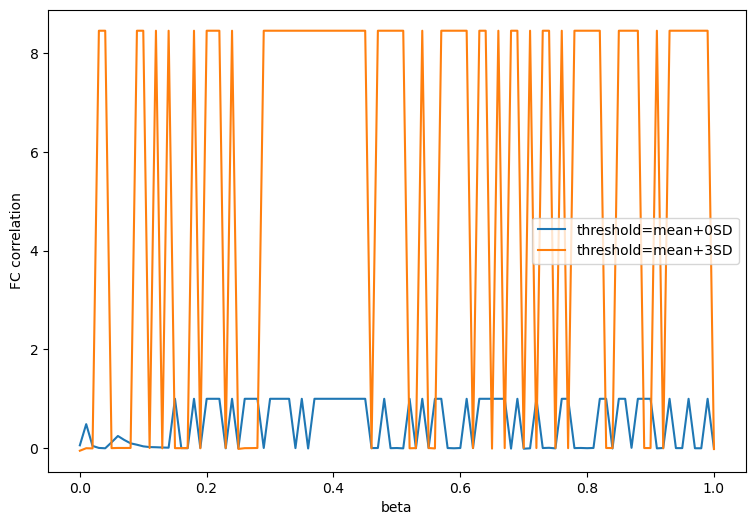

In [56]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
for threshold_index in [0, num_thresholds-1]:
    axs.plot(  depytorch(beta), depytorch(fc_corr[:,threshold_index]), label=f'threshold=mean+{threshold[threshold_index]:.3g}SD'  )
axs.set_xlabel('beta')
axs.set_ylabel('FC correlation')
# axs.set_title(f'{xname} vs {yname}')
axs.legend()
plt.show()

In [34]:
cov_rmse_file = os.path.join(file_dir, f'cov_rmse_{multi_threshold_model_param_string}.pt')
cov_rmse = torch.load(f=cov_rmse_file)
print( cov_rmse.size() )

torch.Size([101, 31])


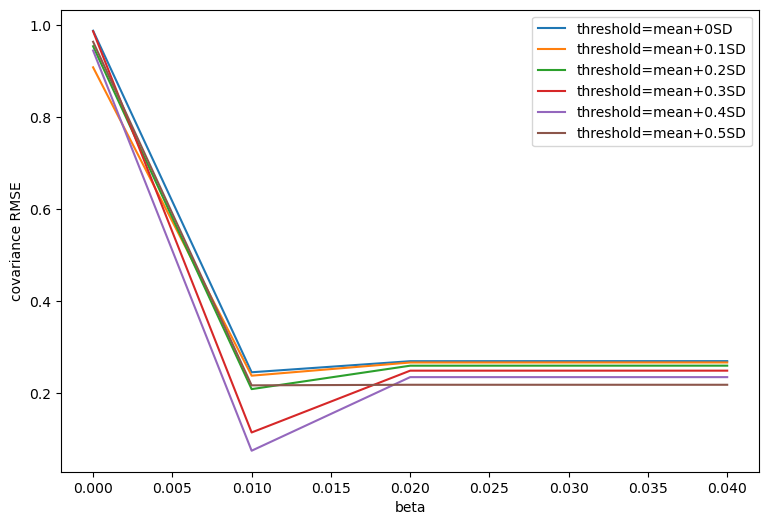

In [57]:
max_beta_index = (num_betas-1)//20
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
selected_beta = beta[:max_beta_index]
# selected_threshold_indices = [0, (num_thresholds-1)//6, (num_thresholds-1)//3, (num_thresholds-1)//2, 2*(num_thresholds-1)//3, 5*(num_thresholds-1)//6, num_thresholds-1]
selected_threshold_indices = [0, 1, 2, 3, 4, 5]
for threshold_index in selected_threshold_indices:
    axs.plot(  depytorch(selected_beta), depytorch(cov_rmse[:max_beta_index,threshold_index]), label=f'threshold=mean+{threshold[threshold_index]:.3g}SD'  )
axs.set_xlabel('beta')
axs.set_ylabel('covariance RMSE')
# axs.set_title(f'{xname} vs {yname}')
axs.legend()
plt.show()

In [49]:
model_file = os.path.join(file_dir, 'ising_model_light_group_thresholds_31_min_0_max_3_betas_101_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8.pt')
model = torch.load(model_file)
print( model.beta.size() )

AttributeError: 'str' object has no attribute 'beta'

torch.Size([101, 31])
tensor(0., device='cuda:0') tensor(0., device='cuda:0')
tensor(0.0045, device='cuda:0') tensor(0.0124, device='cuda:0')


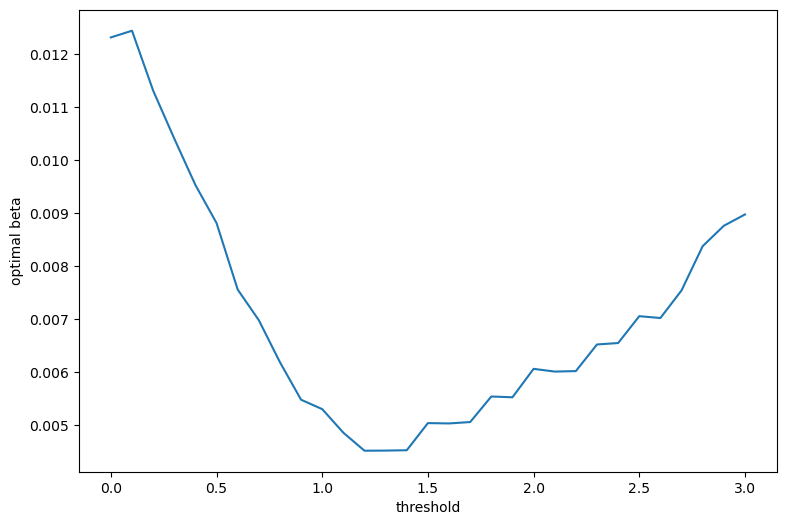

In [52]:
print( model.beta.size() )
beta_std, beta_mean = torch.std_mean(model.beta, dim=0)
print( beta_std.min(), beta_std.max() )
print( beta_mean.min(), beta_mean.max() )
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))
axs.errorbar( depytorch(threshold), depytorch(beta_mean), depytorch(beta_std) )
axs.set_xlabel('threshold')
axs.set_ylabel('optimal beta')
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [22]:
num_thresholds = 31
min_threshold = 0
max_threshold = 3
num_betas = 101
min_beta = 1e-09
max_beta = 0.025
data_string = f'thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}'
param_string = f'light_group_thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}_betas_{num_betas}_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_test_beta_min_{min_beta:.3g}_max_{max_beta:.3g}_sim_steps_120000'

In [144]:
num_thresholds = 31
min_threshold = 0
max_threshold = 3
num_betas = 101
min_beta = 1e-09
max_beta = 0.025
data_string = f'thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}'
param_string = f'light_group_thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}_betas_{num_betas}_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_param_updates_20000_test_beta_min_{min_beta:.3g}_max_{max_beta:.3g}_sim_steps_120000'

In [23]:
flip_rate_file = os.path.join(file_dir, f'flip_rate_{param_string}.pt')
flip_rate = torch.load(flip_rate_file)
print( 'flip_rate size', flip_rate.size() )

FileNotFoundError: [Errno 2] No such file or directory: 'E:\\Ising_model_results_daai\\flip_rate_light_group_thresholds_31_min_0_max_3_betas_101_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_test_beta_min_1e-09_max_0.025_sim_steps_120000.pt'

In [146]:
mean_flip_rate = flip_rate.mean(dim=-1)

In [147]:
stat_vals = mean_flip_rate
dist_name = 'flip rate'
stat_name = f'mean flip rate'
best_superlative = 'none'

In [25]:
fc_corr_file = os.path.join(file_dir, f'fc_corr_{param_string}.pt')
fc_corr = torch.load(fc_corr_file)
print( 'fc_corr size', fc_corr.size() )

fc_corr size torch.Size([101, 31])


In [26]:
stat_vals = fc_corr
dist_name = 'functional connectivity'
dist_dist_name = 'correlation vs binarized data'
stat_name = f'{dist_name} {dist_dist_name}'
best_superlative = 'maximum'

In [114]:
cov_rmse_file = os.path.join(file_dir, f'cov_rmse_{param_string}.pt')
cov_rmse = torch.load(cov_rmse_file)
print( 'cov_rmse size', cov_rmse.size() )

cov_rmse size torch.Size([101, 31])


In [115]:
stat_vals = cov_rmse
dist_name = 'covariance'
dist_dist_name = 'RMSE'
stat_name = f'{dist_name} {dist_dist_name}'
best_superlative = 'minimum'

In [27]:
num_thresholds = 31
min_threshold = 0
max_threshold = 3
num_betas = 101
min_beta = 1e-09
max_beta = 0.025
param_string_vs_as_is = f'light_group_thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}_betas_{num_betas}_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_test_beta_min_{min_beta:.3g}_max_{max_beta:.3g}_sim_steps_120000_vs_as_is'

In [28]:
fc_corr_vs_as_is_file = os.path.join(file_dir, f'fc_corr_{param_string_vs_as_is}.pt')
fc_corr_vs_as_is = torch.load(fc_corr_vs_as_is_file)
print( 'fc_corr_vs_as_is', fc_corr_vs_as_is.size() )

fc_corr_vs_as_is torch.Size([101, 31])


In [29]:
stat_vals = fc_corr_vs_as_is
dist_name = 'functional connectivity'
dist_dist_name = 'correlation versus original'
stat_name = f'{dist_name} {dist_dist_name}'
best_superlative = 'maximum'

In [30]:
thresholds = torch.linspace(start=min_threshold, end=max_threshold, steps=num_thresholds, dtype=float_type, device=device)

In [31]:
betas = torch.linspace(start=min_beta, end=max_beta, steps=num_betas, dtype=float_type, device=device)

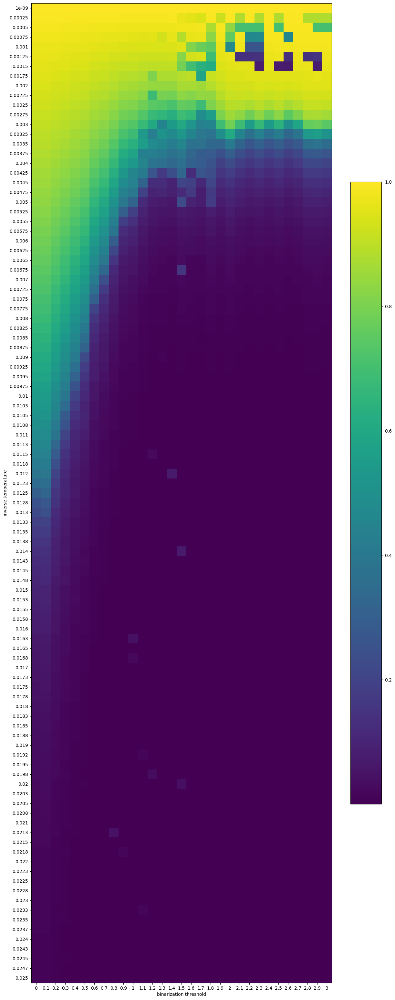

In [148]:
# show_square(fc_corr)
width=31//2
height=101//2
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(width, height) )
cbax = axs.imshow( depytorch(stat_vals) )
xlabels = [f'{threshold:.3g}' for threshold in thresholds]
ylabels = [f'{beta:.3g}' for beta in betas]
axs.set_xticks(  np.arange( len(xlabels) )  )
axs.set_yticks(  np.arange( len(ylabels) )  )
axs.set_xticklabels(xlabels)
axs.set_yticklabels(ylabels)
axs.set_xlabel('binarization threshold')
axs.set_ylabel('inverse temperature')
fig.colorbar(cbax, shrink=0.5)

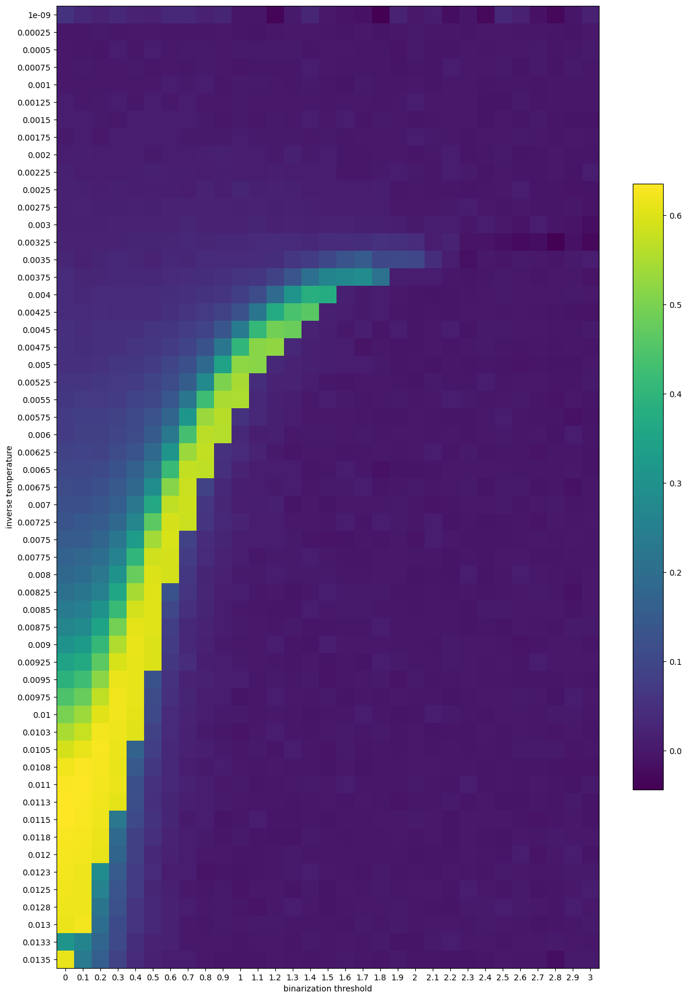

In [34]:
# show_square(fc_corr)
start_row= torch.argmin( torch.abs(betas - 0) )
end_row = torch.argmin( torch.abs(betas - 0.0135) ) + 1
width=num_thresholds//2
height=(end_row-start_row).item()//2
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(width, height) )
cbax = axs.imshow( depytorch(stat_vals[start_row:end_row,:]) )
xlabels = [f'{threshold:.3g}' for threshold in thresholds]
ylabels = [ f'{beta:.3g}' for beta in betas[start_row:end_row] ]
axs.set_xticks(  np.arange( len(xlabels) )  )
axs.set_yticks(  np.arange( len(ylabels) )  )
axs.set_xticklabels(xlabels)
axs.set_yticklabels(ylabels)
axs.set_xlabel('binarization threshold')
axs.set_ylabel('inverse temperature')
fig.colorbar(cbax, shrink=0.5)

In [32]:
max_no_error_beta_index = torch.argmin( torch.abs(betas-0.0135) )
max_no_error_threshold_index = torch.argmin( torch.abs(thresholds-3) )
no_error_stat_vals = stat_vals[:max_no_error_beta_index,:max_no_error_threshold_index]
min_no_error_val = torch.min(no_error_stat_vals)-0.01
max_no_error_val = torch.max(no_error_stat_vals)+0.01

threshold closest to target 0 is 0 at index 0
threshold closest to target 1 is 1 at index 10
threshold closest to target 2 is 2 at index 20
threshold closest to target 2.4 is 2.4 at index 24


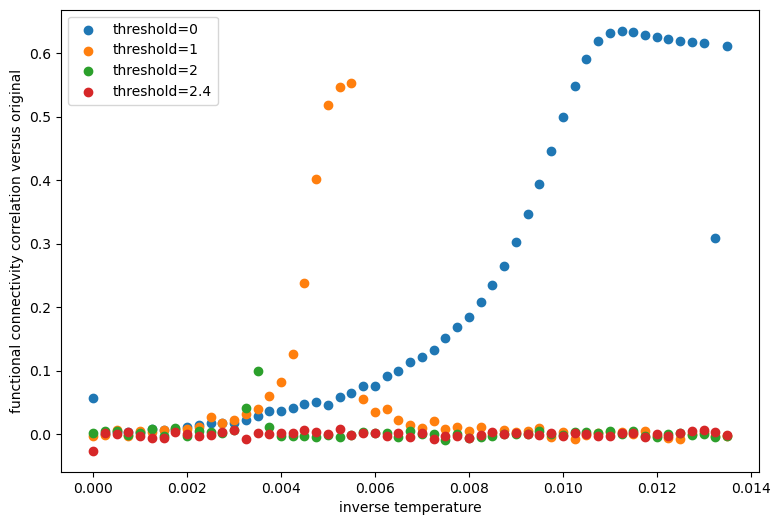

In [36]:
min_beta_index = 1
betas_from_min = betas[start_row:end_row]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
for target_threshold in [0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]:
    threshold_index = torch.argmin( torch.abs(thresholds-target_threshold) )
    threshold = thresholds[threshold_index]
    print(f'threshold closest to target {target_threshold:.3g} is {threshold:.3g} at index {threshold_index}')
    stat_vals_at_threshold = stat_vals[start_row:end_row,threshold_index]
    axs.scatter( depytorch(betas_from_min), depytorch(stat_vals_at_threshold), label=f'threshold={threshold:.3g}' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.legend()
axs.set_xlabel('inverse temperature')
axs.set_ylabel(stat_name)
# axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
# axs.set_title(f'{xname} vs {yname}')
plt.show()

threshold closest to target 0 is 0 at index 0
threshold closest to target 1 is 1 at index 10
threshold closest to target 2.4 is 2.4 at index 24


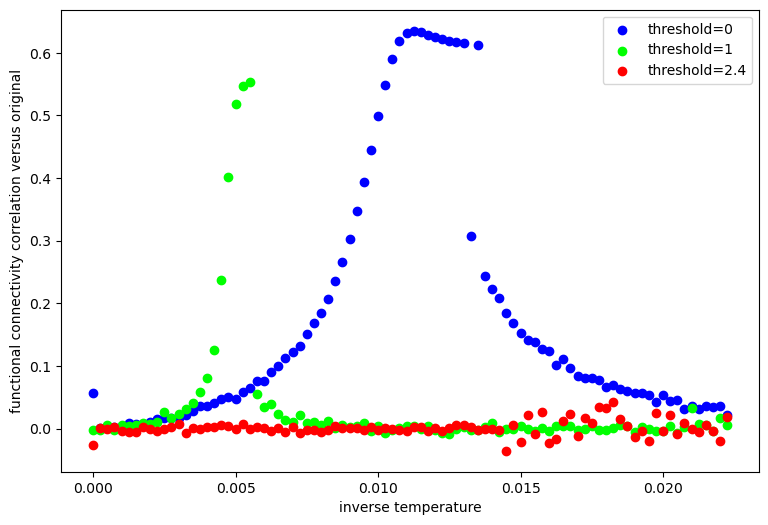

In [41]:
min_beta_index = 1
start_row = 0
end_row = ( 9*betas.numel() )//10
betas_from_min = betas[start_row:end_row]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
# target_thresholds = [0, 0.5, 1.0, 1.5, 2.0, 2.4]
# thresh_colors = [[0.0,0.0,1.0],[0.0,0.5,0.5],[0.0,1.0,0.0],[0.5,0.5,0.0],[0.75,0.25,0.0],[1.0,0.0,0.0],]
target_thresholds = [0, 1.0, 2.4]
thresh_colors = [[0.0,0.0,1.0],[0.0,1.0,0.0],[1.0,0.0,0.0],]
for target_index in range( len(target_thresholds) ):
    target_threshold = target_thresholds[target_index]
    threshold_index = torch.argmin( torch.abs(thresholds-target_threshold) )
    threshold = thresholds[threshold_index]
    print(f'threshold closest to target {target_threshold:.3g} is {threshold:.3g} at index {threshold_index}')
    stat_vals_at_threshold = stat_vals[start_row:end_row,threshold_index]
    axs.scatter( depytorch(betas_from_min), depytorch(stat_vals_at_threshold), label=f'threshold={threshold:.3g}', color=thresh_colors[target_index] )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.legend()
axs.set_xlabel('inverse temperature')
axs.set_ylabel(stat_name)
# axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
# axs.set_title(f'{xname} vs {yname}')
plt.show()

beta closest to target 0.003 is 0.003 at index 12
beta closest to target 0.008 is 0.008 at index 32
beta closest to target 0.014 is 0.014 at index 56


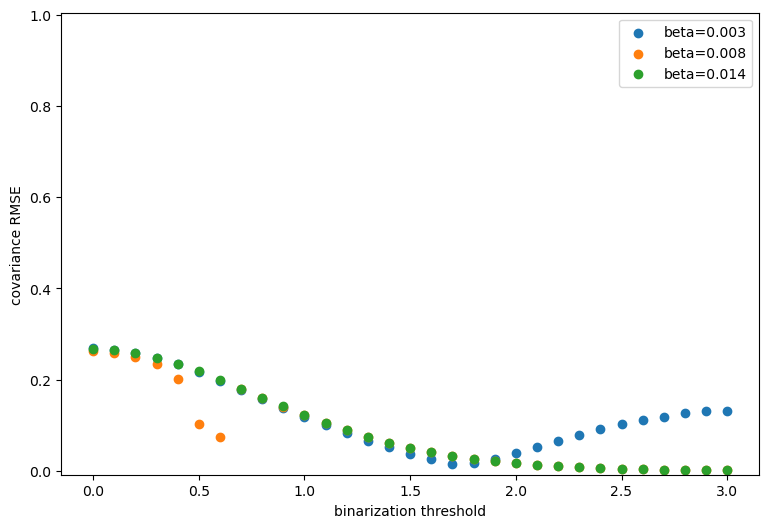

In [119]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(9, 6))

for target_beta in [0.003, 0.008, 0.014]:
    beta_index = torch.argmin( torch.abs(betas-target_beta) )
    beta = betas[beta_index]
    print(f'beta closest to target {target_beta:.3g} is {beta:.3g} at index {beta_index}')
    stat_vals_at_beta = stat_vals[beta_index,:]
    axs.scatter( depytorch(thresholds), depytorch(stat_vals_at_beta), label=f'beta={beta:.3g}' )

# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlabel('binarization threshold')
axs.set_ylabel(stat_name)
axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
axs.legend()
# axs.set_title(f'{xname} vs {yname}')
plt.show()

threshold	beta	covariance RMSE
0	0.0123	0.0804
0.1	0.012	0.0791
0.2	0.0125	0.0797
0.3	0.0105	0.0781
0.4	0.0095	0.0775
0.5	0.0085	0.0726
0.6	0.0075	0.0666
0.7	0.00675	0.0628
0.8	0.006	0.0563
0.9	0.00525	0.0544
1	0.00475	0.0507
1.1	0.0045	0.0408
1.2	0.004	0.0422
1.3	0.00375	0.0341
1.4	0.0035	0.0295
1.5	0.00325	0.0273
1.6	0.00325	0.0187
1.7	0.003	0.016
1.8	0.00275	0.0153
1.9	0.00275	0.0117
2	0.0025	0.0111
2.1	0.0025	0.00991
2.2	0.00375	0.00844
2.3	0.00375	0.00639
2.4	0.00375	0.00478
2.5	0.0035	0.00305
2.6	0.0035	0.0025
2.7	0.00375	0.00206
2.8	0.00375	0.00168
2.9	0.004	0.00136
3	0.00475	0.00111


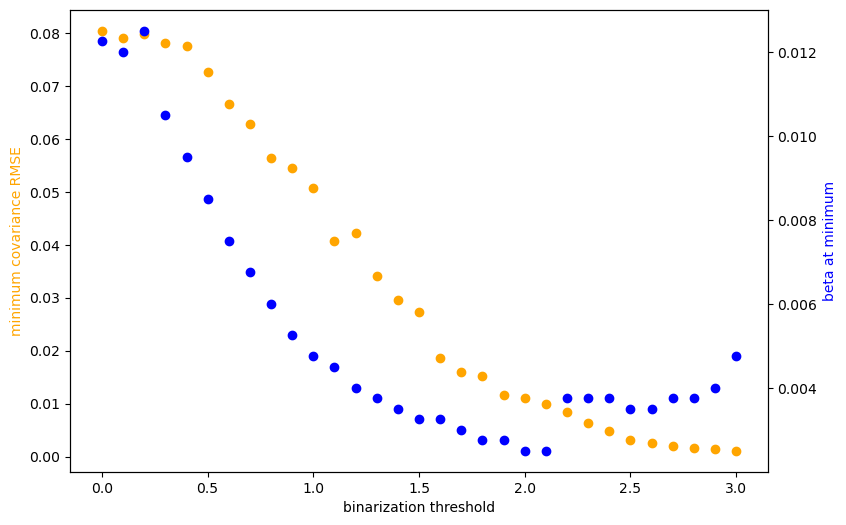

In [120]:
beta_color = 'blue'
stat_color = 'orange'
if best_superlative == 'minimum':
    best_stat_vals_for_threshold, best_stat_vals_beta_index = torch.min(stat_vals,dim=0)
else:
    best_stat_vals_for_threshold, best_stat_vals_beta_index = torch.max(stat_vals,dim=0)
beta_for_best_stat_val = betas[best_stat_vals_beta_index]
print(f'threshold\tbeta\t{stat_name}')
for threshold_index in range(num_thresholds):
    print(f'{thresholds[threshold_index]:.3g}\t{beta_for_best_stat_val[threshold_index]:.3g}\t{best_stat_vals_for_threshold[threshold_index]:.3g}')
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs2 = axs.twinx()
axs.scatter( depytorch(thresholds), depytorch(best_stat_vals_for_threshold), color=stat_color )
axs2.scatter( depytorch(thresholds), depytorch(beta_for_best_stat_val), color=beta_color )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
# axs.set_xlim([-0.05, 2.55])
# axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'{best_superlative} {stat_name}')
axs.yaxis.label.set_color(stat_color)
axs2.set_ylabel(f'beta at {best_superlative}')
axs2.yaxis.label.set_color(beta_color)
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [67]:
mean_state_binarized_file = os.path.join(file_dir, f'mean_state_{data_string}.pt')
mean_state_binarized = torch.load(mean_state_binarized_file)
print( 'mean state binarized size', mean_state_binarized.size() )

mean_state_product_binarized_file = os.path.join(file_dir, f'mean_state_product_{data_string}.pt')
mean_state_product_binarized = torch.load(mean_state_product_binarized_file)
print( 'mean state product binarized size', mean_state_product_binarized.size() )

covariance_binarized = mean_state_product_binarized - mean_state_binarized.unsqueeze(dim=-1) * mean_state_binarized.unsqueeze(dim=-2)
print( 'covariance binarized size', covariance_binarized.size() )

std_dev_binarized = torch.sqrt( 1 - mean_state_binarized.square() )
functional_connectivity_binarized = covariance_binarized/( std_dev_binarized.unsqueeze(dim=-1) * std_dev_binarized.unsqueeze(dim=-2) )
print( 'functional connectivity binarized size', functional_connectivity_binarized.size() )

mean state binarized size torch.Size([31, 360])
mean state product binarized size torch.Size([31, 360, 360])
covariance binarized size torch.Size([31, 360, 360])
functional connectivity binarized size torch.Size([31, 360, 360])


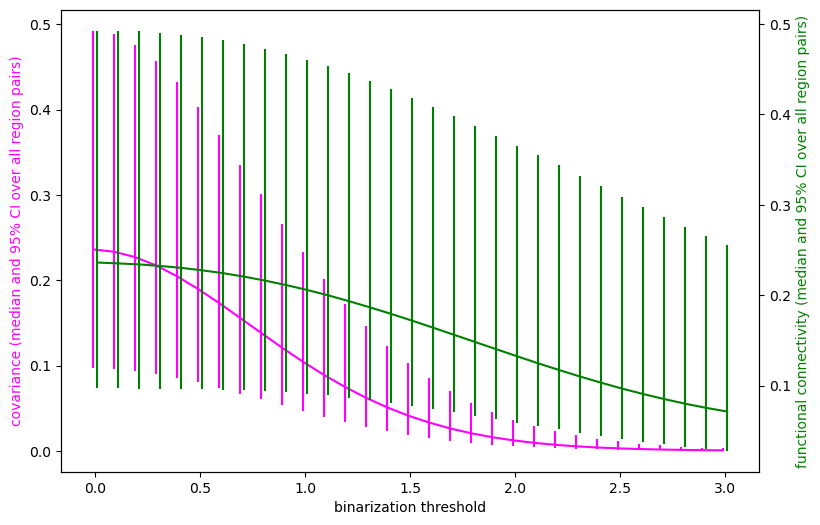

In [34]:
quantiles = torch.tensor(data=[0.025, 0.975, 0.5], dtype=float_type, device=device)
triu_indices = torch.triu_indices( row=covariance_binarized.size(dim=-2), col=covariance_binarized.size(dim=-1), dtype=int_type, device=device )
triu_rows = triu_indices[0]
triu_cols = triu_indices[1]
def get_median_and_ci(values:torch.Tensor):
    vals_ut = values[:,triu_rows,triu_cols]
    # print( 'vals_flat size', vals_flat.size() )
    quant_vals = torch.quantile( input=vals_ut, q=quantiles, dim=-1 )
    # print( 'quant_vals size', quant_vals.size() )
    med = quant_vals[-1,:]
    ci = torch.abs( quant_vals[:-1,:] - med.unsqueeze(dim=0) )
    return med, ci
cov_med, cov_ci = get_median_and_ci(values=covariance_binarized)
# print( 'cov_med size', cov_med.size() )
# print( 'cov_ci size', cov_ci.size() )
fc_med, fc_ci = get_median_and_ci(values=functional_connectivity_binarized)
# print( 'fc_med size', fc_med.size() )
# print( 'fc_ci size', fc_ci.size() )
cov_color = 'magenta'
fc_color = 'green'
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs2 = axs.twinx()
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(cov_med), yerr=depytorch(cov_ci), color=cov_color )
axs2.errorbar( x=depytorch(thresholds+0.01), y=depytorch(fc_med), yerr=depytorch(fc_ci), color=fc_color )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'covariance (median and 95% CI over all region pairs)')
axs.yaxis.label.set_color(cov_color)
axs2.set_ylabel(f'functional connectivity (median and 95% CI over all region pairs)')
axs2.yaxis.label.set_color(fc_color)
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [63]:
mean_state_as_is = torch.load( os.path.join(file_dir, 'mean_state_all_as_is.pt') )[:,training_index_start:training_index_end,:]
print( 'mean state size', mean_state_as_is.size() )
group_mean_state_as_is = torch.mean( mean_state_as_is, dim=(0,1), keepdim=True )
torch.save( obj=group_mean_state_as_is, f=os.path.join(file_dir, 'mean_state_group_as_is.pt') )

mean state size torch.Size([4, 670, 360])


In [64]:
mean_state_product_as_is = torch.load( os.path.join(file_dir, 'mean_state_product_all_as_is.pt') )[:,training_index_start:training_index_end,:,:]
print( 'mean state product size', mean_state_product_as_is.size() )
group_mean_state_product_as_is = torch.mean( mean_state_product_as_is, dim=(0,1), keepdim=True )
torch.save( obj=group_mean_state_product_as_is, f=os.path.join(file_dir, 'mean_state_product_group_as_is.pt') )

mean state product size torch.Size([4, 670, 360, 360])


In [65]:
covariance_as_is = group_mean_state_product_as_is - group_mean_state_as_is.unsqueeze(dim=-1) * group_mean_state_as_is.unsqueeze(dim=-2)
print( 'covariance as-is size', covariance_as_is.size() )

std_dev_as_is = torch.sqrt( 1 - group_mean_state_as_is.square() )
functional_connectivity_as_is = covariance_as_is/( std_dev_as_is.unsqueeze(dim=-1) * std_dev_as_is.unsqueeze(dim=-2) )
print( 'functional connectivity as-is size', functional_connectivity_as_is.size() )

covariance as-is size torch.Size([1, 1, 360, 360])
functional connectivity as-is size torch.Size([1, 1, 360, 360])


In [68]:
print( 'functional_connectivity_binarized size', functional_connectivity_binarized.size() )
print( 'functional_connectivity_as_is size', functional_connectivity_as_is.size() )
fc_corr_binarized_vs_as_is = isingmodellight.get_pairwise_correlation_ut( mat1=functional_connectivity_binarized, mat2=functional_connectivity_as_is ).squeeze()
print( 'fc_corr_binarized_vs_as_is size', fc_corr_binarized_vs_as_is.size() )

functional_connectivity_binarized size torch.Size([31, 360, 360])
functional_connectivity_as_is size torch.Size([1, 1, 360, 360])
fc_corr_binarized_vs_as_is size torch.Size([31])


In [86]:
print_stats(values=fc_corr_binarized_vs_as_is, name='FC correlation between original and binarized group data')

The distribution of FC correlation between original and binarized group data values has median 0.968 with 95% CI [0.864, 0.991] and range [0.855, 0.991].


In [90]:
sim_state_mean_file = os.path.join(file_dir, f'sim_state_mean_{param_string}.pt')
sim_state_mean = torch.load(sim_state_mean_file)
print( 'sim state mean size', sim_state_mean.size() )

sim state mean size torch.Size([101, 31, 360])


In [91]:
sim_state_product_mean_file = os.path.join(file_dir, f'sim_state_product_mean_{param_string}.pt')
print(sim_state_product_mean_file)
sim_state_product_mean = torch.load(sim_state_product_mean_file)
print( 'sim state product mean size', sim_state_product_mean.size() )

E:\Ising_model_results_daai\sim_state_product_mean_light_group_thresholds_31_min_0_max_3_betas_101_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_param_updates_20000_test_beta_min_1e-09_max_0.025_sim_steps_120000.pt
sim state product mean size torch.Size([101, 31, 360, 360])


In [92]:
print( '-1s in mean state', torch.count_nonzero(sim_state_mean == -1).item() )
print( '+1s in mean state', torch.count_nonzero(sim_state_mean == 1).item() )
print( '-1s in mean state product', torch.count_nonzero(sim_state_product_mean == -1).item() )
print( '+1s in mean state product', torch.count_nonzero(sim_state_product_mean == 1).item() )

-1s in mean state 224976
+1s in mean state 1683
-1s in mean state product 607758
+1s in mean state product 73135348


In [93]:
sim_cov = sim_state_product_mean - sim_state_mean.unsqueeze(dim=-2) * sim_state_mean.unsqueeze(dim=-1)
print( 'sim cov size', sim_cov.size() )
sim_std = torch.sqrt( 1 - torch.square(sim_state_mean) )
sim_fc = sim_cov/( sim_std.unsqueeze(dim=-2) * sim_std.unsqueeze(dim=-1) )
print( 'sim fc size', sim_fc.size() )

sim cov size torch.Size([101, 31, 360, 360])
sim fc size torch.Size([101, 31, 360, 360])


In [94]:
print( 'sim_fc size', sim_fc.size() )
print( 'functional_connectivity_binarized size', functional_connectivity_binarized.size() )
print( 'functional_connectivity_as_is size', functional_connectivity_as_is.size() )
fc_corr_sim_vs_binarized = isingmodellight.get_pairwise_correlation_ut( mat1=sim_fc, mat2=functional_connectivity_binarized )
print( 'fc_corr_sim_vs_binarized size', fc_corr_sim_vs_binarized.size() )
fc_corr_sim_vs_as_is = isingmodellight.get_pairwise_correlation_ut( mat1=sim_fc, mat2=functional_connectivity_as_is )
print( 'fc_corr_sim_vs_as_is size', fc_corr_sim_vs_as_is.size() )

sim_fc size torch.Size([101, 31, 360, 360])
functional_connectivity_binarized size torch.Size([31, 360, 360])
functional_connectivity_as_is size torch.Size([1, 1, 360, 360])
fc_corr_sim_vs_binarized size torch.Size([101, 31])
fc_corr_sim_vs_as_is size torch.Size([101, 31])


In [95]:
stat_vals = fc_corr_sim_vs_binarized
stat_name = 'FC correlation versus binarized data'

In [122]:
stat_vals = fc_corr_sim_vs_as_is
stat_name = 'FC correlation versus un-binarized data'

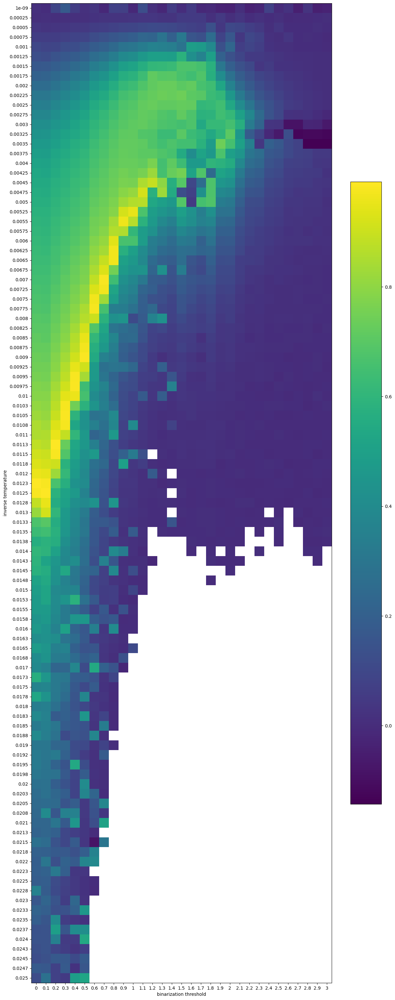

In [123]:
# show_square(fc_corr)
start_row= torch.argmin( torch.abs(betas - 0) )
end_row = torch.argmin( torch.abs(betas - 0.025) ) + 1
width=num_thresholds//2
height=(end_row-start_row).item()//2
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(width, height) )
cbax = axs.imshow( depytorch(stat_vals[start_row:end_row,:]) )
xlabels = [f'{threshold:.3g}' for threshold in thresholds]
ylabels = [ f'{beta:.3g}' for beta in betas[start_row:end_row] ]
axs.set_xticks(  np.arange( len(xlabels) )  )
axs.set_yticks(  np.arange( len(ylabels) )  )
axs.set_xticklabels(xlabels)
axs.set_yticklabels(ylabels)
axs.set_xlabel('binarization threshold')
axs.set_ylabel('inverse temperature')
fig.colorbar(cbax, shrink=0.5)

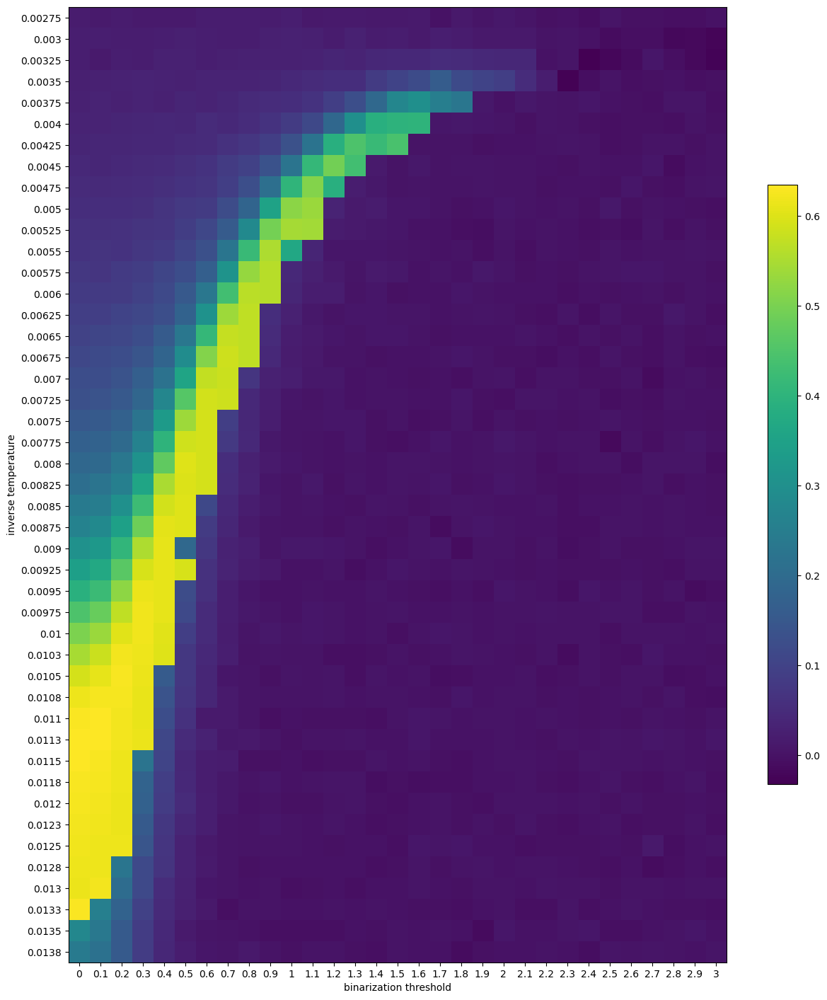

In [80]:
# show_square(fc_corr)
start_row= torch.argmin( torch.abs(betas - 0.00275) )
end_row = torch.argmin( torch.abs(betas - 0.0138) ) + 1
width=num_thresholds//2
height=(end_row-start_row).item()//2
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(width, height) )
cbax = axs.imshow( depytorch(stat_vals[start_row:end_row,:]) )
xlabels = [f'{threshold:.3g}' for threshold in thresholds]
ylabels = [ f'{beta:.3g}' for beta in betas[start_row:end_row] ]
axs.set_xticks(  np.arange( len(xlabels) )  )
axs.set_yticks(  np.arange( len(ylabels) )  )
axs.set_xticklabels(xlabels)
axs.set_yticklabels(ylabels)
axs.set_xlabel('binarization threshold')
axs.set_ylabel('inverse temperature')
fig.colorbar(cbax, shrink=0.5)

threshold closest to target 0 is 0 at index 0
threshold closest to target 0.5 is 0.5 at index 5
threshold closest to target 1 is 1 at index 10
threshold closest to target 1.5 is 1.5 at index 15
threshold closest to target 2 is 2 at index 20
threshold closest to target 2.5 is 2.5 at index 25
threshold closest to target 3 is 3 at index 30


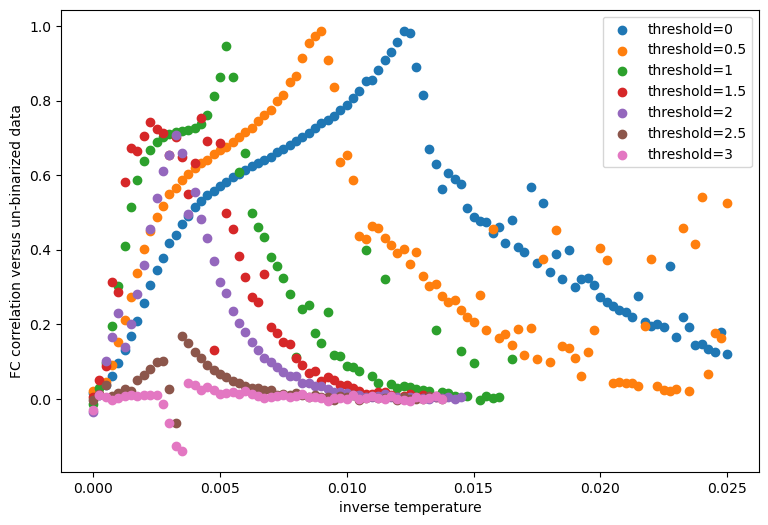

In [124]:
min_beta_index = 1
betas_from_min = betas[start_row:end_row]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
for target_threshold in [0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]:
    threshold_index = torch.argmin( torch.abs(thresholds-target_threshold) )
    threshold = thresholds[threshold_index]
    print(f'threshold closest to target {target_threshold:.3g} is {threshold:.3g} at index {threshold_index}')
    stat_vals_at_threshold = stat_vals[start_row:end_row,threshold_index]
    axs.scatter( depytorch(betas_from_min), depytorch(stat_vals_at_threshold), label=f'threshold={threshold:.3g}' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.legend()
axs.set_xlabel('inverse temperature')
axs.set_ylabel(stat_name)
# axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
# axs.set_title(f'{xname} vs {yname}')
plt.show()

threshold	beta	FC correlation versus un-binarized data
0	0.0123	0.988
0.1	0.0125	0.992
0.2	0.0113	0.99
0.3	0.0105	0.984
0.4	0.00975	0.987
0.5	0.009	0.987
0.6	0.00775	0.975
0.7	0.007	0.98
0.8	0.00625	0.968
0.9	0.0055	0.964
1	0.00525	0.948
1.1	0.00475	0.917
1.2	0.0045	0.891
1.3	0.00475	0.826
1.4	0.00225	0.729
1.5	0.00425	0.753
1.6	0.002	0.721
1.7	0.00225	0.696
1.8	0.005	0.678
1.9	0.0035	0.741
2	0.00325	0.707
2.1	0.003	0.568
2.2	0.00275	0.383
2.3	0.00375	0.26
2.4	0.0035	0.203
2.5	0.0035	0.169
2.6	0.00325	0.129
2.7	0.0035	0.0817
2.8	0.00375	0.072
2.9	0.00425	0.0512
3	0.00375	0.0429


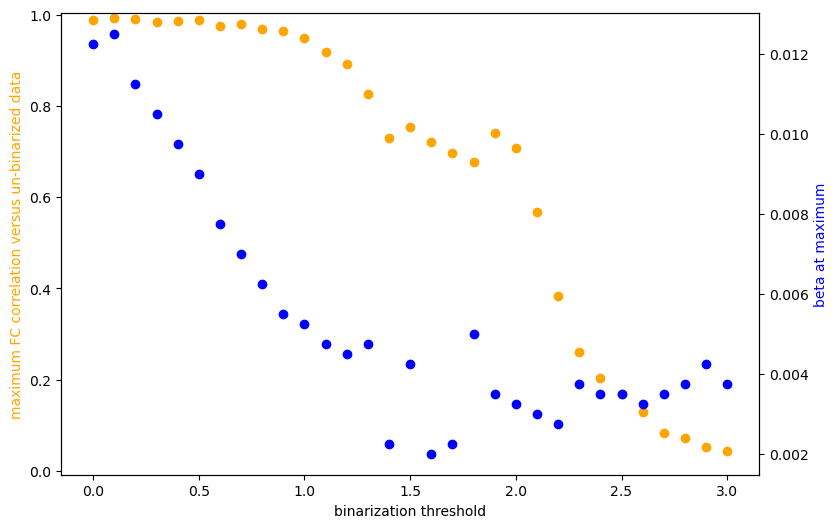

In [125]:
beta_color = 'blue'
stat_color = 'orange'
best_superlative = 'maximum'
if best_superlative == 'minimum':
    best_stat_vals_for_threshold, best_stat_vals_beta_index = torch.min(stat_vals,dim=0)
else:
    best_stat_vals_for_threshold, best_stat_vals_beta_index = torch.max(stat_vals,dim=0)
beta_for_best_stat_val = betas[best_stat_vals_beta_index]
print(f'threshold\tbeta\t{stat_name}')
for threshold_index in range(num_thresholds):
    # Redo the search in case the column contains NaNs.
    values_for_threshold = stat_vals[:,threshold_index]
    is_not_nan = torch.logical_not(  torch.logical_or( torch.isnan(values_for_threshold), torch.isinf(values_for_threshold) )  )
    non_nan_values = values_for_threshold[is_not_nan]
    non_nan_betas = betas[is_not_nan]
    if best_superlative == 'minimum':
        best_index = torch.argmin(non_nan_values)
    else:
        best_index = torch.argmax(non_nan_values)
    best_value = non_nan_values[best_index]
    best_beta = non_nan_betas[best_index]
    best_stat_vals_for_threshold[threshold_index] = best_value
    beta_for_best_stat_val[threshold_index] = best_beta
    print(f'{thresholds[threshold_index]:.3g}\t{best_beta:.3g}\t{best_value:.3g}')
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs2 = axs.twinx()
axs.scatter( depytorch(thresholds), depytorch(best_stat_vals_for_threshold), color=stat_color )
axs2.scatter( depytorch(thresholds), depytorch(beta_for_best_stat_val), color=beta_color )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
# axs.set_xlim([-0.05, 2.55])
axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'{best_superlative} {stat_name}')
axs.yaxis.label.set_color(stat_color)
axs2.set_ylabel(f'beta at {best_superlative}')
axs2.yaxis.label.set_color(beta_color)
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [84]:
fc_corr_sim_vs_as_is_pretraining = best_stat_vals_for_threshold

In [126]:
fc_corr_sim_vs_as_is_20k = best_stat_vals_for_threshold

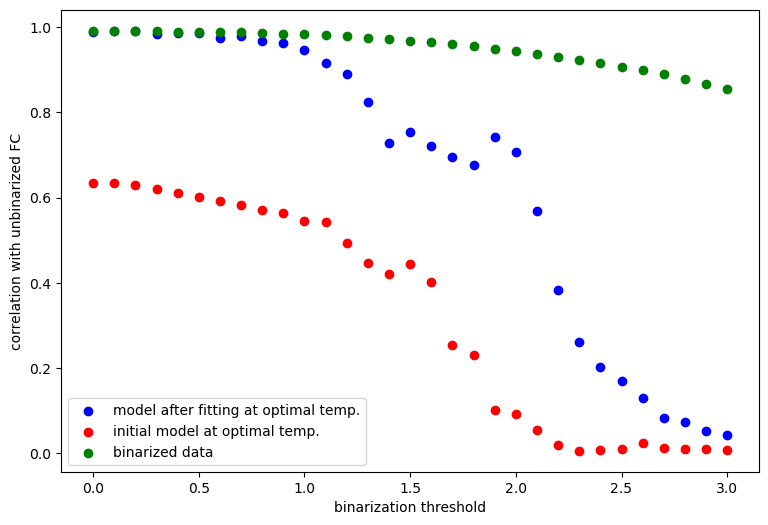

In [127]:
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs.scatter( depytorch(thresholds), depytorch(fc_corr_sim_vs_as_is_20k), color='blue', label='model after fitting at optimal temp.' )
axs.scatter( depytorch(thresholds), depytorch(fc_corr_sim_vs_as_is_pretraining), color='red', label='initial model at optimal temp.' )
axs.scatter( depytorch(thresholds), depytorch(fc_corr_binarized_vs_as_is), color='green', label='binarized data' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
# axs.set_xlim([-0.05, 2.55])
# axs.set_ylim([min_no_error_val.item(), max_no_error_val.item()])
axs.set_xlabel('binarization threshold')
axs.set_ylabel('correlation with unbinarized FC')
# axs.set_title(f'{xname} vs {yname}')
axs.legend()
plt.show()

In [130]:
num_thresholds = 31
min_threshold = 0
max_threshold = 3
num_betas = 101
param_string = f'group_thresholds_{num_thresholds}_min_{min_threshold:.3g}_max_{max_threshold:.3g}_betas_{num_betas}_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_param_updates_20000_test_length_120000'

In [131]:
cov_rmse_file = os.path.join(file_dir, f'cov_rmse_{param_string}.pt')
cov_rmse = torch.load(cov_rmse_file)
print( 'cov_rmse size', cov_rmse.size() )

cov_rmse size torch.Size([101, 31])


In [132]:
fc_corr_file = os.path.join(file_dir, f'fc_corr_{param_string}.pt')
fc_corr = torch.load(fc_corr_file)
print( 'fc_corr size', fc_corr.size() )

fc_corr size torch.Size([101, 31])


cov_med size torch.Size([31])
cov_ci size torch.Size([2, 31])
fc_med size torch.Size([31])
fc_ci size torch.Size([2, 31])


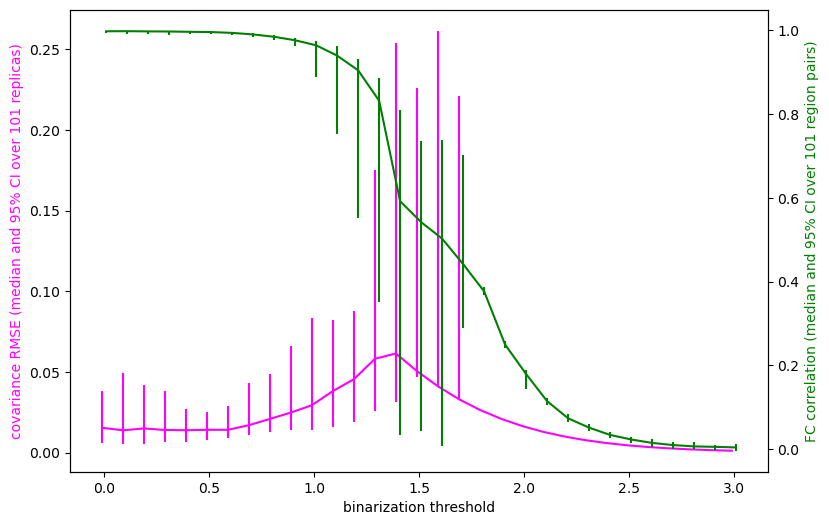

In [133]:
quantiles = torch.tensor(data=[0.025, 0.975, 0.5], dtype=float_type, device=device)
num_replicas = cov_rmse.size(dim=0)
def get_median_and_ci(values:torch.Tensor):
    quant_vals = torch.quantile( input=values, q=quantiles, dim=0 )
    # print( 'quant_vals size', quant_vals.size() )
    med = quant_vals[-1,:]
    ci = torch.abs( quant_vals[:-1,:] - med.unsqueeze(dim=0) )
    return med, ci
cov_med, cov_ci = get_median_and_ci(values=cov_rmse)
print( 'cov_med size', cov_med.size() )
print( 'cov_ci size', cov_ci.size() )
fc_med, fc_ci = get_median_and_ci(values=fc_corr)
print( 'fc_med size', fc_med.size() )
print( 'fc_ci size', fc_ci.size() )
cov_color = 'magenta'
fc_color = 'green'
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs2 = axs.twinx()
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(cov_med), yerr=depytorch(cov_ci), color=cov_color )
axs2.errorbar( x=depytorch(thresholds+0.01), y=depytorch(fc_med), yerr=depytorch(fc_ci), color=fc_color )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'covariance RMSE (median and 95% CI over {num_replicas} replicas)')
axs.yaxis.label.set_color(cov_color)
axs2.set_ylabel(f'FC correlation (median and 95% CI over {num_replicas} region pairs)')
axs2.yaxis.label.set_color(fc_color)
# axs.set_title(f'{xname} vs {yname}')
plt.show()

cov_med size torch.Size([31])
cov_range size torch.Size([2, 31])
fc_med size torch.Size([31])
fc_range size torch.Size([2, 31])


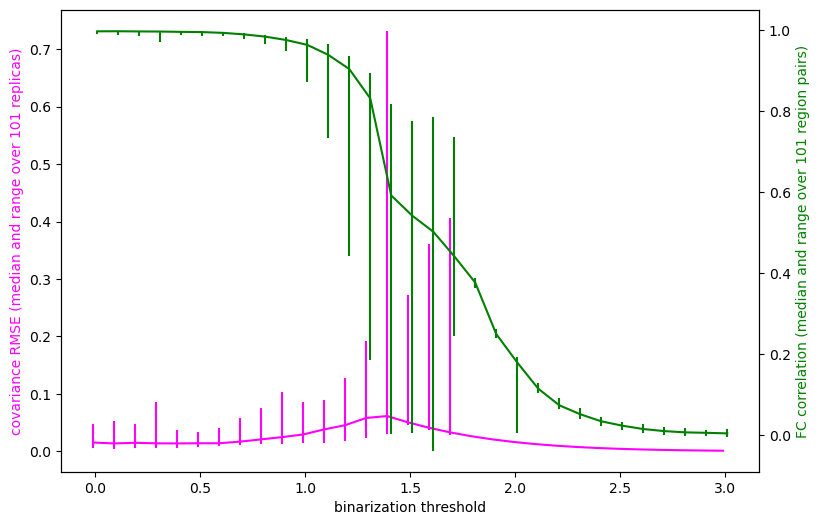

In [136]:
quantiles = torch.tensor(data=[0.025, 0.975, 0.5], dtype=float_type, device=device)
num_replicas = cov_rmse.size(dim=0)
def get_median_and_range(values:torch.Tensor):
    med_val = torch.median(values, dim=0).values
    min_val = torch.min(values, dim=0).values
    max_val = torch.max(values, dim=0).values
    range_vals = torch.stack( (med_val-min_val, max_val-med_val), dim=0 )
    return med_val, range_vals
cov_med, cov_range = get_median_and_range(values=cov_rmse)
print( 'cov_med size', cov_med.size() )
print( 'cov_range size', cov_range.size() )
fc_med, fc_range = get_median_and_range(values=fc_corr)
print( 'fc_med size', fc_med.size() )
print( 'fc_range size', fc_range.size() )
cov_color = 'magenta'
fc_color = 'green'
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs2 = axs.twinx()
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(cov_med), yerr=depytorch(cov_range), color=cov_color )
axs2.errorbar( x=depytorch(thresholds+0.01), y=depytorch(fc_med), yerr=depytorch(fc_range), color=fc_color )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlabel('binarization threshold')
axs.set_ylabel(f'covariance RMSE (median and range over {num_replicas} replicas)')
axs.yaxis.label.set_color(cov_color)
axs2.set_ylabel(f'FC correlation (median and range over {num_replicas} region pairs)')
axs2.yaxis.label.set_color(fc_color)
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [22]:
# base_model_param_string = f'all_mean_std_0_medium_init_uncentered_reps_5_lr_0.01_steps_1200_pupd_per_bopt_1000_num_opt_1_bopt_steps_66_popt_steps_10000'
base_model_param_string = f'all_mean_std_1_medium_init_uncentered_reps_5_lr_0.01_steps_1200_pupd_per_bopt_1000_num_opt_1_bopt_steps_68_popt_steps_40000'
# base_model_param_string = f'group_thresholds_31_min_0_max_3_betas_101_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_param_updates_20000'
length_suffix = 'test_length_120000'
model_param_string_h = f'{base_model_param_string}_{length_suffix}'
model_param_string_no_h = f'{base_model_param_string}_no_h_{length_suffix}'
stat_prefix = 'fc_corr'
stat_name = 'FC correlation'
# stat_prefix = 'cov_rmse'
# stat_name = 'covariance RMSE'
stat_vals_h = torch.load( os.path.join(file_dir, f'{stat_prefix}_{model_param_string_h}.pt') )[:,training_index_start:training_index_end]
print( 'stat_vals_h', stat_vals_h.size() )
print_stats(name=stat_name, values=stat_vals_h)
stat_vals_no_h = torch.load( os.path.join(file_dir, f'{stat_prefix}_{model_param_string_no_h}.pt') )[:,training_index_start:training_index_end]
print( 'stat_vals_no_h', stat_vals_no_h.size() )
print_stats(name=stat_name, values=stat_vals_no_h)

stat_vals_h torch.Size([5, 670])
The distribution of FC correlation values has median 0.976 with 95% CI [0.931, 0.986] and range [0.329, 0.993].
stat_vals_no_h torch.Size([5, 670])
The distribution of FC correlation values has median 0.924 with 95% CI [0.827, 0.969] and range [0.497, 0.986].


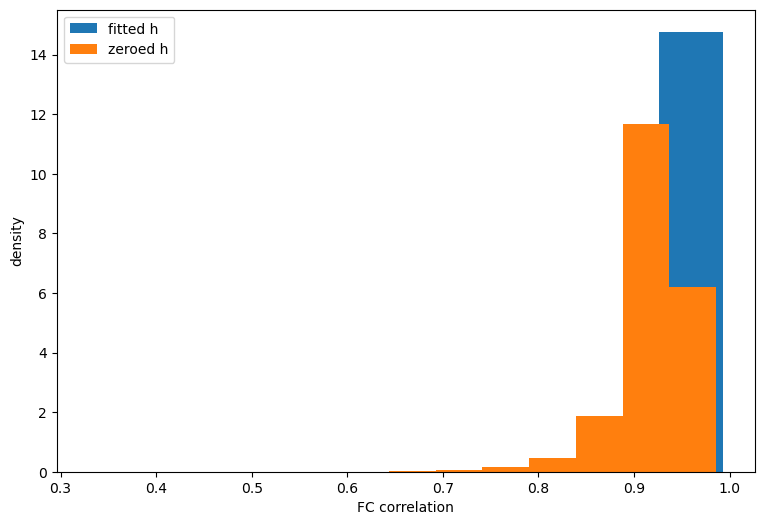

MannwhitneyuResult(statistic=10749782.0, pvalue=0.0)
WilcoxonResult(statistic=883.0, pvalue=1.161362570155637e-109)


In [23]:
make_histogram_pair(values1=stat_vals_h, values2=stat_vals_no_h, label1='fitted h', label2='zeroed h', xlabel=stat_name)
print(   stats.wilcoxon(  depytorch( stat_vals_h.mean(dim=0) ), depytorch( stat_vals_no_h.mean(dim=0) )  )   )

h_med size torch.Size([31])
h_ci size torch.Size([2, 31])
no_h_med size torch.Size([31])
no_h_ci size torch.Size([2, 31])


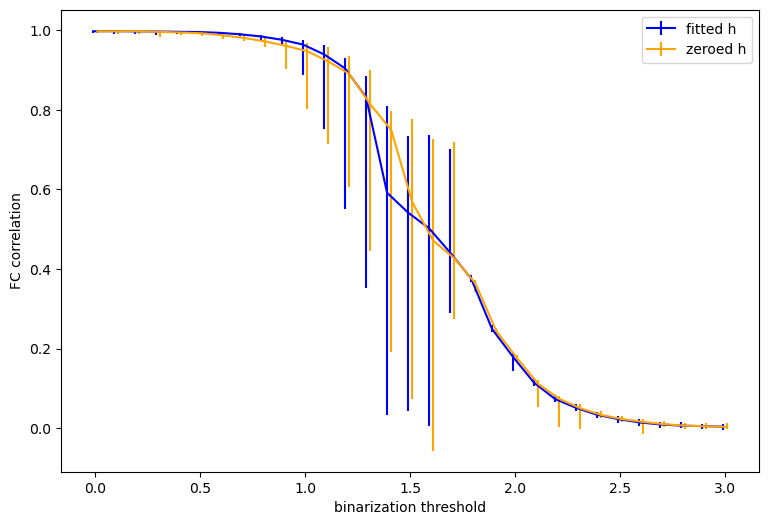

In [60]:
num_thresholds = 31
min_threshold = 0.0
max_threshold = 3.0
thresholds = torch.linspace(start=min_threshold, end=max_threshold, steps=num_thresholds, dtype=float_type, device=device)
quantiles = torch.tensor(data=[0.025, 0.975, 0.5], dtype=float_type, device=device)
num_replicas = cov_rmse.size(dim=0)
def get_median_and_ci(values:torch.Tensor):
    quant_vals = torch.quantile( input=values, q=quantiles, dim=0 )
    # print( 'quant_vals size', quant_vals.size() )
    med = quant_vals[-1,:]
    ci = torch.abs( quant_vals[:-1,:] - med.unsqueeze(dim=0) )
    return med, ci
h_med, h_ci = get_median_and_ci(values=stat_vals_h)
print( 'h_med size', h_med.size() )
print( 'h_ci size', h_ci.size() )
no_h_med, no_h_ci = get_median_and_ci(values=stat_vals_no_h)
print( 'no_h_med size', no_h_med.size() )
print( 'no_h_ci size', no_h_ci.size() )
h_color = 'blue'
no_h_color = 'orange'
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
# axs2 = axs.twinx()
axs.errorbar( x=depytorch(thresholds-0.01), y=depytorch(h_med), yerr=depytorch(h_ci), color=h_color, label='fitted h' )
axs.errorbar( x=depytorch(thresholds+0.01), y=depytorch(no_h_med), yerr=depytorch(no_h_ci), color=no_h_color, label='zeroed h' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.set_xlabel('binarization threshold')
axs.set_ylabel(stat_name)
axs.legend()
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [16]:
model_file = os.path.join(file_dir, 'ising_model_light_all_mean_std_1_medium_init_uncentered_reps_5_lr_0.01_steps_1200_pupd_per_bopt_1000_num_opt_1_bopt_steps_68_popt_steps_40000.pt')
h = torch.load(model_file).h
print( h.size() )

torch.Size([5, 837, 360])


In [17]:
mean_h = h.mean(dim=0)
min_h_for_region, subject_index_of_min_h_for_region = torch.min(mean_h, dim=0)
min_h, region_index_of_min_h = torch.min(min_h_for_region, dim=0)
subject_index_of_min_h = subject_index_of_min_h_for_region[region_index_of_min_h]
print( f'min h {min_h:.3g} at subject {subject_index_of_min_h}, region {region_index_of_min_h}' )

min h -69.8 at subject 234, region 31


In [18]:
max_h_for_region, subject_index_of_max_h_for_region = torch.max(mean_h, dim=0)
max_h, region_index_of_max_h = torch.max(max_h_for_region, dim=0)
subject_index_of_max_h = subject_index_of_max_h_for_region[region_index_of_max_h]
print( f'max h {max_h:.3g} at subject {subject_index_of_max_h}, region {region_index_of_max_h}' )

max h 17.1 at subject 233, region 220


In [24]:
data_ts_min_h = torch.load( os.path.join('D:\ising_model_results_daai', 'data_ts_all_as_is.pt') )[:,subject_index_of_min_h,region_index_of_min_h,:].clone()
print( data_ts_min_h.size() )
data_ts_max_h = torch.load( os.path.join('D:\ising_model_results_daai', 'data_ts_all_as_is.pt') )[:,subject_index_of_max_h,region_index_of_max_h,:].clone()
print( data_ts_max_h.size() )

torch.Size([4, 1200])
torch.Size([4, 1200])


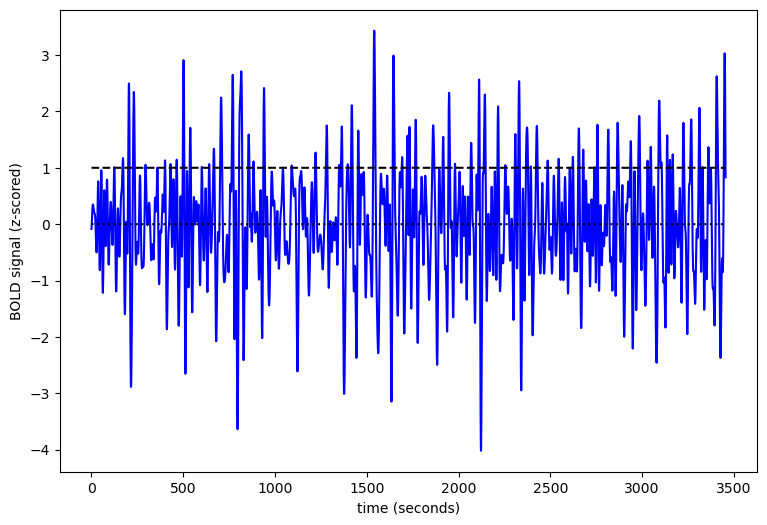

In [31]:
std_min_h, mean_min_h = torch.std_mean(data_ts_min_h, dim=-1, keepdim=True)
data_ts_min_h_z = (data_ts_min_h - mean_min_h)/std_min_h
data_ts_min_h_flat = data_ts_min_h_z.flatten()
time = torch.arange( 0, data_ts_min_h_flat.numel() )*0.72
zeros_ts = torch.zeros_like(time)
ones_ts = torch.ones_like(time)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs.plot( depytorch(time), depytorch(data_ts_min_h_flat), color='blue' )
axs.plot( depytorch(time), depytorch(zeros_ts), color='black', linestyle=':' )
axs.plot( depytorch(time), depytorch(ones_ts), color='black', linestyle='--' )
axs.set_xlabel('time (seconds)')
axs.set_ylabel('BOLD signal (z-scored)')
# axs.legend()
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [ ]:
std_max_h, mean_max_h = torch.std_mean(data_ts_max_h, dim=-1, keepdim=True)
data_ts_max_h_z = (data_ts_max_h - mean_max_h)/std_max_h
data_ts_max_h_flat = data_ts_max_h_z.flatten()
time = torch.arange( 0, data_ts_max_h_flat.numel() )*0.72
zeros_ts = torch.zeros_like(time)
ones_ts = torch.ones_like(time)
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
axs.plot( depytorch(time), depytorch(data_ts_max_h_flat), color='blue' )
axs.plot( depytorch(time), depytorch(zeros_ts), color='black', linestyle=':' )
axs.plot( depytorch(time), depytorch(ones_ts), color='black', linestyle='--' )
axs.set_xlabel('time (seconds)')
axs.set_ylabel('BOLD signal (z-scored)')
# axs.legend()
# axs.set_title(f'{xname} vs {yname}')
plt.show()

In [53]:
magnetization = torch.load( os.path.join(file_dir, 'magnetization_light_group_thresholds_31_min_0_max_3_betas_101_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_test_beta_min_1e-09_max_0.025_sim_steps_12000.pt') )
print( magnetization.size() )
mag_autocorr = torch.load( os.path.join(file_dir, 'mag_autocorr_light_group_thresholds_31_min_0_max_3_betas_101_min_1e-10_max_0.05_steps_1200_lr_0.01_beta_updates_8_test_beta_min_1e-09_max_0.025_sim_steps_12000.pt') )
print( mag_autocorr.size() )

torch.Size([101, 31, 12000])
torch.Size([101, 31])


In [54]:
mean_mag = magnetization.mean(dim=-1)

In [55]:
betas = torch.linspace( start=10e-10, end=0.025, steps=mean_mag.size(dim=0), dtype=mean_mag.dtype, device=mean_mag.device )

In [56]:
thresholds = torch.linspace( start=0, end=3, steps=mean_mag.size(dim=1), dtype=mean_mag.dtype, device=mean_mag.device )

threshold closest to target 0 is 0 at index 0
threshold closest to target 1 is 1 at index 10
threshold closest to target 2.4 is 2.4 at index 24


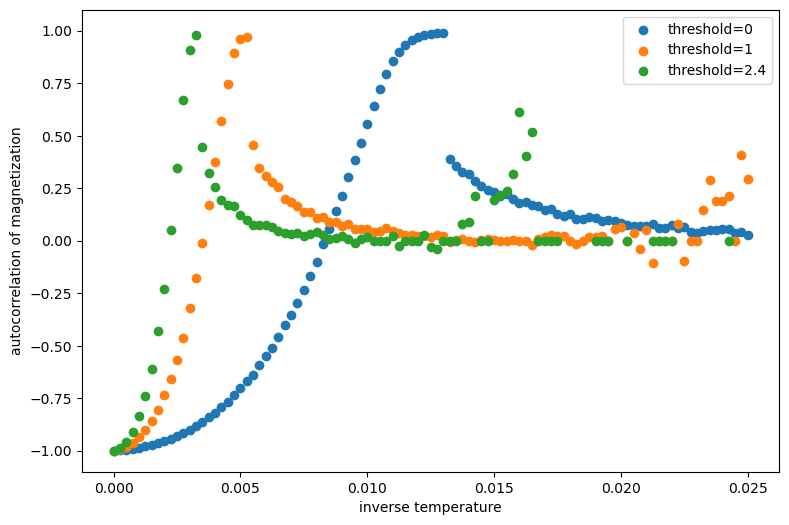

In [61]:
start_row = 0
end_row = betas.numel()
betas_from_min = betas[start_row:end_row]
fig, axs = plt.subplots( nrows=1, ncols=1, figsize=(9, 6) )
stat_vals = mean_mag.abs()
stat_name = '|magnetization|'
stat_vals = mag_autocorr
stat_name = 'autocorrelation of magnetization'
for target_threshold in [0, 1.0, 2.4]:
    threshold_index = torch.argmin( torch.abs(thresholds-target_threshold) )
    threshold = thresholds[threshold_index]
    print(f'threshold closest to target {target_threshold:.3g} is {threshold:.3g} at index {threshold_index}')
    stat_vals_at_threshold = stat_vals[start_row:end_row,threshold_index]
    axs.scatter( depytorch(betas_from_min), depytorch(stat_vals_at_threshold), label=f'threshold={threshold:.3g}' )
# axs.set_xticklabels( axs.get_xticklabels(), rotation=90, ha='right' )
axs.legend()
axs.set_xlabel('inverse temperature')
axs.set_ylabel(stat_name)
axs.set_ylim([-1.1, 1.1])
# axs.set_title(f'{xname} vs {yname}')
plt.show()